# Analysis and figures for mm-wave cavity paper
[_Optically accessible high-finesse millimeter-wave resonator for cavity quantum electrodynamics with atom arrays_](https://arxiv.org/abs/2506.05804)

## Preliminaries

### Religion

In [1]:
R'''
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Votive offering for poor code health below
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                       _oo0oo_
                      o8888888o
                      88" . "88
                      (| -_- |)
                      0\  =  /0
                    ___/`---'\___
                  .' \\|     |// '.
                 / \\|||  :  |||// \
                / _||||| -:- |||||- \
               |   | \\\  -  /// |   |
               | \_|  ''\---/''  |_/ |
               \  .-\__  '-'  ___/-. /
             ___'. .'  /--.--\  `. .'___
          ."" '<  `.___\_<|>_/___.' >' "".
         | | :  `- \`.;`\ _ /`;.`/ - ` : | |
         \  \ `_.   \_ __\ /__ _/   .-` /  /
     =====`-.____`.___ \_____/___.-`___.-'=====
                       `=---='

     ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
               佛祖保佑         永無BUG
     ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
'''
None

### Imports

In [2]:
# auto-reload any edits to `suprtools`
%load_ext autoreload
%autoreload 2

In [3]:
import itertools
from pathlib import Path

In [4]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
import skrf as rf
from matplotlib import gridspec, ticker
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from scipy.constants import c, pi
from tqdm import tqdm
from uncertainties import ufloat, ufloat_fromstr, unumpy as unp

In [5]:
from suprtools.cavity_loss import Niobium, geom_factor_f, TemperatureFit
from suprtools.cryo.thermometer_calibration import LinearInterpolator
from suprtools.fp_theory.geometry.anticrossing import AnticrossingFit
from suprtools.fp_theory.geometry import (
    FiniteMirrorSymmetricCavity,
    SymmetricCavityGeometry,
)
from suprtools.fp_theory.geometry.tem00fit import TEM00Fit
from suprtools.gmsh_utils import gmsh, CurlGradField
from suprtools.plotting import (
    annotate_line,
    colors,
    label_subplots,
    mpl_usetex,
    remove_figure_padding,
    savefig_tightly,
    set_reci_ax,
    setup_paper_style,
)
from suprtools.plotting.style import (
    columnwidth_mpl_in,
    textwidth_mpl_in,
    descending_vlabel_kw,
)
from suprtools.plotting.units import Units
from suprtools.rf import (
    FabryPerotModeParams,
    ModeMaskingPolicy,
    WideScanData,
    fit_mode,
    test_a_fit,
)
from suprtools.rf.insertion_loss import MeasuredLossyLine, RootFrequencyLossElement
from suprtools.rf.ringdown import RingdownSet, RingdownSetSweep

In [6]:
import paper_figures.constants as lab_constants
import paper_figures.style as style
from paper_figures import fit_fig4_model

In [7]:
# reset to default matplotlib style
plt.rcdefaults()
setup_paper_style(usetex=True)

### Data directories

In [8]:
mirror_test_dir = Path('data')

# g0 geometry cooldowns
caecilia_data_dir = mirror_test_dir / 'Caecilia'
cassia_data_dir = mirror_test_dir / 'Cassia'

# g1 geometry cooldowns
flaminia_data_dir = mirror_test_dir / 'Flaminia'
gemina_data_dir = mirror_test_dir / 'Gemina'

# g2 geometry
hadriana_data_dir = mirror_test_dir / 'Hadriana'

smallfem_sim_dir = mirror_test_dir / 'smallfem-sims'
profilometry_dir = mirror_test_dir / 'profilometry'
thermometer_cal_dir = mirror_test_dir / 'calibrations'

### Fit $g_{1,2}$ geometries from $\mathrm{TEM}_{00}$ frequencies

#### Gemina ($g_1$)

In [9]:
gemina_widescan = WideScanData.from_windows(
    gemina_data_dir / '20240908-probesin-wide-scan-ifbw300hz',
    '4 K, probes in, 300 Hz IFBW',
    sample_temps=True,
)

100%|██████████| 480/480 [00:01<00:00, 241.26it/s]


Freq (GHz)                FWHM                Residue mag       
   77.581136(27)            8.00(35) MHz           27.0(1.4) kHz
  77.5782658(18)               51(4) kHz               7.2(4) Hz
  77.5777165(12)           47.9(2.4) kHz               9.9(4) Hz


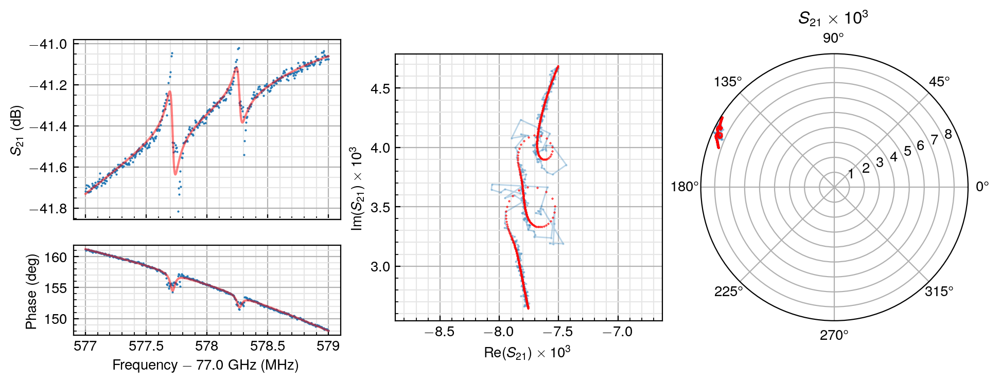

In [10]:
# TEM00 freqs obtained by fits like these
test_a_fit(
    gemina_widescan.s21,
    77.578,
    0.002,
    n_poles_cmplx=3,
)

(<Figure size 600x400 with 2 Axes>,
 array([<Axes: ylabel='Frequency mod FSR (GHz)'>,
        <Axes: xlabel='Longitudinal mode index $q$', ylabel='Residuals (kHz)'>],
       dtype=object))

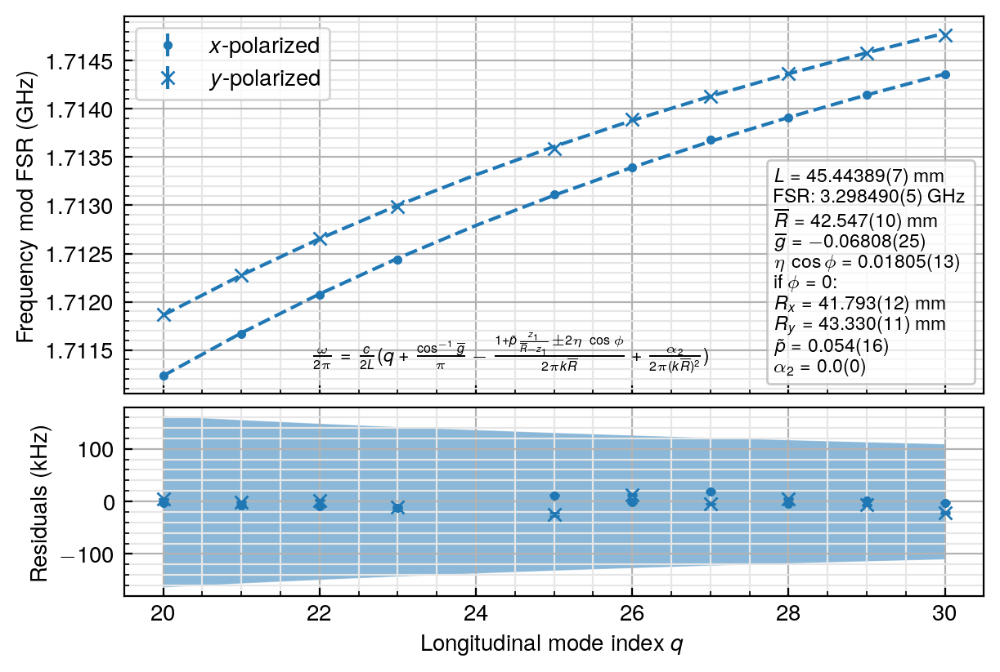

In [11]:
gemina_fit_freqs_strs = [
    '67.6810377(29)',
    '67.6816728(5)',
    '70.9799661(15)',
    '70.9805718(5)',
    '74.2788588(5)',
    '74.2794432(4)',
    '77.5777166(12)',
    '77.5782662(18)',
    '84.1753737(5)',
    '84.1758433(32)',
    '87.4741406(9)',
    '87.4746411(19)',
    '90.7729201(18)',
    '90.7733648(5)',
    '94.0716369(4)',
    '94.0720975(11)',
    '97.37036553(18)',
    '97.3707944(8)',
    '100.6690696(6)',
    '100.6694724(14)',
]
fit_freqs = np.array([1e+9 * ufloat_fromstr(s) for s in gemina_fit_freqs_strs])
fit_q_vals = np.concatenate((np.arange(20, 24), np.arange(25, 31)))
fit_qpols = np.array([
    (q, pol)
    for q in fit_q_vals
    for pol in [+1, -1]
])
gemina_widescanfit = TEM00Fit(fit_qpols[:, 0], fit_qpols[:, 1], fit_freqs)
gemina_widescanfit.fit(p0=(50e-3, 42e-3, 0, 0, 0))
gemina_widescanfit.lmfit(alpha2=False)
gemina_widescanfit.plot(method='lmfit')

#### Hadriana ($g_2$)

In [12]:
hadriana_widescan = WideScanData.from_windows(
    hadriana_data_dir / '20241102-probesin-wide-scan-ifbw300hz',
    '4 K, probes in, 300 Hz IFBW',
    sample_temps=True,
)

100%|██████████| 480/480 [00:01<00:00, 243.47it/s]


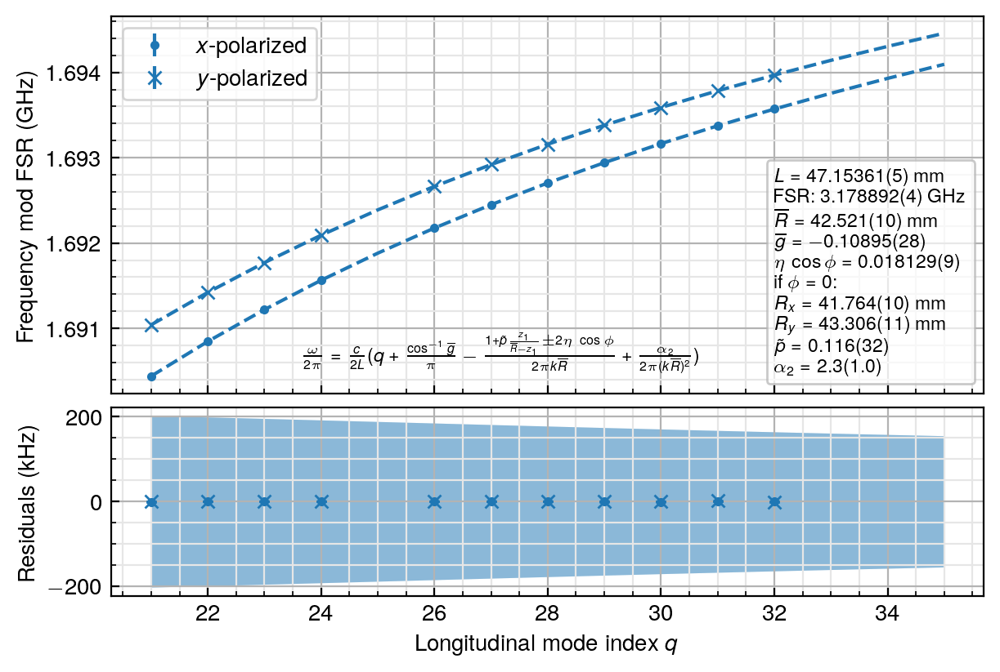

In [13]:
hadriana_fit_freqs_strs = [
    '68.44716831(19)',
    '68.44777132(19)',
    '71.62646825(9)',
    '71.62704332(10)',
    '74.80573366(8)',
    '74.80628334(7)',
    '77.98496881(6)',
    '77.98549687(8)',
    'nan +/- nan',
    'nan +/- nan',
    '84.34336428(7)',
    '84.34385229(9)',
    '87.52253038(12)',
    '87.52300107(9)',
    '90.70167688(11)',
    '90.70213074(15)',
    '93.88080714(8)',
    '93.88124434(12)',
    '97.05992040(18)',
    '97.06034494(15)',
    '100.2390227(4)',
    '100.23943400(29)',
    '103.41811127(28)',
    '103.4185068(5)',
    'nan +/- nan',
    'nan +/- nan',
    'nan +/- nan',
    'nan +/- nan',
    'nan +/- nan',
    'nan +/- nan',
]
fit_freqs = np.array([1e+9 * ufloat_fromstr(s) for s in hadriana_fit_freqs_strs])
# fit_q_vals = np.concatenate((np.arange(20, 24), np.arange(25, 31)))
fit_q_vals = np.arange(21, 36)
fit_qpols = np.array([
    (q, pol)
    for q in fit_q_vals
    for pol in [+1, -1]
])
hadriana_widescanfit = TEM00Fit(fit_qpols[:, 0], fit_qpols[:, 1], fit_freqs)
# widescanfit.fit(p0=(50e-3, 42e-3, 0, 0, 0))
# widescanfit.lmfit(alpha2=False)
hadriana_widescanfit.lmfit()
fig_vortex, axs = hadriana_widescanfit.plot(method='lmfit')


In [14]:
gemina_geo = gemina_widescanfit.geometry(method='lmfit')
hadriana_geo = hadriana_widescanfit.geometry(method='lmfit')

## Figure 1

In [15]:
from paper_figures import cavity_diagram, confocal_optimality_plot

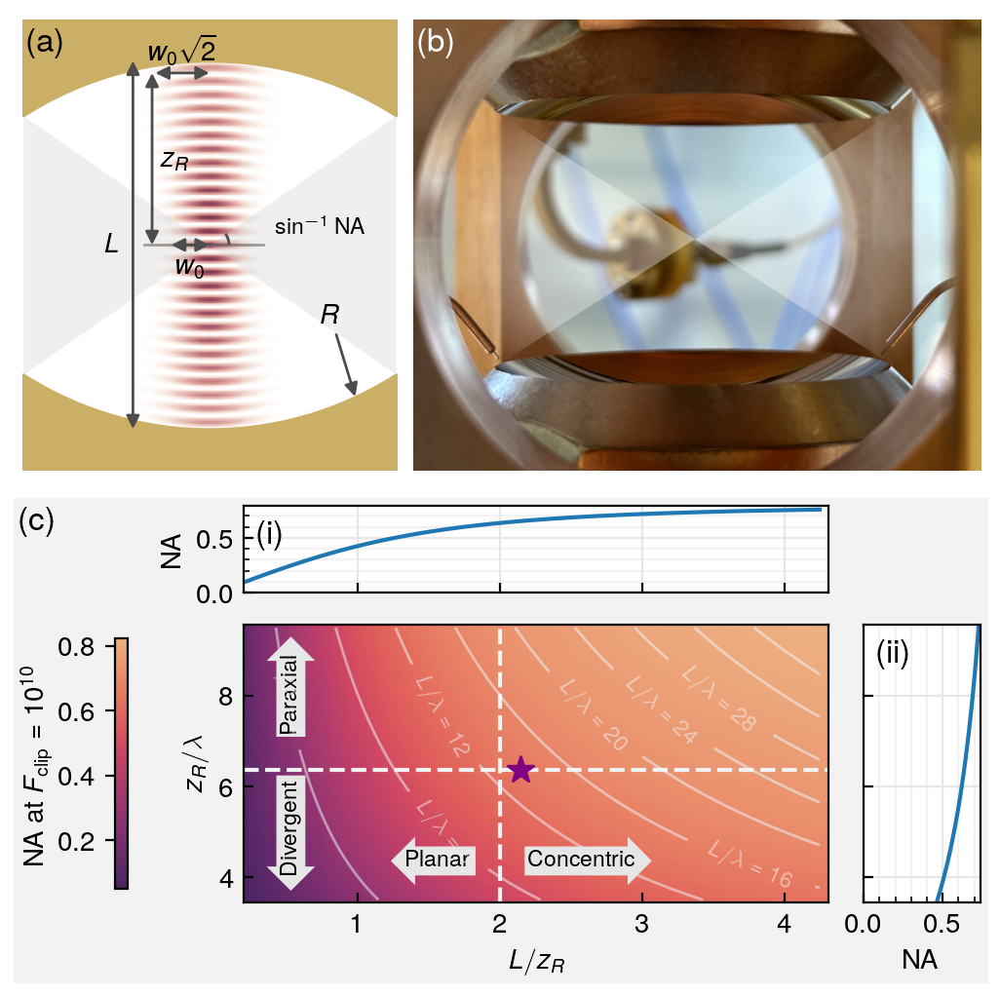

In [16]:
hspace = 0.035

fig1_1col = plt.figure(
    layout='constrained',
    figsize=(columnwidth_mpl_in, 5.0),
)
row_subfigs = fig1_1col.subfigures(
    2, 1,
    # wspace=0,
    hspace=hspace,
    height_ratios=[1, 1.03],
)

row_subfigs[1].set_facecolor('0.95')

# row_subfigs[0].set_facecolor('sienna')
# row_subfigs[1].set_facecolor('lightskyblue')

row_axs = row_subfigs[0].subplots(
    ncols=2,
    nrows=1,
    gridspec_kw=dict(
        left=0,
        right=1,
        bottom=0,
        top=1,
        width_ratios=[1, 1.515],
    ),
)

cavity_diagram(
    row_axs[0],
    target_geo=gemina_geo,
    target_mode=27,
)

cavity_img = matplotlib.image.imread('img/cavity-photo-annotated.png')
row_axs[1].imshow(cavity_img)
row_axs[1].axis('off')

target_freq = 90e+9
target_wavelen = c / target_freq

def x_to_g(x):
    return (4 - x**2) / (4 + x**2)

def g_to_x(g):
    return 2 * np.sqrt((1-g)/(1+g))

def lfunc(x, y):
    return x * y * target_wavelen

xvals = np.geomspace(0.2, 4.25, num=101)
yvals = np.linspace(3.5, 9.5)

pcolor_ax, ax_hcut, ax_vcut, cbar = confocal_optimality_plot(
    row_subfigs[1],
    target_freq=target_freq,
    target_geo=gemina_geo,
    target_finesse=1e+10,
    xfunc=(lambda g, length: g_to_x(g)),
    yfunc=(lambda g, length: np.sqrt((1+g)/(1-g)) * length / (2 * target_wavelen)),
    gfunc=(lambda x, y: x_to_g(x)),
    lfunc=lfunc,
    xvals=xvals,
    yvals=yvals,
    xlabel=r'$L/z_R$',
    ylabel=R'$z_R/\lambda$',
    # contours=(2**np.arange(10)),
    cut_x=2,
    colorbar_kw=dict(location='left', shrink=0.9),
    gridspec_kw=dict(height_ratios=[1,3.2], width_ratios=[4,0.8]),
)
# pcolor_ax.tick_params(axis='y', which='both', color='0.5')
row_subfigs[1].align_xlabels()

# pcolor_ax.set_xlabel(R'$L/z_R$', labelpad=1)
# pcolor_ax.set_ylabel(R'$z_R/\lambda$', labelpad=1)
cbar.set_label(R'NA at $F_\text{clip} = 10^{10}$', labelpad=2.5)
cbar.ax.tick_params(which='both', direction='out')


# workaround to ensure that ticks are plotted over gridlines
# current matplotlib draws each axis as a unit
ax_hcut.xaxis.set_zorder(ax_hcut.yaxis.get_zorder() + 0.01)
ax_vcut.yaxis.set_zorder(ax_vcut.xaxis.get_zorder() + 0.01)

label_subplots(fig1_1col, [*row_axs, row_subfigs[1]], adjust=(2, -3), colors=['black', 'white', 'black'])
# remove_figure_padding(fig1_1col)

In [17]:
# savefig_tightly(fig1_1col, '20250523-cavity-design.pdf', dpi=600)

## Figure 2

In [18]:
cassia_00_fitlocs = 1e9 * np.array([
    [
        77.112297221,
        80.538957677,
        83.965621657,
        87.392400480,
        90.81805,
        94.24486,
        97.67145,
        np.nan,
        np.nan,
        np.nan,
    ],
    [
        77.112865023,
        80.539502144,
        83.96614,
        87.392871087,
        90.81851,
        94.24533,
        97.67189,
        101.09839,
        np.nan,
        107.951309039,
    ],
]).T

In [19]:
cassia_00_longi_inds = np.arange(22, 32)

cassia_00_fitlocs_flat = cassia_00_fitlocs.T.flatten()
cassia_00_mask = ~np.isnan(cassia_00_fitlocs_flat)
cassia_00_fitlocs_nonan = cassia_00_fitlocs_flat[cassia_00_mask]

cassia_00_inds = np.transpose(np.array(np.meshgrid(cassia_00_longi_inds, [+1, -1])), axes=[1, 2, 0]).reshape(-1, 2)
cassia_00_inds_nonan = cassia_00_inds[cassia_00_mask]

cassia_00_fit = TEM00Fit(cassia_00_inds_nonan[:, 0], cassia_00_inds_nonan[:, 1], cassia_00_fitlocs_nonan)


In [20]:
cassia_00_fit.fit(p0=(43e-3, 42e-3, 0.0185, 0, 0))

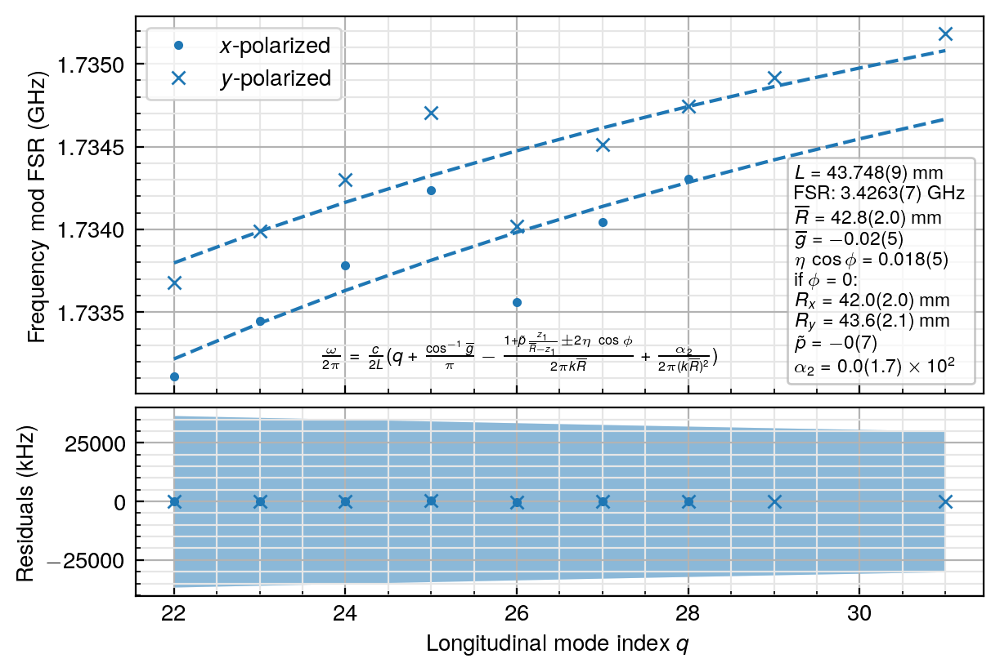

In [21]:
cassia_00_fit

In [22]:
cassia_00_fit.lmfit(alpha2=False)

(<Figure size 600x400 with 2 Axes>,
 array([<Axes: ylabel='Frequency mod FSR (GHz)'>,
        <Axes: xlabel='Longitudinal mode index $q$', ylabel='Residuals (kHz)'>],
       dtype=object))

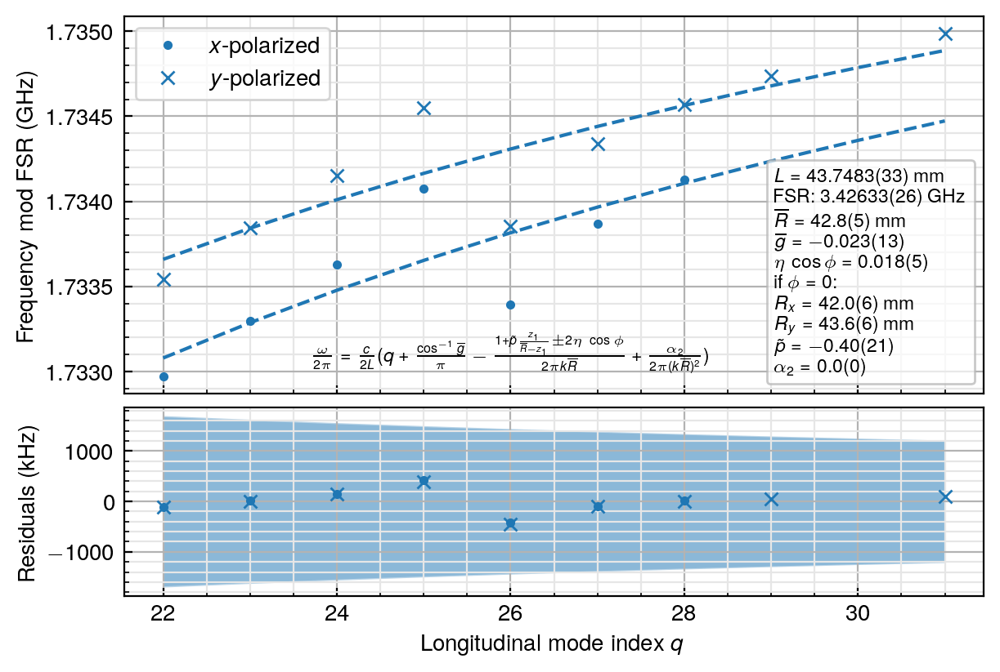

In [23]:
cassia_00_fit.plot(method='lmfit')

In [24]:
cassia_wide_scan = (
    WideScanData.from_windows(cassia_data_dir / '20230707-wide-scan-ifbw30hz-a/', '7/7 wide scan (IF BW 30 Hz)')
    +
    WideScanData.from_windows(cassia_data_dir / '20230707-wide-scan-ifbw30hz-b/', '7/7 wide scan (IF BW 30 Hz)')
)

100%|██████████| 167/167 [00:00<00:00, 300.48it/s]
/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/skrf/frequency.py:275: InvalidFrequencyWarning: Frequency values are not monotonously increasing!
To get rid of the invalid values call `drop_non_monotonic_increasing`
  temp_freq.check_monotonic_increasing()


In [25]:
# mode frequencies and initial fitting parameters to use
# for each polarization [x, y],
# for each "branch" of modes:
#   * upper branch in TEM00/TEM04 avoided crossing
#   * N=2 mode we have another avoided crossing with (not considered in our analysis)
#   * lower branch in avoided crossing
# for each FSR
#   - mode frequency in GHZ,
#   - window size to fit (by vector fitting), in MHz,
#   - number of complex poles to include in the fit

cassia_vf_params = [
    # x polarization
    [
        # upper 
        
        [
            (77.112297221, 3, 4),
            (80.538957677, 0.9, 2),
            (83.965621657, 3, 4),
            (87.392400480, 4, 3),
            (90.820400701, 3.5, 4),
            (94.249853173, 5, 3),
            (97.679330921, 7, 5),
            (101.108370237, 4, 4),
            (104.537106258, 5, 4),
            (107.966100734, 3.2, 3),
        ],
        [
            (77.116822947, 2.5, 3),
            (np.nan, 0, 0),
            (83.972672450, 2.5, 3),
            (87.400339051, 4, 4),
            (90.827916793, 4, 4),
            (94.255352245, 4, 4),
            (97.682687742, 4, 4),
            (101.109954998, 3, 3),
            (104.537110675, 3, 3),
            (107.964240271, 3, 3),
        ],
        # lower branch
        [
            (77.097681985, 10, 4),
            (80.529301509, 10, 3),
            (83.960165433, 10, 3),
            (87.389401523, 10, 6),
            (90.818047384, 5, 5),
            (94.244860716, 4, 4),
            (97.671445404, 3, 3),
            (np.nan, 0, 0),
            (np.nan, 0, 0),
            (np.nan, 0, 0),
        ],
    ],
    # y polarization
    [
        # upper branch
        [
            (77.112865023, 3, 4),
            (80.539502144, 2, 3),
            (83.966140923, 3, 4),
            (87.392871087, 4, 3),
            (90.820639896, 4, 4),
            (np.nan, 0, 0), # (94.250053173, 8, 3),
            (97.679389305, 7, 5),
            (np.nan, 0, 0),
            (104.537341326, 5, 4),
            (np.nan, 0, 0),
        ],
        [
            (77.116996234, 2.5, 3),
            (80.545004484, 2.5, 3),
            (83.972847383, 2.5, 3),
            (87.400568479, 4, 4),
            (90.828118698, 4, 4),
            (94.255544018, 4, 4),
            (97.682890383, 4, 4),
            (101.110135088, 3, 3),
            (104.537391246, 3, 3),
            (107.964425044, 3, 4),
        ],
        # lower branch
        [
            (np.nan, 0, 0),
            (np.nan, 0, 0),
            (np.nan, 0, 0),
            (np.nan, 0, 0),
            (90.818507306, 5, 5),
            (94.245324794, 4, 4),
            (97.671892194, 3, 3),
            (101.098393052, 2.5, 2),
            (np.nan, 0, 0),
            (107.951309039, 0.9, 2),
        ],
    ],
]

In [26]:
cassia_vfs = [
    [
        [
            (
                None if np.isnan(center_ghz) else
                fit_mode(cassia_wide_scan.s21, center_ghz, span_mhz / 1e3, n_poles_cmplx=n_poles_cmplx)
            )
            for (center_ghz, span_mhz, n_poles_cmplx) in tqdm(vf_params_branch)
        ]
        for vf_params_branch in vf_params_pol
    ]
    for vf_params_pol in cassia_vf_params
]

  0%|          | 0/10 [00:00<?, ?it/s]/Users/txz/Desktop/data-avail-test/suprtools/build/__editable__.suprtools-2025.8.14-py3-none-any/suprtools/rf/freqdomain.py:1520: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly.
Hint: the linear system was ill-conditioned (max. condition number was 5.797054103050861e+18).
  vf.vector_fit(n_poles_real=0, n_poles_cmplx=n_poles_cmplx)
 10%|█         | 1/10 [00:00<00:04,  1.89it/s]/Users/txz/Desktop/data-avail-test/suprtools/build/__editable__.suprtools-2025.8.14-py3-none-any/suprtools/rf/freqdomain.py:1520: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly.
Hint: the linear system was ill-conditioned (max. condition number was 39222782386227.52).
  vf.vector_fit(n_poles_real=0, n_poles_cmplx=n_poles_cmplx)
 60%|███

In [27]:
def vf_to_uparams(vf):
    vf_ctr = vf.network.frequency.center
    narrow_inds = (unp.nominal_values(vf.refined_fwhms) < 300e+6)
    mode_ind = np.argmin(np.abs(unp.nominal_values(vf.refined_resonances)[narrow_inds] - vf_ctr))
    
    return vf.refined_resonances[narrow_inds][mode_ind], vf.refined_fwhms[narrow_inds][mode_ind]

In [28]:
def vf_to_urecords(maybe_vf):
    if maybe_vf is None:
        return (ufloat(np.nan, np.nan),) * 4
    return maybe_vf.closest_pole_uparams(maybe_vf.network.frequency.center)

In [29]:
cassia_mode_uparams = np.array([
    [
        [
            (
                (np.nan, np.nan) if vf is None else
                vf_to_uparams(vf)  # , norm=True, correlated_noise_db=1e-4)
            )
            for vf in vfs_branch
        ]
        for vfs_branch in vfs_pol
    ]
    for vfs_pol in cassia_vfs
])

In [30]:
cassia_mode_records = np.array([
    [
        [vf_to_urecords(vf) for vf in vfs_branch]
        for vfs_branch in vfs_pol
    ]
    for vfs_pol in cassia_vfs
])

In [31]:
cassia_4k_mode_params = FabryPerotModeParams(
    [
        [+1, -1],   # x, y polarization
        [+1, 20, -1],  # mode branch
        np.arange(22, 31 + 1),  # 00 mode number
    ],
    cassia_mode_records,
    cassia_00_fit.geometry().fsr,
)

In [32]:
cassia_plot_inds = np.arange(22, 30)
cassia_plot_mask = (cassia_00_longi_inds < 30)

In [33]:
cassia_insertion_loss_db_est = ufloat(37.5, 2.5)

cassia_4k_mode_params_plot = cassia_4k_mode_params[..., cassia_plot_mask]
cassia_mode_uparams_plot = cassia_mode_uparams[..., cassia_plot_mask, :]
cassia_4k_mode_coupling_rates_plot = cassia_4k_mode_params_plot.res_mag * rf.db_2_mag(cassia_insertion_loss_db_est)


In [34]:
branch_mean_freqs = np.nanmean(unp.nominal_values(cassia_mode_uparams_plot)[..., 0], axis=0)[[0,2]]
qs_mesh, branches_mesh = np.meshgrid(cassia_plot_inds, [+1, -1])
ansatz_power = 0

anticross_fit = AnticrossingFit(
    np.rec.fromarrays(
        [qs_mesh.ravel(), branches_mesh.ravel(), branch_mean_freqs.ravel()],
        names=['q', 'branch', 'freq']
    ),
    ansatz_power=ansatz_power,
)

In [35]:
anticross_fit.fit(
    p0=(43.74e-3, 42.57e-3, 0.016, 0.082, 0.1 / 2000**(anticross_fit.ansatz_power + 1)),
    bounds=[
        [43e-3, 42e-3, -1, 0, 0],
        [44e-3, 43e-3, +1, 1, 10],
    ]
)

trying L, R = 43.749, 42.564 mm; eta, p = 0.017, 0.090, g = 0.0003: : 48it [00:18,  2.66it/s] 


Typical coupling strength (Hz):

In [36]:
print(anticross_fit.geometry.fsr * anticross_fit.upopt[4] * (8 * pi * (2 * pi * 90e+9/ c) * anticross_fit.geometry.mirror_curv_rad)**(ansatz_power))

(9.9+/-1.4)e+05


### Coupled harmonic oscillator fitting

In [37]:
# fin_fit_ufwhms = np.transpose(cassia_mode_uparams_plot[:, [0, 2], :, 1], (1, 0, 2))
fin_fit_ufwhms = cassia_mode_uparams_plot[:, [0, 2], :][..., 1]
branch_fit_shape = fin_fit_ufwhms.shape
branch_shaped = np.broadcast_to(np.array([+1, -1]).reshape(1, -1, 1), branch_fit_shape)
qs_shaped = np.broadcast_to(cassia_plot_inds.reshape(1, 1, -1), branch_fit_shape)

not_nan_mask = ~np.isnan(unp.nominal_values(fin_fit_ufwhms.flatten()))

In [38]:
from paper_figures.fig2 import mixing_wavg_fit, make_avoided_crossing_plot_column, make_parax_shifts_column

In [39]:
wavg_finfit_upopt = mixing_wavg_fit(
    anticross_fit, qs_shaped.flatten()[not_nan_mask], branch_shaped.flatten()[not_nan_mask], fin_fit_ufwhms.flatten()[not_nan_mask],
    p0=(1e+4, 1e+6),
    bounds=(
        [1e+3, 1e+5],
        [1e+5, 1e+7],
    ),
)

tried values 6.99e+03, 8.89e+05, rms err = 323420.39921595366, chi2 = 26.525102706097954: : 18it [00:10,  1.70it/s]


In [40]:
coupling_fit_ucoupls = cassia_4k_mode_coupling_rates_plot[:, [True, False, True], :]
coupl_not_nan_mask = ~np.isnan(unp.nominal_values(coupling_fit_ucoupls.flatten()))

### Refine cavity geometry fit for $\overline{g}_0$ using higher-order mode locations

#### Fitting

Freq (GHz)                FWHM                Residue mag       
      90.9993(4)           12.00(15) MHz            2.05(10) kHz
   90.981743(14)           2.946(17) MHz              44.6(4) Hz
  90.9844136(24)              699(5) kHz              7.45(6) Hz
  90.9834259(22)              422(4) kHz              3.27(4) Hz


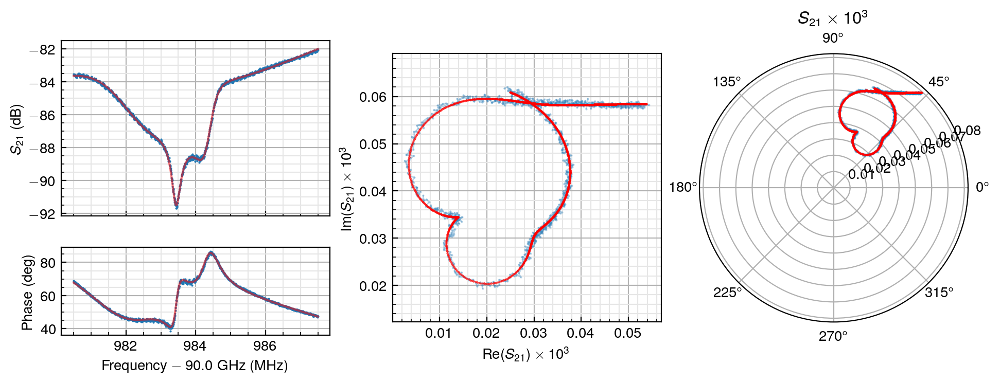

In [41]:
# one fit among many:
test_a_fit(
    cassia_wide_scan.s21,
    90.984,
    00.007,
    n_poles_cmplx=4,
)

In [42]:
cassia_00_fit.upopt

(0.04374837765467369+/-9.476121594502446e-06,
 0.04276291880331611+/-0.0020251548496163386,
 0.018381852447168102+/-0.005131766167360095,
 -0.3732071592688459+/-6.772229591004021,
 0.13102018704484858+/-171.9254800071596)

In [43]:
# obtained by individual vector fits such as those shown in previous cell
cassia_fit_homs = [
    (2, 0, '90.8279169(4)'),
    (2, 1, '90.8281184(4)'),
    (2, 2, '90.8772951(4)'),
    (2, 3, '90.8778574(17)'),
    (4, 2, '108.023876(4)'),
    (4, 8, '80.7730896(25)'),
    (6, 0, '104.513636(5)'),
    (4, 6, '90.9834259(22)'),
    (4, 7, '90.9844136(24)'),
    (4, 8, '91.0486715(15)'),
    (4, 9, '91.0499410(30)'),
]
cassia_refined_geo = cassia_00_fit.refine_fit(cassia_fit_homs)

trying L, R = 43.750, 42.468 mm; eta, p = 0.019, 0.142: : 26it [00:07,  3.32it/s] 


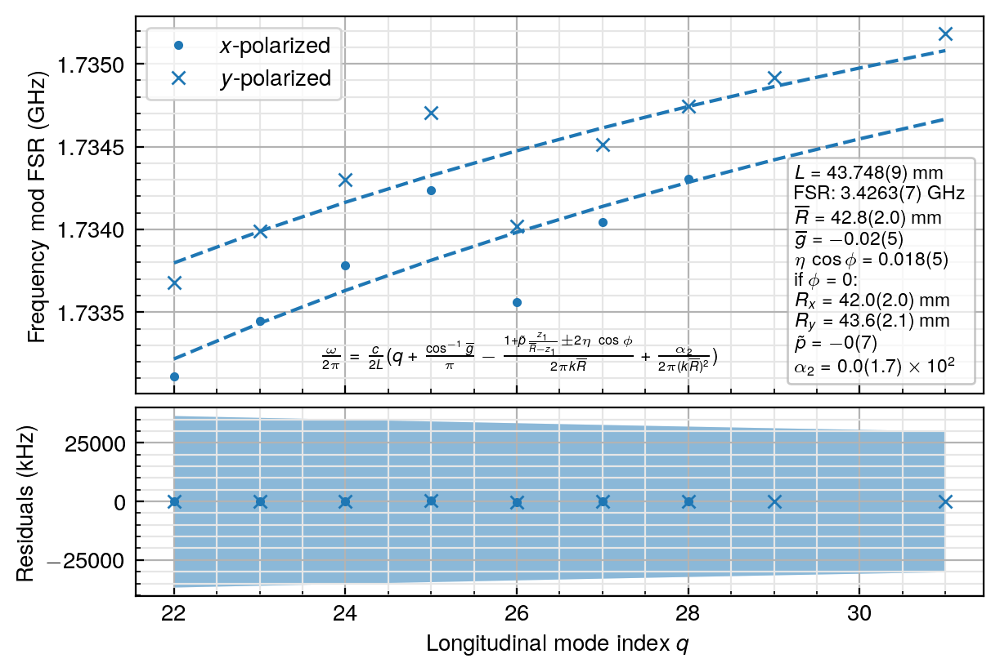

In [44]:
cassia_00_fit

In [45]:
fsr_guess_ghz = anticross_fit.geometry.fsr/ 1e+9

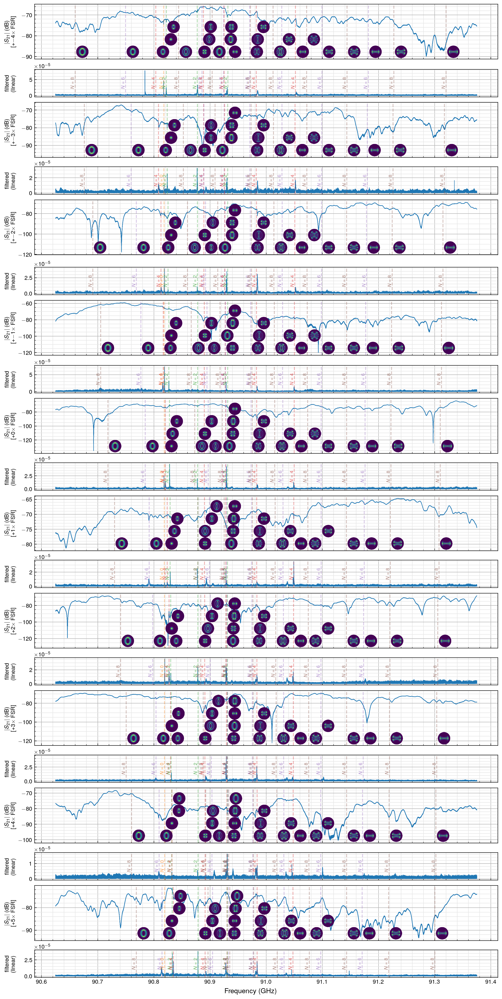

In [46]:
_, axs = cassia_wide_scan.s21.fsr_compare_plots(
    91.0, 0.75,
    fsr_guess_ghz,
    offsets=range(-4, 6),
    filt=cassia_wide_scan.s21.make_filter(lambda_hp=2.0e+6, high_pass_order=2),
    geo=cassia_refined_geo,
)

### Shifts from paraxial (right column)

In [47]:
high_pass_kws = dict(
    lambda_hp=1.0e+6,
    high_pass_order=2,
)

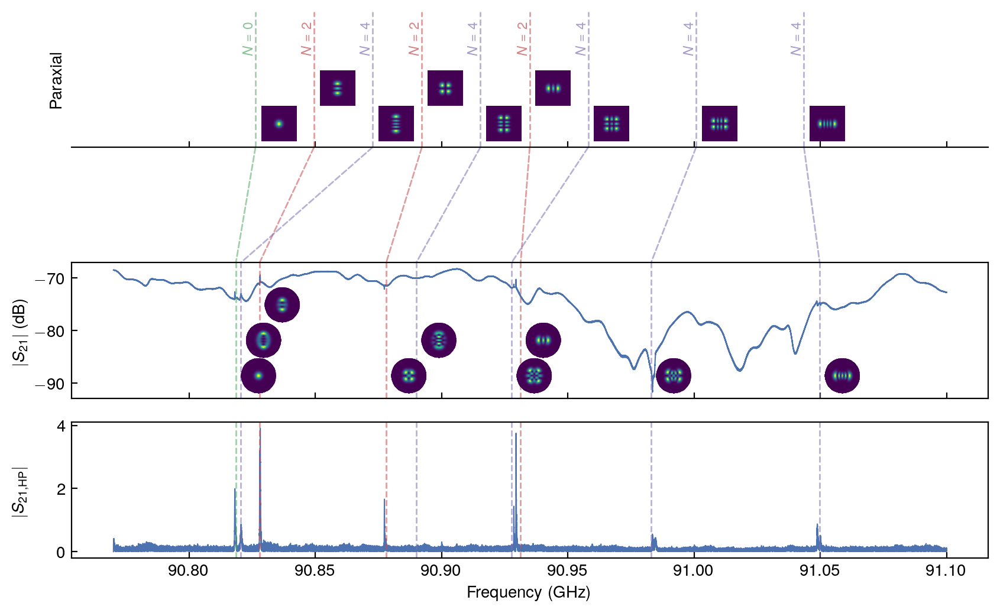

In [48]:
fig_parax_column, axs = plt.subplots(figsize=(10, 6), sharex=True, nrows=4, gridspec_kw=dict(height_ratios=[2,1,2,2]))

filt = cassia_wide_scan.s21.make_filter(
    **high_pass_kws,
    gain=1e+5,
)
make_parax_shifts_column(
    fig_parax_column,
    axs,
    90.77, 91.1,
    s21_network=cassia_wide_scan.s21,
    geo=cassia_refined_geo,
    filt=filt,
    mode_colorfunc=style.mode_colorfunc,
    annotate_kw=dict(
        alpha=0.55,
        linewidth=1,
    ),
    plot_kw=dict(color=sns.color_palette('deep')[0], linewidth=0.75),
    parax_inset_kw=dict(inset_pad=0.35, inset_stagger=0.3, gap=30e+6),
    inset_kw=dict(inset_pad=0.3, inset_stagger=0.3),
)

In [49]:
from suprtools.fp_theory.modes import ScalarModeBasis
from suprtools.fp_theory.coupling_config import CouplingConfig

In [50]:
coupling_tem26 = cassia_refined_geo.coupling_matrix(26, ScalarModeBasis.make_even_basis(6), CouplingConfig.no_xcoupling, resonance_ratio=1/2)

In [51]:
eigvec = coupling_tem26.eigvecs[4]
np.where(np.abs(eigvec) < 1e-15, 0, eigvec)

array([ 0.        +0.j,  0.        +0.j,  0.        +0.j,  0.        +0.j,
        0.01604012+0.j, -0.04482801+0.j,  0.12246411+0.j, -0.31089272+0.j,
        0.62135451+0.j,  0.        +0.j,  0.        +0.j,  0.        +0.j,
        0.        +0.j,  0.        +0.j,  0.        +0.j,  0.        +0.j,
        0.        +0.j,  0.        +0.j,  0.        +0.j,  0.        +0.j,
        0.62135451+0.j, -0.31089272+0.j,  0.12246411+0.j, -0.04482801+0.j,
        0.01604012+0.j,  0.        +0.j,  0.        +0.j,  0.        +0.j,
        0.        +0.j,  0.        +0.j,  0.        +0.j,  0.        +0.j])

In [52]:
eigvec = coupling_tem26.eigvecs[5]
np.where(np.abs(eigvec) < 1e-15, 0, eigvec)

array([ 0.00000000e+00+0.j,  0.00000000e+00+0.j,  0.00000000e+00+0.j,
        0.00000000e+00+0.j, -1.28387645e-02+0.j,  4.25798257e-02+0.j,
       -1.21197713e-01+0.j,  3.10507666e-01+0.j, -6.22027514e-01+0.j,
        0.00000000e+00+0.j,  0.00000000e+00+0.j,  0.00000000e+00+0.j,
       -1.22124533e-15+0.j,  1.88737914e-15+0.j, -2.21350716e-15+0.j,
       -1.09634524e-15+0.j,  0.00000000e+00+0.j,  0.00000000e+00+0.j,
        0.00000000e+00+0.j,  0.00000000e+00+0.j,  6.22027514e-01+0.j,
       -3.10507666e-01+0.j,  1.21197713e-01+0.j, -4.25798257e-02+0.j,
        1.28387645e-02+0.j,  0.00000000e+00+0.j,  0.00000000e+00+0.j,
        0.00000000e+00+0.j,  0.00000000e+00+0.j,  0.00000000e+00+0.j,
        0.00000000e+00+0.j,  0.00000000e+00+0.j])

In [53]:
symmetrized_geometry = SymmetricCavityGeometry(
    cassia_refined_geo.length,
    cassia_refined_geo.mirror_curv_rad,
    eta_astig=0,
    asphere_p=cassia_refined_geo.asphere_p,
)

In [54]:
symmetrized_coupling = symmetrized_geometry.coupling_matrix(26, ScalarModeBasis.make_even_basis(6), CouplingConfig.no_xcoupling, resonance_ratio=1/2)

In [55]:
from collections.abc import Iterable, Sequence
from typing import assert_never

def draw_dividing_lines(fig: plt.Figure, axs: Sequence[Iterable[plt.Axes]], orientation, **kwargs):    
    # from https://stackoverflow.com/a/55465138
    r = fig.canvas.get_renderer()

    def get_bbox_lims(ax):
        bbox = ax.get_tightbbox(r).transformed(fig.transFigure.inverted())
        if orientation == 'horizontal':
            return bbox.y0, bbox.y1
        elif orientation == 'vertical':
            return bbox.x0, bbox.x1
        else:
            assert_never(orientation)

    def bounding_interval(tups: Iterable[tuple[float, float]]):
        min_current, max_current = None, None
        for lo, hi in tups:
            if lo > hi:
                raise ValueError
            
            if min_current is None:
                min_current = lo
            else:
                min_current = min(min_current, lo)

            if max_current is None:
                max_current = hi
            else:
                max_current = max(max_current, hi)
        return (min_current, max_current)

    # xmin, xmax or ymin, ymax for each column or row, depending on orientation
    coord_bounds = np.array([
        bounding_interval(
            get_bbox_lims(ax)
            for ax in ax_rowcol
        )
        for ax_rowcol in axs
    ])

    print(coord_bounds)

    # mean of xmax of one col and xmin of next (or ditto for y, for horizontal)
    mean_coords = np.c_[
        coord_bounds[1:],
        coord_bounds[:-1],
    ].mean(axis=1)

    # Draw lines at those coordinates
    for coord in mean_coords:
        if orientation == 'horizontal':
            linespec = ([0, 1], [coord, coord])
        elif orientation == 'vertical':
            linespec = ([coord, coord], [0, 1])
        print(linespec)
        line = plt.Line2D(*linespec, transform=fig.transFigure, **kwargs)
        fig.add_artist(line)


### Figure

/Users/txz/Desktop/data-avail-test/suprtools/build/__editable__.suprtools-2025.8.14-py3-none-any/suprtools/fp_theory/operators.py:69: RuntimeWarning: invalid value encountered in add
  self.components = np.array(components) + z
tried values 6.99e+03, 8.89e+05, rms err = 323420.39921595366, chi2 = 26.525102706097954: : 18it [00:10,  1.66it/s]
/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: invalid value encountered in std_dev (vectorized)
  outputs = ufunc(*inputs)
tried values 2.5, 701, rms err = 0.496234532910434, chi2 = 3.824291891793133: : 24it [00:14,  1.71it/s]    
/Users/txz/Desktop/data-avail-test/mmw-cavity-paper-analysis/paper_figures/style.py:32: RuntimeWarning: divide by zero encountered in log
  (lambda p: np.log(p / (1 - p)), lambda x: 1 / (1 + np.exp(-x))),


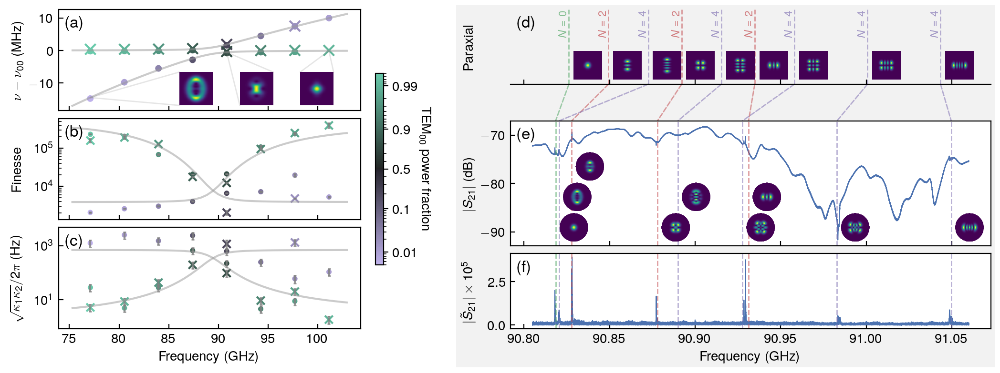

In [56]:
# gridspec inside gridspec

fig2 = plt.figure(
    figsize=(textwidth_mpl_in, 3.8),
    layout='constrained',
)

show_residues = True
subgridspecs = False

if subgridspecs:
    width_ratios = [4, 0.50, 5]
    division_x = (width_ratios[0] + 0.5 * width_ratios[1]) / sum(width_ratios)
    gs0 = gridspec.GridSpec(nrows=1, ncols=3, figure=fig2, width_ratios=width_ratios)
    gs00 = gs0[0].subgridspec(nrows=(3 if show_residues else 2), ncols=1)
    left_axs = gs00.subplots(sharex='col')

    # phantom_ax = gs0[1].subgridspec(nrows=1, ncols=1).subplots()

    gs01 = gs0[-1].subgridspec(nrows=4, ncols=1, height_ratios=[1.8,0.5,3,1.8])
    right_axs = gs01.subplots(sharex='col')

    fig2.align_ylabels(axs=left_axs)
    fig2.align_ylabels(axs=right_axs)
    fig2.align_xlabels()
else:
    subfigs = fig2.subfigures(
        ncols=2,
        nrows=1,
        wspace=0.04,
        # hspace=0,
        width_ratios=[4, 5],
    )
    left_axs = subfigs[0].subplots(nrows=(3 if show_residues else 2), ncols=1, sharex='col')
    right_axs = subfigs[1].subplots(
        nrows=4,
        ncols=1,
        height_ratios=[1.8,0.5,3,1.8],
        sharex='col',
    )
    subfigs[1].set_facecolor('0.95')
    right_axs[0].patch.set_alpha(0)

    subfigs[0].align_ylabels(axs=left_axs)
    subfigs[1].align_ylabels(axs=right_axs)

cb = make_avoided_crossing_plot_column(
    fig2,
    left_axs,
    anticross_fit,
    cassia_4k_mode_params_plot,
    cassia_mode_uparams_plot,
    cassia_insertion_loss_db_est,
    cmap=style.div_cmap,
    cmap_norm=style.mode_mixing_cmap_norm,
    colorbar_kw=dict(
        location='right',
        # pad=0.03,
        shrink=0.6,
        aspect=25,
    ),
    cbar_label_kw=descending_vlabel_kw,
    # wavg_fits=False,  # for perf during debugging
    short_labels=True,
)

# must enable minor ticks -before- setting minor locator
cb.ax.minorticks_on()
cb.ax.tick_params(which='both', direction='out')

# cb.ax.yaxis.set_ticks_position('left')
# cb.ax.yaxis.set_label_position('left')

# cb.set_label(R'$\mathrm{TEM}_{00}$ power fraction', fontsize='small')
cb.minorlocator = ticker.LogitLocator(minor=True)


filt = cassia_wide_scan.s21.make_filter(
    lambda_hp=1.0e+6,
    high_pass_order=2,
    gain=1e+5,
)

make_parax_shifts_column(
    fig2,
    right_axs,
    90.805, 91.06,
    s21_network=cassia_wide_scan.s21,
    geo=cassia_refined_geo,
    max_order=4,
    mode_colorfunc=style.mode_colorfunc,
    annotate_kw=dict(
        alpha=0.55,
        linewidth=1,
    ),
    filt=filt,
    plot_kw=dict(color=sns.color_palette('deep')[0]),
    parax_inset_kw=dict(inset_pad=0.35, inset_stagger=0.35, gap=18e+6),
    inset_kw=dict(inset_pad=0.3, inset_stagger=0.32),
)
right_axs[3].set_ylabel(R'$|\tilde{S}_{21}| \times 10^5$')


axs = np.concatenate((left_axs, right_axs[0:1], right_axs[2:]))
label_subplots(fig2, axs)
# remove_figure_padding(fig2)

if subgridspecs:
    fig2.add_artist(
        plt.Line2D(
            (division_x, division_x),
            (0.1, 1),
            transform=fig2.transFigure,
            # matplotlib.transforms.blended_transform_factory(
            #     fig2.transFigure,
            #     phantom_ax.transAxes,
            # ),
            color='0.7',
            linewidth=0.8,
        ),
    )

In [57]:
# savefig_tightly doesn't play nice with the color
# fig2.savefig('20250421-mode-mixing-noresidue.pdf', dpi=600)

## Figure 3

### Coupling data from _Caecilia_, _Cassia_ ($\overline{g}_0$ geometry at two probe positions)

In [58]:
# Equivalent stage position in _Caecilia_ and _Cassia_
caecilia_stage_pos = ufloat(-3.1, 0.2)
cassia_stage_pos = ufloat(-4.6, 0.2)

This particular _Caecilia_ data is a bunch of samples during a condense (taking us from ~4K to <1K).
We scanned repeatedly while condensing;
here we just load one scan (#30),
taken when temperatures had equilibrated near ~0.8 K
(see the _Caecilia_-specific notebook for details).

In [59]:
def row_to_ufloats(row):
    return pd.Series({
        'pole_real': ufloat(row['pole_real_n'], row['pole_real_s']),
        'pole_imag': ufloat(row['pole_imag_n'], row['pole_imag_s']),
        'residue_real': ufloat(row['residue_real_n'], row['residue_real_s']),
        'residue_imag': ufloat(row['residue_imag_n'], row['residue_imag_s']),
    })

caecilia_mode_fit_results_df = pd.read_csv(
    'intermediate-data/caecilia_condense_mode_info.csv',
    index_col=['pol', 'mode_q'],
).apply(row_to_ufloats, axis=1)

caecilia_fsr = 3.42621675e+9
caecilia_mode_params = FabryPerotModeParams(
    [[+1, -1], [26, 27, 28, 29, 30, 31]],
    caecilia_mode_fit_results_df.values.reshape(
        len(caecilia_mode_fit_results_df.index.unique('pol')),
        len(caecilia_mode_fit_results_df.index.unique('mode_q')),
        4
    ),
    caecilia_fsr,
)

Data from the _Cassia_ cooldown ($\overline{g}_0$ with probes retracted vs _Caecilia_),
taken at <1 K,
used here to show the strong probe coupling obtained in the $\overline{g}_0$ geometry.
Data was also taken with still heater power (30 mW, 110 mW) to try accessing higher temperatures,
but that data is not used here.

In [60]:
cassia_mode_fit_results_df = pd.read_csv(
    'intermediate-data/cassia_00_mode_params.csv',
    index_col=['pol', 'mode_q'],
).apply(row_to_ufloats, axis=1)

cassia_fsr = 3.42621675e+9
cassia_mode_params = FabryPerotModeParams(
    [[+1, -1], cassia_00_longi_inds],
    cassia_mode_fit_results_df.values.reshape(
        len(cassia_mode_fit_results_df.index.unique('pol')),
        len(cassia_mode_fit_results_df.index.unique('mode_q')),
        4
    ),
    cassia_fsr,
)


In [61]:
assert tuple(cassia_mode_fit_results_df.index.unique('mode_q')) == tuple(cassia_00_longi_inds)

In [62]:
near_confocal_coupling_data = dict[tuple[int, int], tuple[float, list, list]]()
near_confocal_plot_modes = [(26, +1), (26, -1)]

for q, pol in near_confocal_plot_modes:
    pol_index = {+1: 0, -1: 1}[pol]

    # use Cassia value as our canonical frequency
    # (particular choice doesn't really matter though)
    freq = cassia_mode_params.freqs[pol_index, q - 22].n
    if q >= 26:
        stage_pos = [cassia_stage_pos, caecilia_stage_pos]
        res_mags = [
            cassia_mode_params.res_mag[pol_index, q - 22],
            caecilia_mode_params.res_mag[pol_index, q - 26],
        ]
    else:
        stage_pos = [cassia_stage_pos]
        res_mags = [cassia_mode_params.res_mag[pol_index, q - 22]]

    near_confocal_coupling_data[q, pol] = (
        freq,
        stage_pos,
        res_mags,
    )


### Load _Flaminia_ data (measured couplings in $\overline{g}_1$ geometry)

In [63]:
flaminia_fsr = 3.2941326e+9

flaminia_sweep_stage_positions = [
    -3.75,
    -3.00,
    -2.25,
    -1.50,
    -0.75,
    0.00,
    0.50,
    1.00,
    1.25,
    1.50,
    1.75,
    2.00,
    2.50,
    2.75,
    3.25,
    3.5,
    4.0,
    4.5,
]

In [64]:
flaminia_mode_fit_results_df = pd.read_csv(
    'intermediate-data/flaminia_stage_scan_fit_params.csv',
    index_col=['stage_pos', 'mode_q', 'pol'],
).apply(row_to_ufloats, axis=1)

flaminia_mode_params = FabryPerotModeParams(
    [
        flaminia_sweep_stage_positions,
        list(range(lab_constants.flaminia_q_range[0], lab_constants.flaminia_q_range[1] + 1)),
        (+1, -1),
    ],
    flaminia_mode_fit_results_df.values.reshape(
        len(flaminia_mode_fit_results_df.index.unique('stage_pos')),
        len(flaminia_mode_fit_results_df.index.unique('mode_q')),
        len(flaminia_mode_fit_results_df.index.unique('pol')),
        4
    ),
    flaminia_fsr,
)


In [65]:
assert tuple(flaminia_mode_fit_results_df.index.unique('mode_q')) == tuple(range(lab_constants.flaminia_q_range[0], lab_constants.flaminia_q_range[1] + 1))

In [66]:
flaminia_mode_fit_results_df

pole_real                          pole_imag  \
stage_pos mode_q pol                                                          
-3.75     20     x      (-9.4+/-1.0)e+03    (4.246994372+/-0.000000009)e+11   
                 y    (-6.35+/-0.28)e+03  (4.2470340742+/-0.0000000027)e+11   
          21     x             nan+/-nan                          nan+/-nan   
                 y    (-3.78+/-0.12)e+03  (4.4540364326+/-0.0000000012)e+11   
          22     x            -2346+/-18                  466100029584+/-18   
...                                  ...                                ...   
 4.50     32     y            -2813+/-26                  673095637285+/-26   
          33     x    (-2.97+/-0.06)e+03  (6.9379188845+/-0.0000000006)e+11   
                 y    (-3.42+/-0.06)e+03  (6.9379430589+/-0.0000000006)e+11   
          34     x    (-3.39+/-0.04)e+03  (7.1449056562+/-0.0000000004)e+11   
                 y    (-3.46+/-0.04)e+03  (7.1449291318+/-0.0000000004)e+11   

                          residue_real     residue_imag  
stage_pos mode_q pol                                     
-3.75     20     x         0.60+/-0.08     -0.73+/-0.08  
                 y         0.83+/-0.05     -1.07+/-0.05  
          21     x           nan+/-nan        nan+/-nan  
                 y       0.195+/-0.005    0.069+/-0.006  
          22     x    -0.3474+/-0.0021  0.0310+/-0.0021  
...                                ...              ...  
 4.50     32     y         2.51+/-0.05     -7.15+/-0.06  
          33     x       0.001+/-0.014   -0.813+/-0.013  
                 y      -0.383+/-0.016   -0.931+/-0.015  
          34     x       2.408+/-0.028    2.368+/-0.031  
                 y       2.230+/-0.024    1.390+/-0.024  

[540 rows x 4 columns]

### Load ringdown data for _Gemina_ and _Hadriana_ cooldowns ($\overline{g}_{1,2}$)

In [67]:
# gemina_fsr = 3.298526e+9
gemina_rd_paths = {
    -1.50: '20240921-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stagen1p50mm',
    -0.75: '20240921-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stagen0p75mm',
    # 0.00: load_ringdowns('20240920-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage0p00mm'),
    0.00: '20240922-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage0p00mm-redux',
    0.75: '20240920-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage0p75mm',
    1.50: '20240920-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage1p50mm',
    2.25: '20240920-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage2p25mm',
    3.00: '20240919-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage3p00mm',
    3.75: '20240919-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage3p75mm',
    4.50: '20240919-tem20-34-00xy-ringdown-ptoff-turbooff-0p3k-stage4p50mm',
}
gemina_rds = RingdownSetSweep.from_directories(
    gemina_data_dir / '20240919-narrow-scans',
    gemina_rd_paths,
    modes=list(itertools.product(range(20, 35), (+1, -1))),
    geometry=gemina_geo,
    stage_pos_converter=lab_constants.stage_position_to_radius,
)
gemina_rds.fit()
gemina_rds.extract_finesses()

100%|██████████| 30/30 [00:02<00:00, 11.62it/s]


In [68]:
hadriana_modelist = list(itertools.product(range(21, 36), (+1, -1)))
hadriana_fsr = 3.178900e+9
hadriana_rd_paths = {
    -1.50: '20241107-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stagen1p50mm',
    -0.75: '20241107-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stagen0p75mm',
    0.00: '20241106-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stage0p00mm',
    0.75: '20241106-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stage0p75mm',
    1.50: '20241105-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stage1p50mm',
    2.25: '20241105-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stage2p25mm',
    3.00: '20241105-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stage3p00mm',
    3.75: '20241104-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stage3p75mm',
    4.50: '20241104-tem21-35-00xy-ringdown-ptoff-turbooff-0p3k-stage4p50mm',
}
hadriana_rds = RingdownSetSweep.from_directories(
    hadriana_data_dir / '20241104-narrow-scans',
    hadriana_rd_paths,
    modes=hadriana_modelist,
    geometry=hadriana_geo,
    stage_pos_converter=lab_constants.stage_position_to_radius,
)
hadriana_rds.fit()
hadriana_rds.extract_finesses()

100%|██████████| 30/30 [00:02<00:00, 10.99it/s]


### Insertion loss calibration

We remove the insertion loss of our probing setup from our measurements.
We characterize in a "thru calibration", at 1 K,
the loss for most of our probing apparatus:
all the waveguides, 2x flex coax, and 1x 1 mm female-female adapter ("bullet").
Some segments we cannot calibrate out;
for these we estimate the loss below:
- 1x 1 mm coax female-female adapter
- the two coaxial probe segments

For more details on the thru calibration, see the _Flaminia_-specific notebook.

In [69]:
thrus_dir = '20240607-thru-calibration'
cal_dirnames = {
    0.75: '20240608-thru0p75k-withVarattenSwitchAmp',
    0.88: '20240608-thru0p88k-withVarattenSwitchAmp',
    1.02: '20240609-thru1p02k-withVarattenSwitchAmp',
    1.025: '20240609-thru1p02k-withVarattenSwitchAmp-bis',
    1.10: '20240608-thru1p10k-withVarattenSwitchAmp',
    1.264: '20240608-thru1p264k-withVarattenSwitchAmp',
    4.47: '20240608-thru4p47k-withVarattenSwitchAmp',
    4.59: '20240608-thru4p59k-withVarattenSwitchAmp',
    4.7: '20240608-thru4p7k-withVarattenSwitchAmp',
    300: '20240607-roomTthru-withVarattenSwitchAmp',
}

In [70]:
thru_cals = {
    key: WideScanData.from_windows(flaminia_data_dir / thrus_dir / dirname, network_name=f'{key} K')
    for key, dirname in cal_dirnames.items()
}
# reference planes located per our fridge-top cal: port 1 of switch and distal end of H-bend on VNAX 2

thru_cals_raw = {
    key: WideScanData.from_windows(flaminia_data_dir / thrus_dir / dirname, network_name=f'{key} K raw', raw=True)
    for key, dirname in cal_dirnames.items()
}

100%|██████████| 1/1 [00:00<00:00, 162.63it/s]


In [71]:
flam_thru_line = MeasuredLossyLine(
    thru_cals[1.02].s21,
    thru_cals[1.1].s21,
)

# calibrated from test data from rfcoax
# 047 coax cable, 1 mm male connectors, 8 inches total length
# datasheet: https://rfcoax.com/uploads/cables/images/nxwpGhntH_31_nxwpGhntH.pdf
# 4 dots of loss / 8 in @ 13 GHz (6 dots / ydiv, 2 dB/ydiv)
# constant should be: 4/3 dB / 8 in / sqrt(13 GHz) * ~6.5+/-0.5 inches)
probe_segments = RootFrequencyLossElement(4/3 / 8 / np.sqrt(13e+9) * ufloat(6.5, 0.5))

# estimated crudely from graph on Eravant datasheet
# https://sftp.eravant.com/content/datasheets/SCT-1F1F-UB.pdf
# but it doesn't matter much, since the loss is small
# 9/17 dB (based on counting pixels on a screenshot) at 110 GHz,
ff_bullet = RootFrequencyLossElement(ufloat(9/17, 0.1) / np.sqrt(110e+9))

flaminia_thru_line_total = flam_thru_line + probe_segments + ff_bullet

Text(0.5, 1.0, 'Estimated total insertion loss at 1 K')

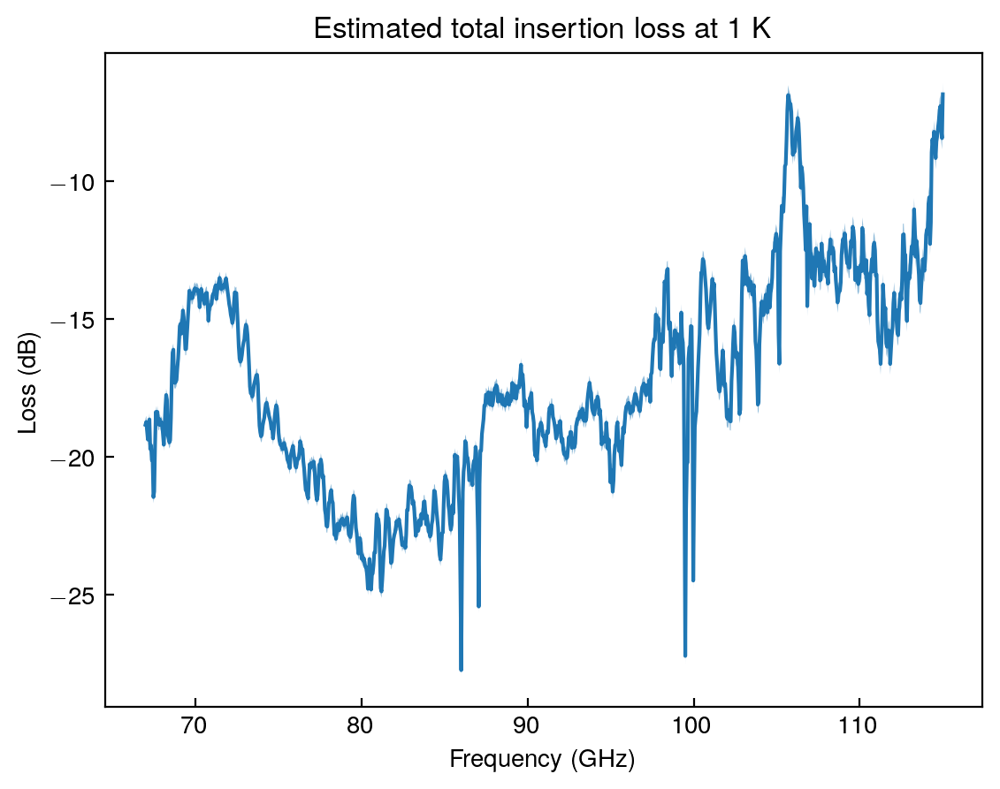

In [72]:
freq_space = np.linspace(67e+9, 115e+9, 1001)
losses_db = flaminia_thru_line_total.loss_db(freq_space)
fig, ax = plt.subplots()

loss_n, loss_s = unp.nominal_values(losses_db), unp.std_devs(losses_db)
ax.fill_between(
    freq_space / 1e+9,
    loss_n - loss_s,
    loss_n + loss_s,
    alpha=0.5,
)
ax.plot(
    freq_space / 1e+9,
    loss_n,
)

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Loss (dB)')
ax.set_title('Estimated total insertion loss at 1 K')

### Load finite-element field simulation results (`small_fem`)

In [73]:
cut_field_r = np.linspace(15.5e-3, 25e-3, 96)

waist_cut_r = np.linspace(0e-3, 25e-3, 251)
waist_cut_coords = waist_cut_r[:, np.newaxis] * [1, 0, 0]

In [74]:
mirror_curv_hm = 1e-3 * 2 / (1/42 + 1/43.5)  # harmonic mean curvature radius
finite_mirror_params = dict(mirror_radius=24e-3, mirror_center_thick=1.415e-3)

flaminia_sph_geo = SymmetricCavityGeometry(
    length=4.55040058e-2,
    mirror_curv_rad=mirror_curv_hm,
    eta_astig=0,
    asphere_p=0,
)
flaminia_cav = FiniteMirrorSymmetricCavity(flaminia_sph_geo, **finite_mirror_params)

cassia_sph_geo = SymmetricCavityGeometry(
    length=4.374978e-2,
    mirror_curv_rad=mirror_curv_hm,
    eta_astig=0,
    asphere_p=0,
)
cassia_cav = FiniteMirrorSymmetricCavity(cassia_sph_geo, **finite_mirror_params)

quasicassia_geo = SymmetricCavityGeometry(
    length=4.374978e-2,
    mirror_curv_rad=42.8185e-3,
    eta_astig=0,
    asphere_p=0,
)
quasicassia_cav = FiniteMirrorSymmetricCavity(quasicassia_geo, **finite_mirror_params)

gemina_cav = FiniteMirrorSymmetricCavity(gemina_geo, **finite_mirror_params)
hadriana_cav = FiniteMirrorSymmetricCavity(hadriana_geo, **finite_mirror_params)

In [75]:
gmsh.clear()

Info    : Clearing all models and views...
Info    : Done clearing all models and views


In [76]:
# smallfem simulations of the TEM(27, 0, 0) mode in Flaminia (g1 geometry) and Cassia (g0 geometry)
flaminia_27_simfield = CurlGradField(smallfem_sim_dir / '20250421-flaminia-tem27', symmetry_factor=2)  # the simulation only includes half the cavity volume
cassia_26_simfield = CurlGradField(smallfem_sim_dir / '20250421-cassia-tem26')

Info    : Reading 'data/smallfem-sims/20250421-flaminia-tem27/eigenModesCurl.msh'...
Info    : 34 entities
Info    : 109393 nodes
Info    : 13933 elements                                                                                      
Info    : Setting interpolation matrices from scheme 'INTERPOLATION_SCHEME'
Info    : Done reading 'data/smallfem-sims/20250421-flaminia-tem27/eigenModesCurl.msh'
Info    : Reading 'data/smallfem-sims/20250421-flaminia-tem27/eigenModesGrad.msh'...
Info    : 34 entities
Info    : 109393 nodes
Info    : 13933 elements                                                                                      
Info    : Setting interpolation matrices from scheme 'INTERPOLATION_SCHEME'
Info    : Done reading 'data/smallfem-sims/20250421-flaminia-tem27/eigenModesGrad.msh'
Info    : Running Plugin(MathEval)...
Info    : Done running Plugin(MathEval)
Info    : Running Plugin(MathEval)...
Info    : Done running Plugin(MathEval)


13933it [00:01, 9993.59it/s] 
13933it [00:01, 11842.61it/s]
13933it [00:01, 9670.54it/s]
13933it [00:01, 9489.46it/s]


Info    : Running Plugin(MathEval)...
Info    : Done running Plugin(MathEval)
Info    : Running Plugin(Integrate)...
Info    : Step 0: integral = 0.0004951422316450515
Info    : Done running Plugin(Integrate)
Info    : Reading 'data/smallfem-sims/20250421-cassia-tem26/eigenModesCurl.msh'...
Info    : 63 entities
Info    : 211941 nodes
Info    : 27046 elements                                                                                      
Info    : Setting interpolation matrices from scheme 'INTERPOLATION_SCHEME'
Info    : Done reading 'data/smallfem-sims/20250421-cassia-tem26/eigenModesCurl.msh'
Info    : Reading 'data/smallfem-sims/20250421-cassia-tem26/eigenModesGrad.msh'...
Info    : 63 entities
Info    : 211941 nodes
Info    : 27046 elements                                                                                      
Info    : Setting interpolation matrices from scheme 'INTERPOLATION_SCHEME'
Info    : Done reading 'data/smallfem-sims/20250421-cassia-tem26/eigenModesG

27046it [00:02, 11757.01it/s]
27046it [00:02, 11804.50it/s]
27046it [00:02, 9407.86it/s]
27046it [00:02, 9725.31it/s]


Info    : Running Plugin(MathEval)...
Info    : Done running Plugin(MathEval)
Info    : Running Plugin(Integrate)...
Info    : Step 0: integral = 0.0005019825795469752
Info    : Done running Plugin(Integrate)


In [77]:
# flaminia_sweep_subset = flaminia_mode_params[:, [3, 7], :]  # TEM(23, 0, 0) and 27
flaminia_sweep_subset = flaminia_mode_params[:, [7], :]  # 27 only

def mask_func(mode_info: FabryPerotModeParams):
    '''
    Mask out the failed fits.
    '''
    return (
        np.isnan(unp.nominal_values(mode_info.freqs))
        | (unp.std_devs(mode_info.res_mag) > 0.3 * unp.nominal_values(mode_info.res_mag))
        | (unp.std_devs(mode_info.fwhms) > 0.3 * unp.nominal_values(mode_info.fwhms))
        | (unp.nominal_values(mode_info.finesses) < 1e+5)
    )
masking_policy = ModeMaskingPolicy(mask_func)

def spot_mask_func(mode_info: FabryPerotModeParams):
    delete_modes = [
        # 24 all checked
        (-3.75, 27, -1),
        (-3.00, 27, -1),
        (-2.25, 27, -1),
    ]
    mask = np.full_like(mode_info.freqs, False, dtype=bool)
    for xs_val in delete_modes:
        inds = tuple(np.argwhere(xarr == xval).item() for xarr, xval in zip(mode_info.xs, xs_val))
        mask[inds] = True
    return mask

spot_masking_policy = ModeMaskingPolicy(spot_mask_func)

flaminia_sweep_subset = spot_masking_policy.apply(masking_policy.apply(flaminia_sweep_subset))
flaminia_sweep_subset.xs = (
    lab_constants.stage_position_to_radius(flaminia_sweep_subset.xs[0]),
    flaminia_sweep_subset.xs[1],
    flaminia_sweep_subset.xs[2],
)

/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: invalid value encountered in std_dev (vectorized)
  outputs = ufunc(*inputs)


In [78]:
flaminia_sweep_subset.xs

(array([24.045, 23.295, 22.545, 21.795, 21.045, 20.295, 19.795, 19.295,
        19.045, 18.795, 18.545, 18.295, 17.795, 17.545, 17.045, 16.795,
        16.295, 15.795]),
 array([27]),
 array([ 1, -1]))

### Color palette selection widgets

In [79]:
from suprtools.plotting import palettes

In [80]:
# for choosing a palette with high dynamic range that also emphasizes 
# palettes.choose_cubehelix_doublegamma_palette(as_cmap=True)

In [81]:
# for sequentially coloring the modes in Fig 4(c)
# sns.choose_dark_palette(input='rgb')

### Figure

In [82]:
from suprtools.plotting.style import kwarg_func_factory
from paper_figures.coupling import coupling_subfig
from paper_figures import finesse_subplot, field_plot_inset


freq=90818048271.9596
freq=90818479691.6558
np.nanmean(unp.nominal_values(flaminia_data.freqs))=90654593528.51361


/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/skrf/frequency.py:275: InvalidFrequencyWarning: Frequency values are not monotonously increasing!
To get rid of the invalid values call `drop_non_monotonic_increasing`
  temp_freq.check_monotonic_increasing()
/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/lmfit/model.py:1053: UserWarning: The keyword argument probe does not match any arguments of the model function. It will be ignored.
  warnings.warn(f"The keyword argument {name} does not " +
/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/lmfit/model.py:1053: UserWarning: The keyword argument probe_z does not match any arguments of the model function. It will be ignored.
  warnings.warn(f"The keyword argument {name} does not " +
/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/lmfit/model.py:1053: UserWarning: The keyword argument freq d

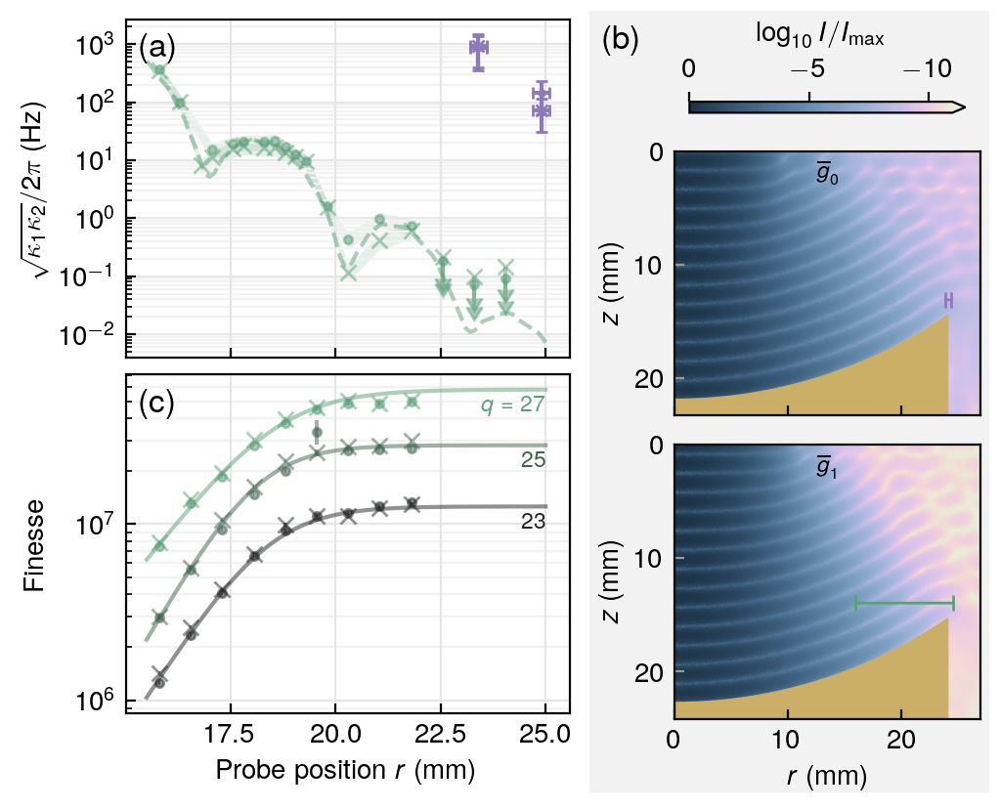

In [83]:
fig3 = plt.figure(
    figsize=(columnwidth_mpl_in, 4),
    layout='constrained',
)

g1_color = style.less_confocal_color(27)
# g1_color = style.gemina_color
# toned down vs Cardinal Red Light to make the red less intense
# g1_color = '#cb5d6c'  # HSV = 352/51/58 vs cardinal red light: 352/52/47

# 1.415 mm is the mirror thickness; sorry for hardcoding
fieldplot_heights = [cassia_sph_geo.length + 1.415e-3, flaminia_sph_geo.length + 1.415e-3]

# gs0 = gridspec.GridSpec(nrows=1, ncols=3, figure=fig3, width_ratios=[0.97, 0.03, 0.648])
# gs00 = gs0[0].subgridspec(nrows=2, ncols=1)
# gs01 = gs0[-1].subgridspec(nrows=2, ncols=1, height_ratios=fieldplot_heights)
# left_axs = gs00.subplots(sharex='col')
# right_axs = gs01.subplots(
#     sharex='col',
# )

if mpl_usetex():
    width_ratios = [0.952, 0.668]
else:
    width_ratios = [0.952, 0.648]

subfigs = fig3.subfigures(nrows=1, ncols=2, width_ratios=width_ratios, wspace=0.02)
subfigs[1].set_facecolor('0.95')
left_axs = subfigs[0].subplots(nrows=2, ncols=1, sharex='col')
right_axs = subfigs[1].subplots(nrows=2, ncols=1, sharex='col', gridspec_kw=dict(height_ratios=fieldplot_heights))

ax_coup, ax_fin = left_axs
# ax_fin.sharex(ax_coup)
# ax_coup.tick_params(labelbottom=False)
# field_axs = right_axs[1:]
field_axs = right_axs[:2]
ax_field_cassia, ax_field_flaminia = field_axs
# ax_field_cassia.sharex(ax_field_flaminia)

fig3_alpha = 0.5

finesse_plot_modes = [23, 25, 27]
finesse_palette = sns.dark_palette(g1_color, n_colors=len(finesse_plot_modes))
def the_kwarg_func(modedata, q, pol):
    return dict(
        color=finesse_palette[finesse_plot_modes.index(q)],
        marker=('.' if pol == +1 else 'x'),
    )

# hacky way to get around my own code structure choices wrt plot styling :<
def couplingplot_flaminia_kwarg_func(mode_data, q: int, polarization: int):
    default_func = kwarg_func_factory(
        label=True,
        q_range=lab_constants.flaminia_q_range,
        markers=('.', 'x'),
        linestyle='',
        alpha=fig3_alpha,
    )
    
    default_result = default_func(mode_data, q, polarization)
    color_override = dict(color=finesse_palette[finesse_plot_modes.index(q)])
    return default_result | color_override

coupling_subfig(
    ax_coup,
    lab_constants.probe,
    near_confocal_coupling_data,
    flaminia_cav,
    flaminia_sweep_subset,
    flaminia_thru_line_total,
    flaminia_27_simfield,
    lab_constants.flaminia_q_range,
    cut_field_r,
    legend_kw=None,
    # errorbar_kw=dict(alpha=fig3_alpha),
    short_labels=True,
    flaminia_kwarg_func=couplingplot_flaminia_kwarg_func,
)

probe_min = cut_field_r[0]
probe_max = cut_field_r[-1]
finesse_subplot(
    ax_fin,
    gemina_rds,
    probe=lab_constants.probe,
    probe_z=gemina_cav.offset_z_from_edge(lab_constants.probe_offset),
    # legend_kw=dict(ncol=1),
    legend_kw=None,
    errorbar_kw=dict(linestyle='', alpha=fig3_alpha),
    plot_modes=finesse_plot_modes,
    annotate_lines=True,
    # for talk graphics:
    # plot_modes=[27],
    # annotate_lines=False,
    kwarg_func=the_kwarg_func,
    extrapolation_r=probe_max,
)

inset_title_kw = dict(
    y=1,
    pad=-10,
    fontsize='small',
    # loc='left',
    # color='white',
)

# less confocal
ax_field_flaminia.set_title(R'$\overline{{g}}_1$', **inset_title_kw)

# near-confocal
ax_field_cassia.set_title(R"$\overline{{g}}_0$", **inset_title_kw)

field_plot_inset(
    ax_field_flaminia,
    flaminia_27_simfield,
    flaminia_cav,
    'upper right',
    probe_r=[probe_min, probe_max],
    probe_offset=lab_constants.probe_offset,
    probe_line_kw=dict(color=g1_color),
    field_scaling=np.sqrt(flaminia_cav.geometry.mode_volume(27)),  # normalize to peak intensity
)

near_confocal_positions = 1e-3 * lab_constants.stage_position_to_radius(unp.nominal_values(next(iter(near_confocal_coupling_data.values()))[1]))
field_plot_inset(
    ax_field_cassia,
    cassia_26_simfield,
    cassia_cav,
    'upper right',
    probe_r=near_confocal_positions,
    probe_offset=lab_constants.probe_offset,
    probe_line_kw=dict(color=style.near_confocal_color(26)),
    field_scaling=np.sqrt(cassia_cav.geometry.mode_volume(26)),
)
ax_field_cassia.set_xlim(0, 27)

# cax = axs['x']
cbar = fig3.colorbar(
    style.field_plot_lin_mappable,
    ax=field_axs,
    # cax=right_axs[0],
    location='top',
    # use_gridspec=True,
    extend='min',
    shrink=0.9,
    aspect=25,
    ticks=[0, -5, -10],
    # ticks=matplotlib.ticker.LogLocator(),
    # format=matplotlib.ticker.LogFormatterSciNotation(),
)
cbar.ax.invert_xaxis()
cbar.ax.tick_params(which='both', direction='out')
cbar.set_label(R'$\log_{10} I/I_{\max}$', labelpad=6)

for ax in field_axs:
    # ax.yaxis.set_label_position('right')
    ax.yaxis.set_ticks([0, 10, 20])
    # ax.yaxis.tick_right()
    ax.set_ylabel(
        f'$z$ ({Units.MM.mplstr()})',
        # **descending_vlabel_kw,
    )
    ax.tick_params(axis='y', which='both', color='0.6')
    ax.invert_yaxis()
field_axs[-1].set_xlabel(f'$r$ ({Units.MM.mplstr()})')

# vertical fraction
# cbar.set_label(R'$\frac{|\tilde{\mathbf{E}}|^2}{\int |\tilde{\mathbf{E}}|^2 \,dV}$ ($\mathrm{m}^{-3}$)')
# horizontal fraction
# # cbar.set_label(R'$|\tilde{\mathbf{E}}|^2 / \int |\tilde{\mathbf{E}}|^2 \,dV$ ($\mathrm{m}^{-3}$)')

# for ax in [ax_field_flaminia, ax_field_cassia]:
#     ax.xaxis.set_visible(False)
#     ax.yaxis.set_visible(False)

for ax in left_axs:
    style.make_paper_grids(ax)

ax_fin.set_xlabel(f'Probe position $r$ ({Units.MM.mplstr()})')
label_subplots(
    fig3,
    [left_axs[0], subfigs[1], left_axs[1]],
    # [*left_axs, *field_axs],
    colors=(('black',) * 3),  # ['black', 'black', 'white', 'white'],
)

# workaround to ensure that xticks are plotted over ygridlines
# current matplotlib draws each axis as a unit
for ax in left_axs:
    ax.xaxis.set_zorder(ax.yaxis.get_zorder() + 0.01)

fig3.align_labels(left_axs)
subfigs[0].align_labels()
# fig3.align_labels(right_axs)
fig3.align_xlabels(axs=[left_axs[-1], field_axs[-1]])
fig3.align_titles()
# remove_figure_padding(fig3)

In [84]:
# fig3.savefig('20250523-coupling-compare.pdf', dpi=600)

### Variant for slides

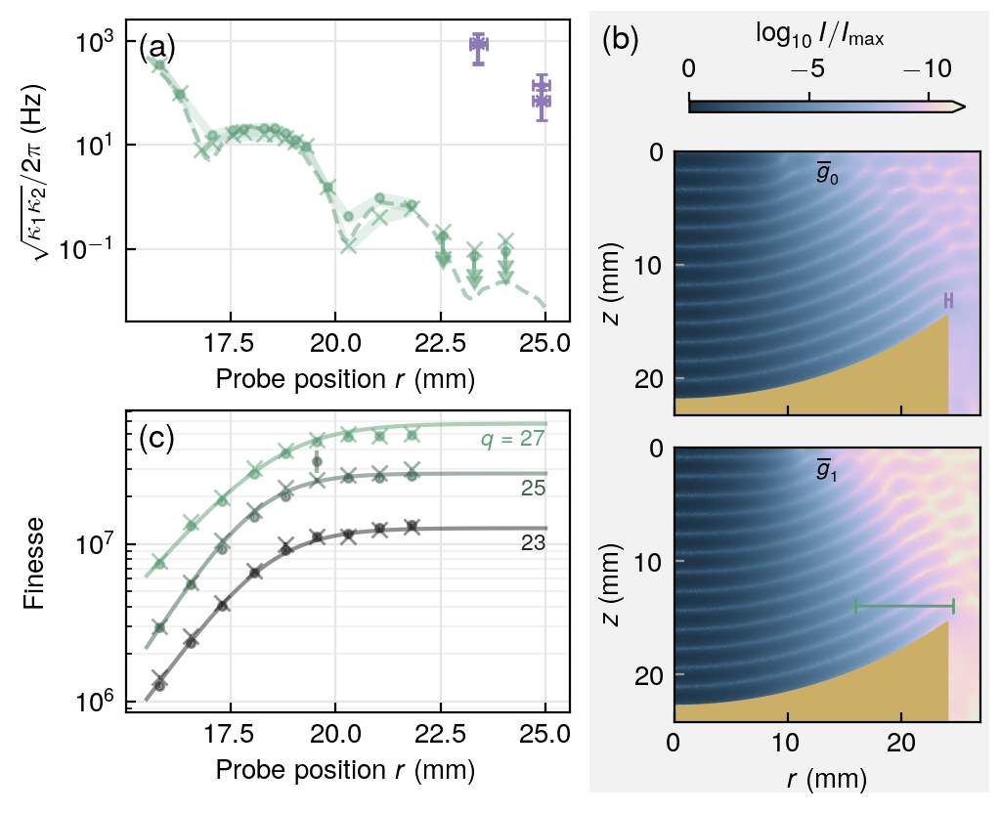

In [85]:
ax_coup.tick_params(top=False, labeltop=False, bottom=True, labelbottom=True)
# ax_coup.xaxis.tick_top()
ax_coup.set_xlabel(f'Probe position $r$ ({Units.MM.mplstr()})')
fig3

In [86]:
# fig3.savefig('20250613-coupling-compare-slides.pdf')

## Figure 4

In [87]:
# thermometer calibration
roxcal_mm_off = LinearInterpolator.from_340_file(thermometer_cal_dir / '20241101_U06966-3/U06966-3.340')

### Temperature sweep dataset

Most of the finesses are extracted from ringdowns,
with the notable exception of finesses at 4 K,
which are instead extracted from $S_{21}$ measurements,
since ringdowns don't work for these lossier modes.

In [88]:
modelist_tsweep = list(itertools.product(range(22, 30), (+1, -1)))
tsweep_rds = RingdownSetSweep.from_directories(
    gemina_data_dir / '20240919-narrow-scans',
    {
        0.80: '20240922-tem22-29-00xy-ringdown-ptoff-turbooff-0p80k-stagen1p50mm',
        1.25: '20240922-tem22-29-00xy-ringdown-ptoff-turbooff-1p22k-stagen1p50mm',
        1.80: '20240922-tem22-29-00xy-ringdown-ptoff-turbooff-1p80k-stagen1p50mm',
        2.50: '20240922-tem22-29-00xy-ringdown-ptoff-turbooff-2p50k-stage0p75mm',
        3.20: '20240922-tem22-29-00xy-ringdown-ptoff-turbooff-3p20k-stage0p75mm-synthetic',
    },
    modelist_tsweep,
    geometry=gemina_geo,
)
tsweep_rds.fit()
tsweep_rds.extract_finesses()

100%|██████████| 16/16 [00:00<00:00, 19.32it/s]


In [89]:
def load_sweeps_with_adjustments(mainpath, modes, parent_dir, exceptiondict=dict(), lacks_23=False):
    default_windows = {
        mode_tuple: (
            parent_dir / mainpath
            / f'window{i - (2 if (lacks_23 and mode_tuple[0] > 23) else 0):03d}.h5'
        )
        for i, mode_tuple in enumerate(modes)
        if not (lacks_23 and mode_tuple[0] == 23)
    }
    
    windows = default_windows | exceptiondict
    return {
        mode_tuple: None if path is None else WideScanData.from_window(path, network_name=str(mode_tuple))
        for mode_tuple, path in tqdm(windows.items())
    }

In [90]:
tsweep_sweeps = {
    4.0: load_sweeps_with_adjustments(
        '20240923-tem22-29-00xy-sweep-ptoff-turbooff-4p00k-stage1p50mm',
        modes=modelist_tsweep,
        parent_dir=(gemina_data_dir / '20240919-narrow-scans'),
    )
}
temps_tsweep_sweep = list(tsweep_sweeps)

100%|██████████| 16/16 [00:00<00:00, 136.94it/s]


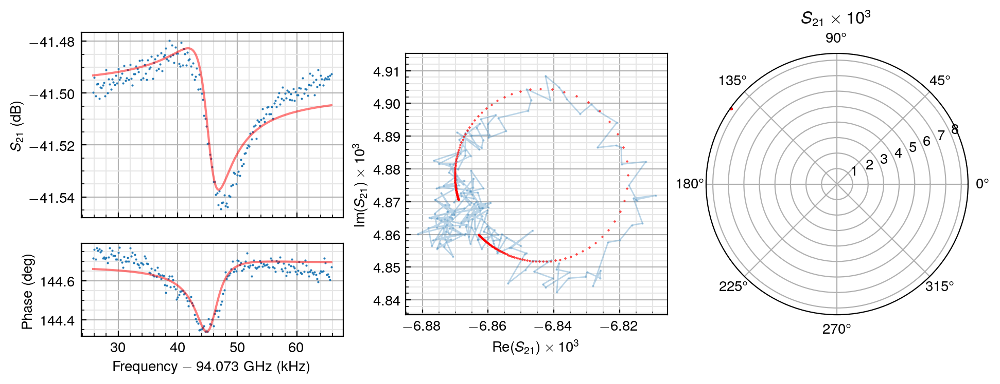

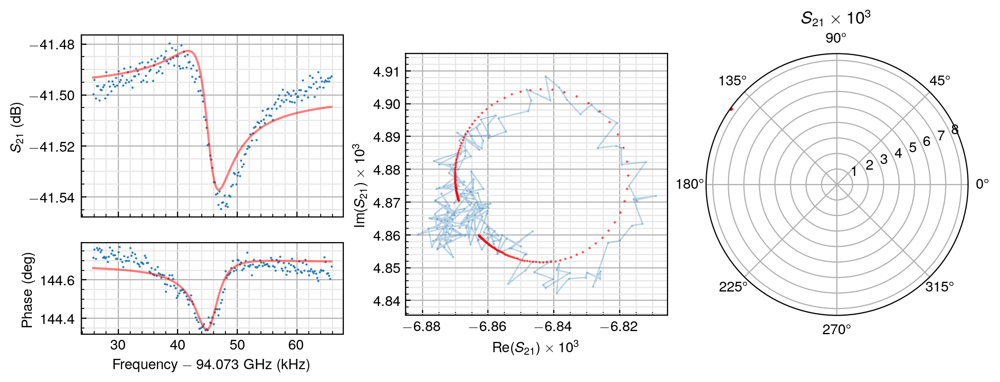

In [91]:
tsweep_sweeps[4.0][28, -1].s21.fit_network().visualize()

In [92]:
tsweep_records_dict = {
    stage_pos: [
        [
            (
                pos_sweeps[(mode_q, pol)].s21.fit_narrow_mode()
                if pos_sweeps.get((mode_q, pol)) is not None
                else (ufloat(np.nan, np.nan),) * 4
            )
            for pol in (+1, -1)
        ]
        for mode_q in tqdm(range(22, 30))
    ]
    for stage_pos, pos_sweeps in tsweep_sweeps.items()
}

100%|██████████| 8/8 [00:00<00:00, 10.62it/s]


In [93]:
tsweep_records = [tsweep_records_dict[temp] for temp in temps_tsweep_sweep]
tsweep_modeparams = FabryPerotModeParams(
    [
        temps_tsweep_sweep,
        list(range(22, 30)),
        (+1, -1),
    ],
    tsweep_records,
    gemina_geo.fsr,
)

In [94]:
def cavity_temperature_estimate(sample_temp, plate_temp):
    mean = (2/3) * sample_temp + (1/3) * plate_temp
    std = np.abs((1/3) * unp.nominal_values(sample_temp - plate_temp))
    return mean + ufloat(0, std)

In [95]:
def dataset_cavity_temperature(dataset: WideScanData | RingdownSet):
    metadata_dict = dataset.metadata_dict if isinstance(dataset, WideScanData) else dataset.metadata

    sample_temps = [
        ufloat(roxcal_mm_off.resistance_to_temp(metadata_dict[key]), 0.01)
        for key in ['thermistor_sample_ohms', 'thermistor_sample_ohms_init']
    ]
    plate_temps = [
        ufloat(metadata_dict[key], 0.005) for key in ['temperature_plate', 'temperature_plate_init']
    ]
    print(f'{sample_temps[0]=:S}, {plate_temps[0]=:S}')
    print(f'{sample_temps[1]=:S}, {plate_temps[1]=:S}')
    return cavity_temperature_estimate(
        np.mean(sample_temps) + ufloat(0, np.std(unp.nominal_values(sample_temps))),
        np.mean(plate_temps) + ufloat(0, np.std(unp.nominal_values(plate_temps))),
    )


In [96]:
tsweep_finesses = {}

for pol, q in itertools.product([+1, -1], range(22, 29+1, +1)):
    # if not (28 <= q <= 34):
    #     continue
    ringdown_sets_thismode = [
        collective_fits[q, pol].ringdown_set for collective_fits in tsweep_rds.collective_fits.values()
    ]
    temps_rds = np.array([
        dataset_cavity_temperature(rdset) for rdset in ringdown_sets_thismode
    ])
    temps_sweeps = np.array([
        dataset_cavity_temperature(widescandatas[q, pol]) for widescandatas in tsweep_sweeps.values()
    ])

    base_t_data = gemina_rds.finesses[q, pol][0]
    base_t_temp = dataset_cavity_temperature(gemina_rds.collective_fits[-1.5][q, pol].ringdown_set)
    temps = np.concatenate([[base_t_temp], temps_rds, temps_sweeps])

    assert base_t_data['stage_pos'] == -1.5
    fwhms = np.concatenate((
        [gemina_geo.fsr / base_t_data['finesse']],
        gemina_geo.fsr / tsweep_rds.finesses[q, pol]['finesse'],
        [tsweep_modeparams[0][q - 22][pol].fwhms * ufloat(1, 0.3)],
    ))

    fins = gemina_geo.fsr / fwhms
    ringdown_freqs = np.concatenate((
        [base_t_data['freq']],
        tsweep_rds.finesses[q, pol]['freq'],
        [tsweep_modeparams[0][q-22][pol].freqs.n],
    ))

    tsweep_finesses[q, pol] = np.rec.fromarrays(
        [temps, fins, ringdown_freqs],
        names=['temp', 'finesse', 'freq'],
    )

sample_temps[0]=0.841(10), plate_temps[0]=0.799(5)
sample_temps[1]=0.843(10), plate_temps[1]=0.799(5)
sample_temps[0]=1.245(10), plate_temps[0]=1.228(5)
sample_temps[1]=1.247(10), plate_temps[1]=1.230(5)
sample_temps[0]=1.823(10), plate_temps[0]=1.796(5)
sample_temps[1]=1.823(10), plate_temps[1]=1.522(5)
sample_temps[0]=2.483(10), plate_temps[0]=2.496(5)
sample_temps[1]=2.487(10), plate_temps[1]=2.496(5)
sample_temps[0]=3.220(10), plate_temps[0]=3.215(5)
sample_temps[1]=3.211(10), plate_temps[1]=3.209(5)
sample_temps[0]=3.996(10), plate_temps[0]=4.003(5)
sample_temps[1]=3.998(10), plate_temps[1]=4.004(5)
sample_temps[0]=0.346(10), plate_temps[0]=0.300(5)
sample_temps[1]=0.338(10), plate_temps[1]=0.300(5)
sample_temps[0]=0.828(10), plate_temps[0]=0.799(5)
sample_temps[1]=0.828(10), plate_temps[1]=0.799(5)
sample_temps[0]=1.245(10), plate_temps[0]=1.234(5)
sample_temps[1]=1.244(10), plate_temps[1]=1.233(5)
sample_temps[0]=1.823(10), plate_temps[0]=1.814(5)
sample_temps[1]=1.823(10), plat

### Fit temperature dependence to BCS

In [97]:
exemplar_mode_data = tsweep_finesses[28, -1]
min_temp = min(exemplar_mode_data['temp'])

warm_lambda = True
impure_lambda = True
impure_xi = True

witness_sample_rrr = 54.5

exemplar_temp_fit = TemperatureFit(
    exemplar_mode_data,
    rrr=witness_sample_rrr,
    warm_lambda=warm_lambda,
    impure_lambda=impure_lambda,
    impure_xi=impure_xi,
)
exemplar_temp_fit.fit(6e+7, 40e-9)

/Users/txz/Desktop/data-avail-test/suprtools/build/__editable__.suprtools-2025.8.14-py3-none-any/suprtools/cavity_loss.py:173: RuntimeWarning: invalid value encountered in arccosh
  np.arccosh(purity_a),


In [98]:
fit_nb = exemplar_temp_fit.superconductor()

In [99]:
print('\n'.join([
    f'Finesse plateau: {exemplar_temp_fit.upopt[0]:S}',
    f'Fitted penetration depth: {exemplar_temp_fit.upopt[1] * 1e+9:S} nm',
]))

Finesse plateau: 5.60(10)e+07
Fitted penetration depth: 37.07(29) nm


In [100]:
from paper_figures import highest_finesse_subplot, bcs_subplot
from paper_figures.style import plot_range_ghz, gemina_color, hadriana_color

In [101]:
exemplar_segment_length = fit_nb.mean_free_path

### Figure

In [102]:
from paper_figures import ringdown_plot, single_ringdown_inset

In [103]:
measured_b_perp = ufloat(0.22, 0.03) * 1e-4

/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/lmfit/model.py:1053: UserWarning: The keyword argument cav does not match any arguments of the model function. It will be ignored.
  warnings.warn(f"The keyword argument {name} does not " +


Parameters([('limit_finesse', <Parameter 'limit_finesse', value=57388749.658615276 +/- 9.89e+05, bounds=[10:1000000000.0]>), ('fudge_factor', <Parameter 'fudge_factor', value=1.289957488493807 +/- 0.00145, bounds=[1:10]>)])
Parameters([('limit_finesse', <Parameter 'limit_finesse', value=61604123.91605482 +/- 2.09e+06, bounds=[10:1000000000.0]>), ('fudge_factor', <Parameter 'fudge_factor', value=1.3735767123277074 +/- 0.0014, bounds=[1:10]>)])


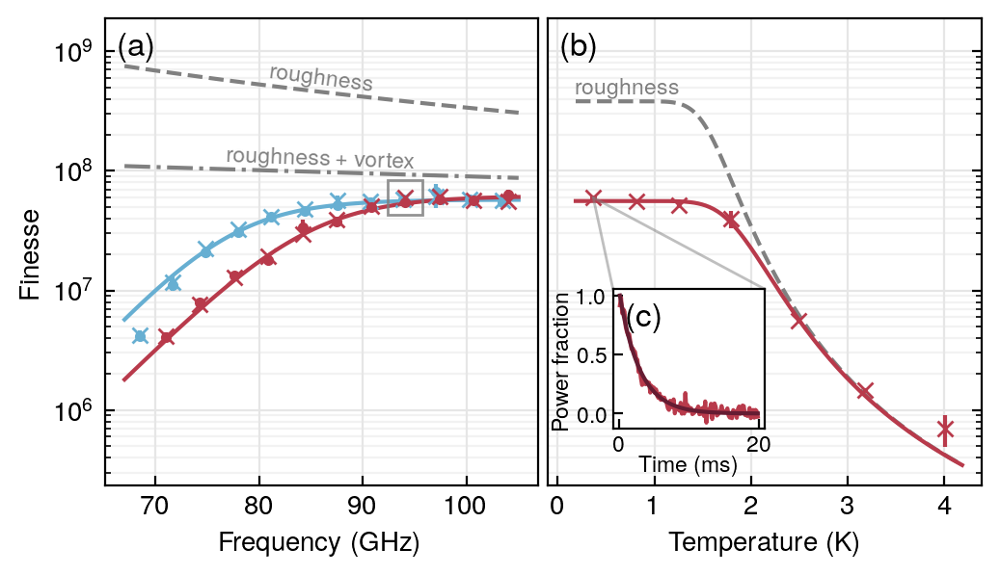

In [104]:
fig4_row, axs = plt.subplots(
    figsize=(columnwidth_mpl_in, 2.8),
    ncols=2,
    sharey=True,
    squeeze=False,
    layout='constrained',
    gridspec_kw=dict(width_ratios=[1, 1])
)
ax_best, ax_temp_dep = axs.flatten()

bcs_subplot(
    exemplar_temp_fit,
    roughness_rms=23e-9,
    ax=ax_temp_dep,
    marker='x',
    color=gemina_color,
    minimal_limit_labels=True,
    offset_pts=(0, 3),
    # scale='reci_r',
)

ringdown_set_sweeps = [
    (hadriana_rds, hadriana_cav, (lambda q, _: 21 <= q <= 32), dict(color=hadriana_color)),
    (gemina_rds, gemina_cav, (lambda q, _: 21 <= q <= 31), dict(color=gemina_color)),
]
highest_finesse_subplot(
    ax_best,
    ringdown_set_sweeps,
    warm_lambda=warm_lambda,
    impure_lambda=impure_lambda,
    impure_xi=impure_xi,
    temperature=min_temp.n,
    roughness_rms=23e-9,
    uparams=cassia_mode_uparams_plot,
    avoided_crossing_fit=None,
    vortex_rrr=witness_sample_rrr,
    magnetic_flux_density=measured_b_perp,
    mean_defect_depth=exemplar_segment_length,
    plot_range_ghz=plot_range_ghz,
    minimal_limit_labels=True,
    vortex_offset_pts=(0, 3),
    roughness_offset_pts=(0, 3),
)
# todo

inset_side = 'b'
if inset_side == 'a':
    ax_ringdown = ax_best.inset_axes(
        [+0.56, 0.13, 0.39, 0.35],
    )
elif inset_side == 'b':
    ax_ringdown = ax_temp_dep.inset_axes(
        [+0.15, 0.12, 0.35, 0.3],
        # [+0.62, 0.6, 0.35, 0.35],
    )
# ax_ringdown = fig4_row.add_axes([0.2, 0.25, 0.2, 0.3])

ringdown_plot(
    ax_ringdown,
    gemina_rds.collective_fits[-1.5][28, -1],
    data_kw=dict(color=gemina_color),
    model_kw=dict(color=colors.stanford.brick),
    max_t=20e-3,
)
ax_ringdown.set_xlabel(f'Time ({Units.MS.mplstr()})', labelpad=0, zorder=1)
ax_ringdown.set_ylabel('Power fraction', labelpad=1, zorder=1)

ringdown_fontsize = 'small'
ax_ringdown.tick_params(labelsize=ringdown_fontsize, pad=2)
ax_ringdown.xaxis.label.set_size(ringdown_fontsize)
ax_ringdown.yaxis.label.set_size(ringdown_fontsize)
# ax_ringdown.legend(fontsize=ringdown_fontsize)
ax_ringdown.get_legend().set_visible(False)

# transform = ax_ringdown.transAxes
# coords = transform.inverted().transform(ax_ringdown.get_tightbbox())
# border = 0.02
# w, h = coords[1] - coords[0] + 2*border
# fig4_row.patches.append(
#     plt.Rectangle(
#         coords[0]-border, w, h, fc="green", 
#         transform=transform, zorder=-0.1,
#     ),
# )

# ax_ringdown.patch.set_alpha(0.8)
tsweep_best_mode_data = exemplar_mode_data[0]


if inset_side == 'a':
    _, inset_connectors = ax_best.indicate_inset(
        (tsweep_best_mode_data['freq'] / 1e+9, tsweep_best_mode_data['finesse'].n, 0, 0),  
        inset_ax=ax_ringdown,
    )
elif inset_side == 'b':
    _, inset_connectors = ax_temp_dep.indicate_inset(
        (tsweep_best_mode_data['temp'].n, tsweep_best_mode_data['finesse'].n, 0, 0),
        inset_ax=ax_ringdown,
    )
    exemplar_mode_offset_transform = matplotlib.transforms.ScaledTranslation(
        tsweep_best_mode_data['freq']/1e+9,
        tsweep_best_mode_data['finesse'].n,
        ax_best.transData,
    )

    square_size_pts = 13
    inset_bounds = [
        -square_size_pts/2/72,
        -square_size_pts/2/72,
        square_size_pts/72,
        square_size_pts/72,
    ]
    ax_best.indicate_inset(
        inset_bounds,
        transform=(fig4_row.dpi_scale_trans + exemplar_mode_offset_transform),
        alpha=0.85,
        # linewidth=2,
    )

connector_visibility = (False, True, False, True)  # order: lower left, UL, LR, UR
for i, connector in enumerate(inset_connectors):
    connector.set_visible(connector_visibility[i])


ax_best.set_xlabel(f'Frequency ({Units.GHZ.mplstr()})')
ax_temp_dep.set_yscale('log')

for ax in axs[:, 0]:
    ax.set_ylabel('Finesse')

fig4_row.align_labels()
if inset_side == 'b':
    label_subplots(fig4_row, [ax_best, ax_temp_dep, ax_ringdown])
elif inset_side == 'a':
    label_subplots(fig4_row, [ax_best, ax_temp_dep])

fig4_row.patch.set_alpha(0)
ax_best.patch.set_alpha(0)
ax_temp_dep.patch.set_alpha(0)
# ax_ringdown.patch.set_alpha(1)
# ax_ringdown.patch.set_facecolor('#909090')

ax_best.set_ylim(None, ax_best.get_ylim()[1] * 1.7)
ax_best.set_xticks([70, 80, 90, 100])
ax_temp_dep.set_xticks([0, 1, 2, 3, 4])
ax_temp_dep.set_xlim(-0.1, None)
ax_temp_dep.yaxis.tick_right()


for ax in axs.flatten():
    style.make_paper_grids(ax)

    # workaround to ensure that xticks are plotted over ygridlines
    # current matplotlib draws each axis as a unit
    ax.xaxis.set_zorder(ax.yaxis.get_zorder() + 0.01)

remove_figure_padding(fig4_row)

In [105]:
# savefig_tightly(fig4_row, '20250603-cavity-perf-leftinset.pdf', dpi=600)

In [106]:
# finesse for displayed mode in inset
print(gemina_cav.geometry.fsr / ufloat(55.1, 1.5))

(5.99+/-0.16)e+07


In [107]:
# average of the fitted finesse plateaus, weighted by inverse square uncertainty
# TODO get these from the Figure 4(a) fits programmatically
f1, f2 = ufloat_fromstr('57388749.658615276 +/- 9.89e+05'), ufloat_fromstr('61604123.91605482 +/- 2.09e+06')
concordance_finesse = (f1 / f1.s**2 + f2 / f2.s**2) / (f1.s**(-2) + f2.s**(-2))
print(concordance_finesse)

(5.82+/-0.09)e+07


## Miscellaneous calculations

### Gaussian beam sizes in different geometries

This plot supports the claim that the $\overline{g}_2$ geometry has large mode spot sizes at the mirror
despite its lower $\mathrm{TEM}_{00}$ losses.

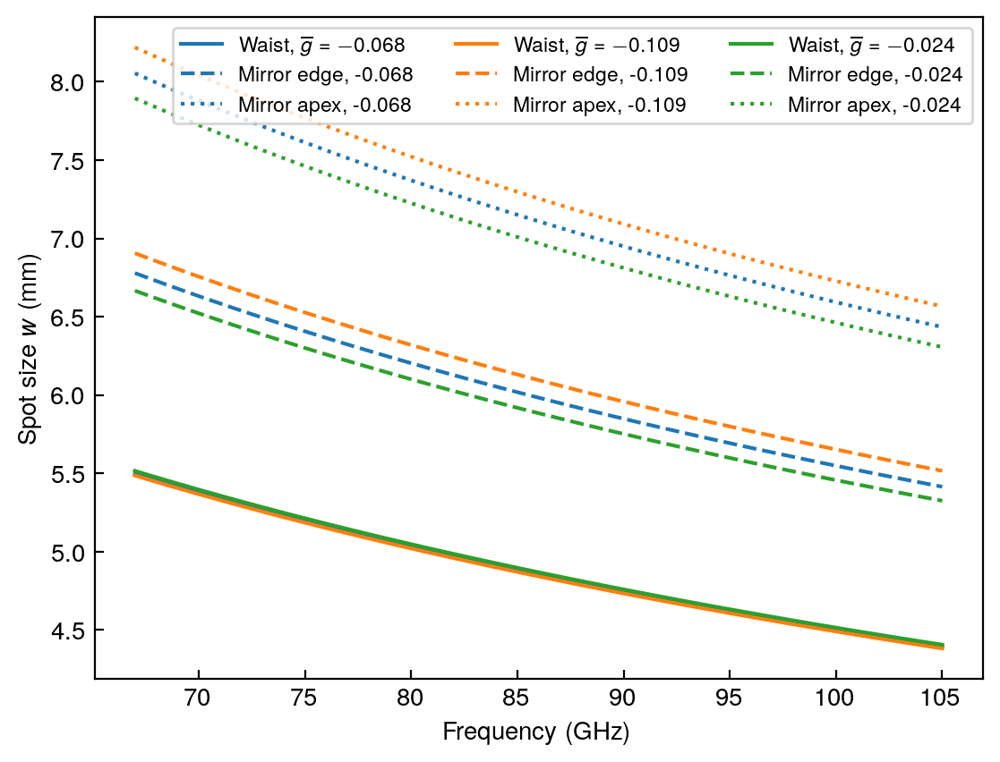

In [108]:
fig_waistsize, ax = plt.subplots()

freq_ghz = np.linspace(*plot_range_ghz)
freq = freq_ghz * 1e+9
for cav in [gemina_cav, hadriana_cav, cassia_cav]:
    geo = cav.geometry
    waist_sizes = np.sqrt(unp.nominal_values(c * geo.z0 / (pi * freq)))
    line, = ax.plot(
        freq_ghz,
        waist_sizes * 1e+3,
        label=fR'Waist, $\overline{{g}} = {geo.g:.3f}$',
    )
    ax.plot(
        freq_ghz,
        waist_sizes * np.sqrt(unp.nominal_values(1 + (cav.edge_z /geo.z0)**2)) * 1e+3,
        color=line.get_color(),
        linestyle='dashed',
        label=f'Mirror edge, {geo.g:.3f}',
    )
    ax.plot(
        freq_ghz,
        waist_sizes * np.sqrt(unp.nominal_values(1 + (geo.length/2 /geo.z0)**2)) * 1e+3,
        color=line.get_color(),
        linestyle='dotted',
        label=f'Mirror apex, {geo.g:.3f}',
    )

ax.set_xlabel(f'Frequency ({Units.GHZ.mplstr()})')
ax.set_ylabel(f'Spot size $w$ ({Units.MM.mplstr()})')
ax.legend(ncols=3, fontsize='small')

### Spectroscopically-determined mirror curvature vs nominal

In [109]:
nominal_cavity_curvrads = np.array([42, 43.5]) * 1e-3
cryonominal_curvrads = nominal_cavity_curvrads * (1 - 0.00324)  # shrinkage of copper to cryo

In [110]:
[cassia_refined_geo.rx, cassia_refined_geo.ry] / cryonominal_curvrads - 1

array([-0.00449119, -0.00158672])

In [111]:
([gemina_geo.rx_u, gemina_geo.ry_u] - cryonominal_curvrads) / cryonominal_curvrads

array([-0.0017008094070862698+/-0.0002805665591795525,
       -0.0006813417474210077+/-0.0002530955765829123], dtype=object)

In [112]:
([hadriana_geo.rx_u, hadriana_geo.ry_u] - cryonominal_curvrads) / cryonominal_curvrads

array([-0.002390431027664323+/-0.00024208578390526824,
       -0.001222599432460584+/-0.0002512193217505383], dtype=object)

### Cavity geometry NA

In [113]:
print('Gemina: ', format(gemina_cav.lateral_numerical_aperture, '.3f'))
print('Hadriana: ', format(hadriana_cav.lateral_numerical_aperture, '.3f'))

Gemina:  0.538
Hadriana:  0.558


## Supplement: mirror profilometry

In [114]:
from suprtools.zygo import ZygoProfile

In [115]:
substrate_profile = ZygoProfile.from_h5(
    profilometry_dir / 'substrates/Toroids/3/20201110_005.datx'
)
coated_profile = ZygoProfile.from_h5(
    profilometry_dir / 'coated/20210716_40x_001.datx'
)

### Substrate

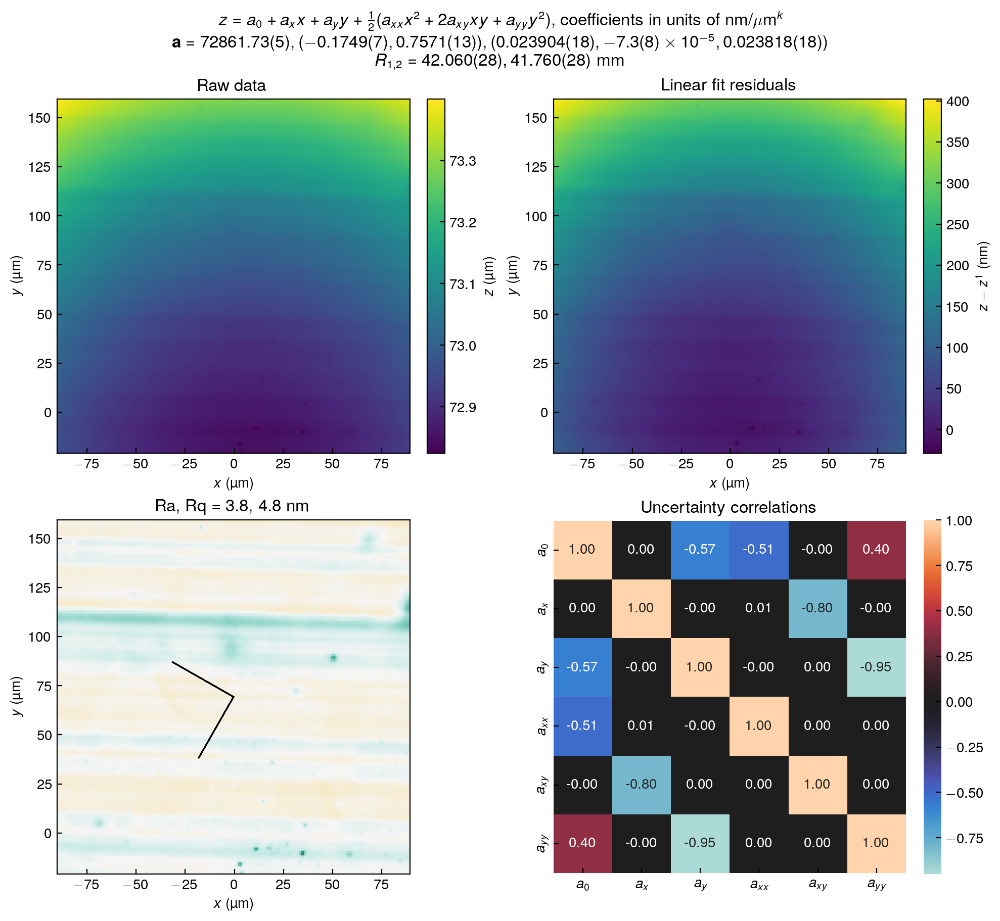

In [116]:
substrate_fit = substrate_profile.quadratic_fit([-90, 90], [-20, 160])
substrate_fit.plot_summary()

### Coated

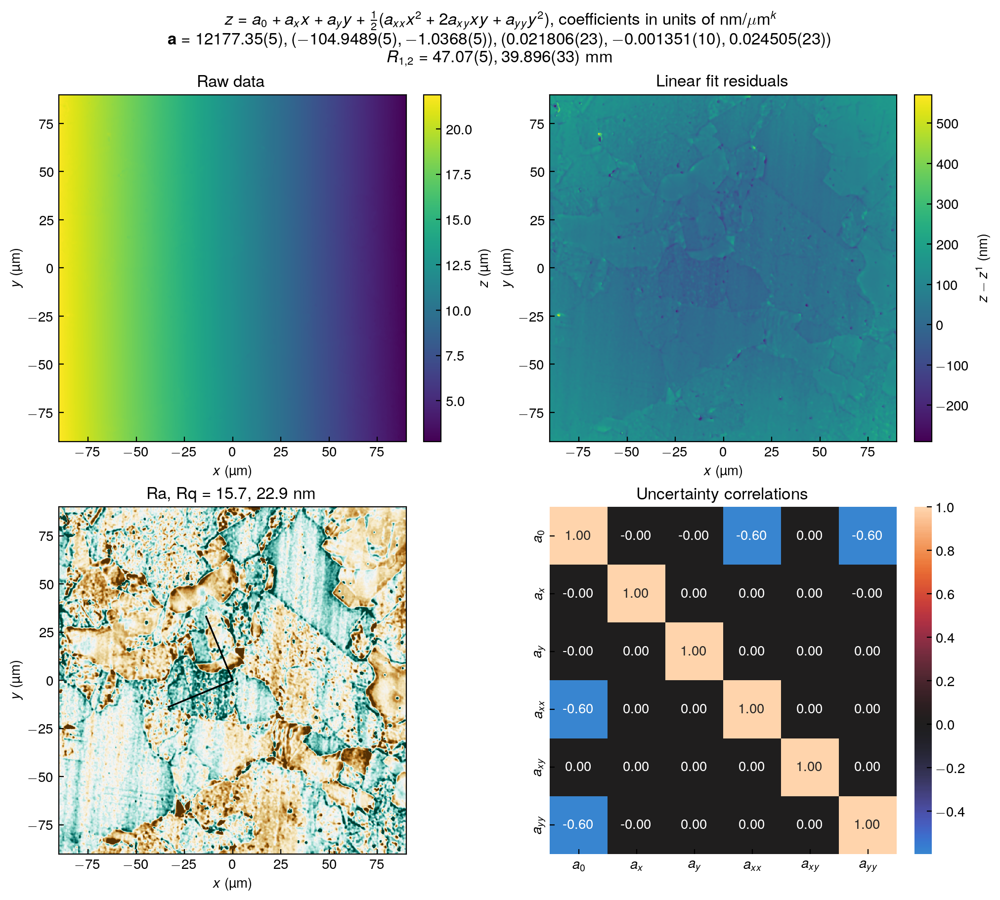

In [117]:
coated_fit = coated_profile.quadratic_fit([-90, 90], [-90, 90])
coated_fit.plot_summary()

### Figure

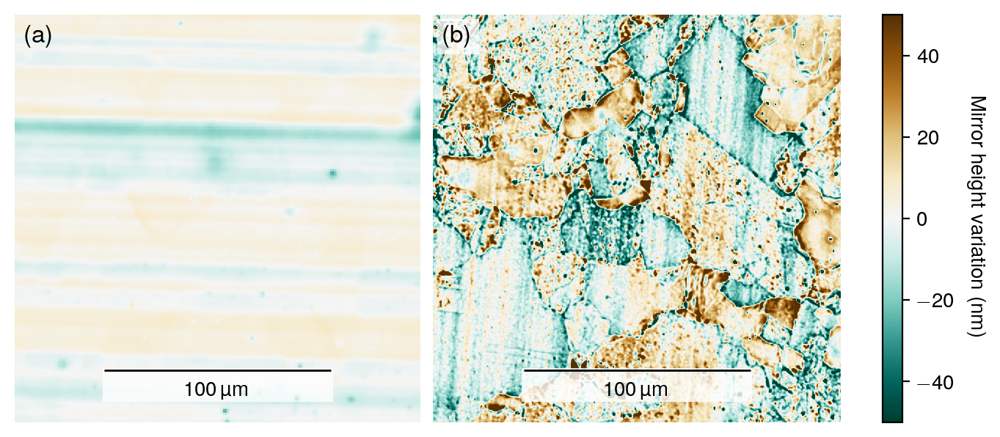

In [118]:
fig_profiles, axs = plt.subplots(
    figsize=(0.65 * textwidth_mpl_in, 4), ncols=2, layout="compressed",
)

substrate_fit.plot_residuals(
    fig=fig_profiles,
    ax=axs[0],
    show_principal_axes=False,
    # scale=100
    scale=(100, dict(facecolor="white", edgecolor="none", visible=True, alpha=0.8)),
)
_, _, im = coated_fit.plot_residuals(
    fig=fig_profiles,
    ax=axs[1],
    show_principal_axes=False,
    scale=(100, dict(facecolor="white", edgecolor="none", visible=True, alpha=0.8)),
)
for ax in axs:
    ax.axis("off")
    ax.set_title('')

label_subplots(
    fig_profiles,
    axs,
    text_kws={
        1: dict(
            bbox=dict(facecolor="white", edgecolor="none", pad=3.0, alpha=0.8),
        )
    },
)
cbar = fig_profiles.colorbar(im, ax=axs, location="right")
cbar.ax.tick_params(which='both', direction='out')

cbar.set_label(f"Mirror height variation ({Units.NM.mplstr()})", **(descending_vlabel_kw | dict(labelpad=15)))

In [119]:
# fig_profiles.savefig('20250522-mirror-profiles.pdf', dpi=600, bbox_inches='tight')

## Supplement: cavity spectra

### Full spectrum figure

/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/skrf/plotting.py:401: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.draw()


Text(0.5, 28.145129017864875, 'Frequency (\\si{\\GHz})')

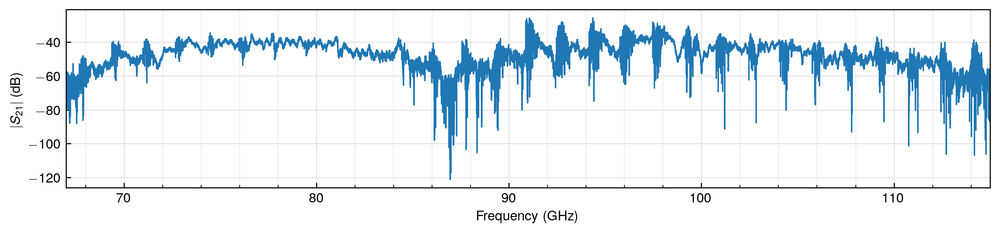

In [120]:
from matplotlib.ticker import AutoMinorLocator


fig_widescan, ax = plt.subplots(figsize=(textwidth_mpl_in, 2.5), layout='tight', nrows=1, sharex=True)


gemina_widescan.s21.plot_s_db(ax=ax, linewidth=1)
ax.get_legend().remove()
# ax.plot(
#     gemina_widescan.s21.f / 1e+9,
#     rf.complex_2_db(gemina_widescan.s21.s[:, 0, 0]),
#     linewidth=1,
# )

ax.xaxis.set_minor_locator(AutoMinorLocator())

style.make_paper_grids(ax)
ax.set_ylabel(Rf'$|S_{{21}}|$ ({Units.DB.mplstr()})')
ax.set_xlabel(f'Frequency ({Units.GHZ.mplstr()})')

In [121]:
# fig_widescan.savefig('20250522-gemina-widescan-spectrum.pdf', dpi=600)

### FSR alignment figure (with geometry fit refinement via higher-order modes)

In [122]:
gemina_fit_homs = [
    (2, 0, '67.7657014(13)'),
    (2, 4, '67.8771472(9)'),
    (2, 5, '67.878156(8)'),
    (4, 4, '67.963278(7)'),
    (4, 4, '71.261106(5)'),
    (4, 0, '74.4311726(32)'),
    # (6, 0, '87.6420672(9)'),
    # (6, 0, '90.9439297(5)'),
    (4, 6, '91.1031130(4)'),
    # (6, 2, '91.111679(5)'),
    # (8, 0, '110.8618159(29)'),
    # (6, 6, '114.2756451(10)'),
    (4, 2, '114.10331627(19)'),
    (4, 3, '114.1035825(9)'),
]
gemina_refined_geo = gemina_widescanfit.refine_fit(gemina_fit_homs)

trying L, R = 45.443, 42.606 mm; eta, p = 0.018, -0.029: : 26it [00:08,  3.13it/s]


In [123]:
from suprtools.plotting import label_artist

(-81.27557803275035, -31.17948253295515)

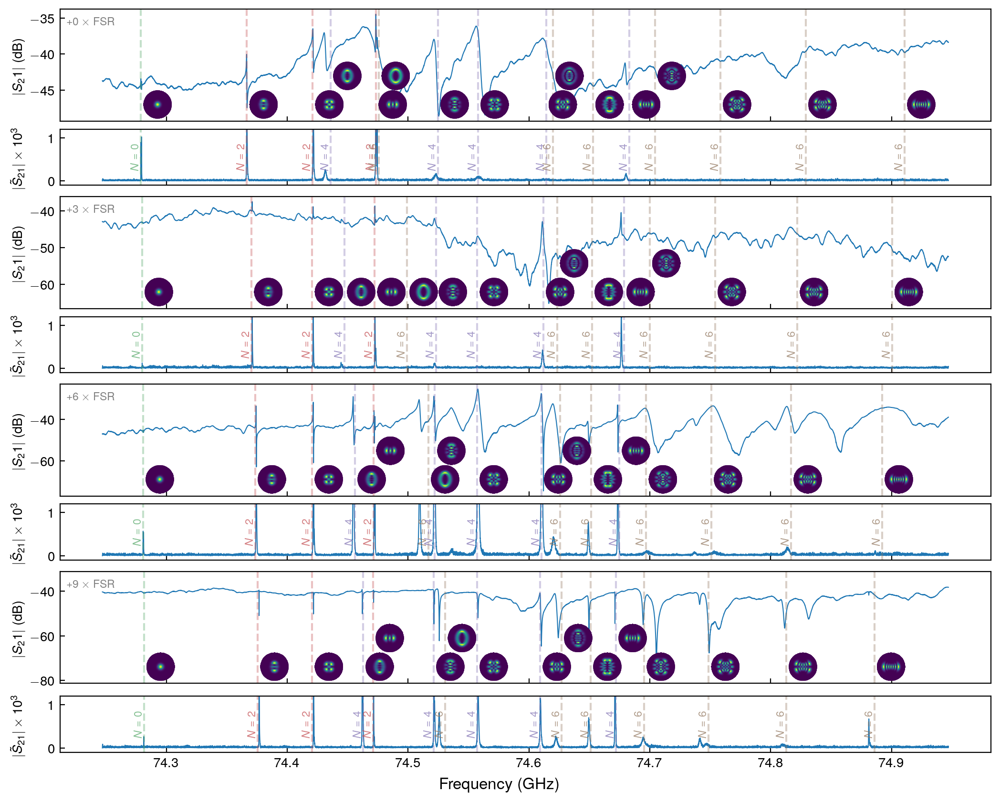

In [124]:
# %%prun
# plt.ioff()
offsets = [0, 3, 6, 9]
fig_gemina_spectrum, axs = gemina_widescan.s21.fsr_compare_plots(
    68.0 + 3.2985 * 2,
    0.7,
    3.2985,
    offsets=offsets,
    filt=gemina_widescan.s21.make_filter(**high_pass_kws, gain=1e+3),  # lambda_hp=2e+6, high_pass_order=1),
    mode_colorfunc=style.mode_colorfunc,
    max_plot_mode_order=6,
    geo=gemina_refined_geo,
    downsample=10,
    sexy=False,
    figwidth=textwidth_mpl_in,
)
raw_axs = axs[0::2]
filtered_axs = axs[1::2]
# max_y_lolim = min(ax.get_ylim()[0] for ax in filtered_axs)


for ax, offset in zip(raw_axs, offsets):
    ax.set_ylabel(Rf'$|S_{21}|$ ({Units.DB.mplstr()})')
    label_artist(
        fR'$+{offset}\times\text{{FSR}}$',
        ax,
        color='0.5',
        fontsize='small',
    )
for ax in filtered_axs:
    ax.set_ylabel(R'$|\tilde{S}_{21}| \times 10^3$')
    ax.set_ylim(-0.1, 1.2)

raw_axs[-1].set_ylim(None, raw_axs[-1].get_ylim()[1] + 5)

# plt.ion()

In [125]:
# fig_gemina_spectrum.savefig('20250522-gemina-spectrum-refined-fit.pdf', dpi=600)

## Supplement: $Q$-circle figure

In [126]:
def load_gemina_sweeps(dirname):
    return load_sweeps_with_adjustments(
        dirname,
        modes=list(itertools.product(range(20, 35), (+1, -1))),
        parent_dir=(gemina_data_dir / '20240919-narrow-scans'),
    )

In [127]:
gemina_base_t_sweeps = {
    4.50: load_gemina_sweeps('20240919-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stage4p50mm-synthetic', ),
    3.75: load_gemina_sweeps('20240919-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stage3p75mm'),
    3.00: load_gemina_sweeps('20240919-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stage3p00mm'),
    2.25: load_gemina_sweeps('20240920-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stage2p25mm'),
    1.50: load_gemina_sweeps('20240920-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stage1p50mm'),
    0.75: load_gemina_sweeps('20240920-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stage0p75mm'),
    0.00: load_gemina_sweeps('20240920-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stage0p00mm'),
    -0.75: load_gemina_sweeps('20240921-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stagen0p75mm'),
    -1.50: load_gemina_sweeps('20240921-tem20-34-00xy-sweep-ptoff-turbooff-0p3k-stagen1p50mm'),
}

100%|██████████| 30/30 [00:00<00:00, 203.96it/s]


In [128]:
from paper_figures import q_circle_figure, single_network_vf_cartesian

In [129]:
lab_constants.stage_position_to_radius(4.5)

15.795000000000002

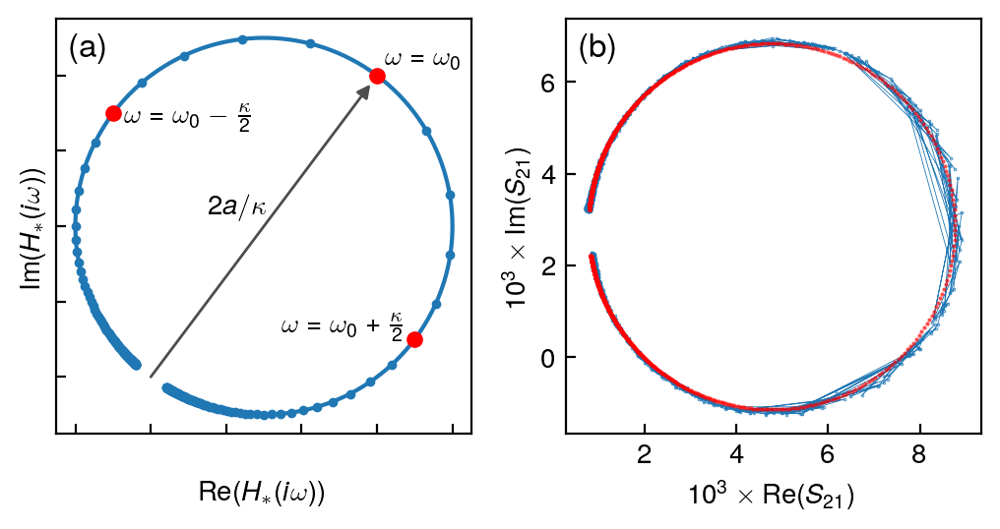

In [130]:
# fig_qcirc, axs = plt.subplots(figsize=(textwidth_mpl_in * 0.7, 4), ncols=2, layout="tight")
fig_qcirc, axs = plt.subplots(figsize=(textwidth_mpl_in * 0.5, 3), ncols=2, layout="tight")
q_circle_figure(
    plot_networks=[gemina_base_t_sweeps[4.5][21, +1].s21],
    fig=fig_qcirc,
    axs=axs,
)
# for ax in axs:
#     style.make_paper_grids(ax)
label_subplots(fig_qcirc, axs)

In [131]:
# fig_qcirc.savefig('20250522-qcircle.pdf', dpi=600)

## Supplement: ringdown plot

In [132]:
rdplot_probe_pos = 3.00  # 3 mm according to stage readout

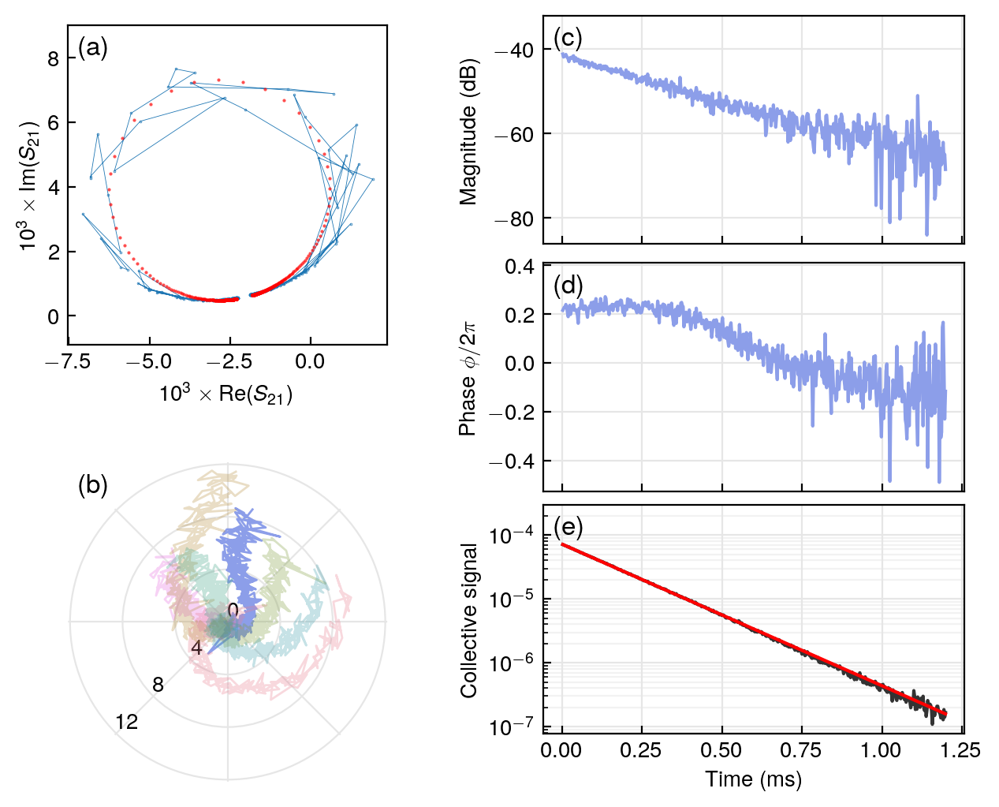

In [133]:
# gridspec inside gridspec
fig_ringdowns = plt.figure(
    figsize=(0.6 * textwidth_mpl_in, 5),
    layout='constrained',
)
gs0 = gridspec.GridSpec(
    nrows=1, ncols=3, figure=fig_ringdowns, width_ratios=[1, 0.15, 1.4],
)

gs00 = gs0[0].subgridspec(nrows=3, ncols=1, height_ratios=[1, 0.1, 1])
ax_sweep = fig_ringdowns.add_subplot(gs00[0])
ax_polar = fig_ringdowns.add_subplot(gs00[-1], projection='polar')

gs02 = gs0[-1].subgridspec(nrows=3, ncols=1)
right_axs = gs02.subplots(sharex=True)
ax_db, ax_phase, ax_collective = right_axs

axs = np.array([
    ax_sweep,
    ax_polar,
    ax_db,
    ax_phase,
    ax_collective,
])
# ax0 = fig_ringdowns.add_subplot(gs0[0])
# gs_rdset = gs0[1].subgridspec(
#     nrows=3,
#     ncols=3,
#     # subplot_spec=gs0[0],
# )
# rdset_axs = gs_rdset.subplots()

single_network_vf_cartesian(gemina_base_t_sweeps[rdplot_probe_pos][23, +1].s21, axs[0])

xrange = (None, 1.2e-3)
collective_fit = gemina_rds.collective_fits[rdplot_probe_pos][23, +1]
ringdown_set = collective_fit.ringdown_set
palette_n = 7
palette = sns.color_palette('husl', palette_n, desat=0.8)
offset = collective_fit.fit_result.params['offset_re'] + 1j * collective_fit.fit_result.params['offset_im']
for i in range(palette_n):
    ringdown_set[i+4].plot_polar(
        ax=axs[1],
        offset=offset,
        xrange=xrange,
        scale=1e+3,
        linewidth=1,
        alpha=(1 if i == 0 else 0.3),
        color=palette[(i+5)%7],
    )
    # ax.set_xlim(-2, +2)
    # ax.set_ylim(-2, +2)
    # ax.scatter(0, 0, color='red', marker='+')
    # ax.set_aspect(1, adjustable='datalim')
    # circle = matplotlib.patches.Circle((0, 0), 0.005, ec="0.5", fc='none')
    # ax.add_artist(circle)
axs[1].set_rlabel_position(-135)  # Move radial labels away from plotted line
axs[1].yaxis.set_major_locator(ticker.MultipleLocator(4))
axs[1].tick_params(axis='x', labelbottom=False)

# axs[1].grid(visible=False, axis='x')
style.make_paper_grids(axs[1])

axs[1].spines['polar'].set_visible(False)
# axs[1].set_title(R'$10^3 \times (s^{(j)}(t) - s_\infty)$', )

ringdown = ringdown_set[4]

ringdown.plot_db(xscale=1e+3, offset=offset, xrange=xrange, ax=ax_db, color=palette[5], alpha=1)
# ax_db.set_ylabel(R'$|s^{(0)}(t) - s_\infty|$ (dB)')
ax_db.set_ylabel(f'Magnitude ({Units.DB.mplstr()})')
ax_db.get_legend().remove()

ringdown.plot_phase(xscale=1e+3, offset=offset, xrange=xrange, ax=ax_phase, color=palette[5], alpha=1)
# ax_phase.set_ylabel(R'$\angle(s^{(0)}(t) - s_\infty)/2\pi$')
ax_phase.set_ylabel(R'Phase $\phi/2\pi$')
collective_fit.plot_fit(
    ax_collective,
    xscale=1e+3,
    xrange=xrange,
    data_kw=dict(color='0.2'),
    model_kw=dict(color='red'),
    legend_kw=None,
    noise_removed=True,
)
# $\langle |s^{(j)}(t) - s_\infty|^2 \rangle_j - \sigma^2$
ax_collective.set_ylabel(R'Collective signal')
right_axs[-1].set_xlabel(f'Time ({Units.MS.mplstr()})')
for i, ax in enumerate(right_axs):
    ymax = ax.get_ylim()[1]
    bumps = [7, 0.1, 2e-4]
    ax.set_ylim(None, ymax + bumps[i])

fig_ringdowns.align_ylabels(axs=right_axs[:2])

for ax in right_axs:
    style.make_paper_grids(ax)


# workaround to ensure that xticks are plotted over ygridlines
# current matplotlib draws each axis as a unit
for ax in [ax_collective]:
    ax.xaxis.set_zorder(ax.yaxis.get_zorder() + 0.01)

# fig_ringdowns.align_labels()
label_subplots(fig_ringdowns, axs)

In [134]:
# fig_ringdowns.savefig('20250522-ringdowns-supp.pdf', dpi=600)

In [135]:
# probe position for this data
print(f'{lab_constants.stage_position_to_radius(rdplot_probe_pos)} mm')

17.295 mm


## Supplement: BCS resistance

In [136]:
exemplar_temp_fit_basic = TemperatureFit(
    exemplar_mode_data,
    rrr=witness_sample_rrr,
    method='basic',
    # these below don't matter since we're using method='basic'...
    warm_lambda=warm_lambda,
    impure_lambda=impure_lambda,
    impure_xi=impure_xi,
)

# finesse, prefactor
exemplar_temp_fit_basic.fit(6e+7, 1)

exemplar_temp_fit_basic_gap = TemperatureFit(
    exemplar_mode_data,
    rrr=witness_sample_rrr,
    method='basic_gap',
    # these below don't matter since we're using method='basic'...
    warm_lambda=warm_lambda,
    impure_lambda=impure_lambda,
    impure_xi=impure_xi,
)
# finesse, prefactor, gap
exemplar_temp_fit_basic_gap.fit(6e+7, 1, 17.67)

### Fit methodology comparison

/Users/txz/Desktop/data-avail-test/suprtools/build/__editable__.suprtools-2025.8.14-py3-none-any/suprtools/cavity_loss.py:173: RuntimeWarning: invalid value encountered in arccosh
  np.arccosh(purity_a),
/var/folders/vf/8dv3_415509c5xpb5thw4ntm0000gn/T/ipykernel_92303/776245344.py:11: RuntimeWarning: divide by zero encountered in divide
  return geom_factor_f / x


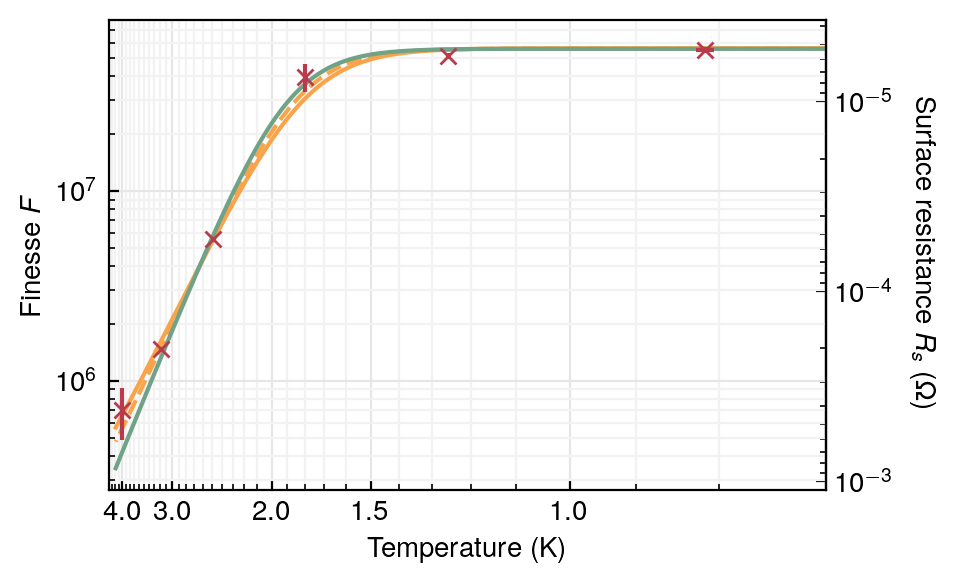

In [137]:
from matplotlib.axes import Axes

from suprtools.cavity_loss import TypeIISuperconductor


fig_bcs_compare, ax = plt.subplots(figsize=(0.45 * textwidth_mpl_in, 2.8), layout='constrained')

temp_space = np.linspace(1, 4)

def finesse_resistance_converter(x):
    return geom_factor_f / x

# def plot_bcs_line(ax: Axes, material: TypeIISuperconductor, method, fudge_factor=1, **kwargs):
#     '''
#     Fudge factor allows us to adjust shape of curve for the basic computation method.
#     '''
#     surface_resistance = material.bcs_surface_resistance(
#         exemplar_mode_data['freq'].mean(),
#         temp_space,
#         method=method,
#     )
#     ax.plot(
#         temp_space,
#         finesse_resistance_converter(fudge_factor * surface_resistance),
#         **kwargs,
#     )

numeric_color = colors.stanford.bay
basic_color = colors.stanford.poppy_light
# plot_bcs_line(
#     ax,
#     fit_nb,
#     method='basic',
#     # fudge_factor=0.05,
#     label=R'$\hbar\omega\ll k_B T$ approximation',
#     color=basic_color,
# )
# plot_bcs_line(
#     ax,
#     Niobium(
#         residual_resistivity_ratio=fit_nb.rrr,
#         gap_temperature=20.3,
#         warm_lambda=warm_lambda,
#         impure_lambda=impure_lambda,
#         impure_xi=impure_xi,
#     ),
#     method='basic',
#     label=R'approximation, $\Delta/k_B=20.3$ K',
#     color=basic_color,
#     linestyle='dashed',
# )
# plot_bcs_line(
#     ax,
#     fit_nb,
#     method='numeric',
#     label='numeric',
#     color=numeric_color,
# )


ax.set_ylabel(R'Finesse $F$')
secax = ax.secondary_yaxis('right', functions=(finesse_resistance_converter,)*2)
# secax.set_ylabel(R'BCS surface resistance $R_\mathrm{{BCS}}$ ($\Omega$)')
secax.set_ylabel(
    Rf'Surface resistance $R_s$ ({Units.OHM.mplstr()})',
    **(descending_vlabel_kw | dict(labelpad=15)),
)
ax.set_xlabel(f'Temperature ({Units.K.mplstr()})')

# ax.invert_yaxis()
set_reci_ax(ax)
style.make_paper_grids(ax)
ax.set_xticks([1.0, 1.5, 2.0, 3.0, 4.0])
ax.set_xticks(np.linspace(0.5, 4.4, 40), minor=True)
# ax.xaxis.set_minor_locator(AutoMinorLocator())
# ax.minorticks_on()
# ax.legend(fontsize='small')

ax.set_xlim(0.7, None)
exemplar_temp_fit_basic.plot(
    ax=ax,
    plot_data=False,
    marker='x',
    color=basic_color,
    # alpha=0.6,
)
exemplar_temp_fit_basic_gap.plot(
    ax=ax,
    plot_data=False,
    marker='x',
    color=basic_color,
    linestyle='dashed',
    # alpha=0.6,
)
exemplar_temp_fit.plot(
    ax=ax,
    plot_data=False,
    marker='x',
    color=numeric_color,
)
exemplar_temp_fit.plot_data(ax=ax, color=gemina_color, marker='x', linestyle='None')

ax.set_yscale('log')

# workaround to ensure that xticks are plotted over ygridlines
# current matplotlib draws each axis as a unit
ax.yaxis.set_zorder(ax.xaxis.get_zorder() + 0.01)

In [138]:
print(exemplar_temp_fit_basic_gap.upopt[2])

18.9+/-0.6


In [139]:
# fig_bcs_compare.savefig('20250522-bcs-compare.pdf', dpi=600)

### Mirror coating fitted stats

In [140]:
print('\n'.join((
    f'Mean free path: {fit_nb.mean_free_path * 1e+9:.1f} nm',
    f'Penetration depth at 0 K: {fit_nb.effective_penetration_depth(temperature=0) * 1e+9:.1f} nm',
    f'Coherence length with impurities: {fit_nb.effective_coherence_length * 1e+9:.1f} nm',
)))

Mean free path: 323.5 nm
Penetration depth at 0 K: 39.8 nm
Coherence length with impurities: 35.6 nm


## Supplement: vortex loss

In [141]:
from paper_figures import segment_length_dep_plot, vortex_loss_rrr_dep_plot  # noqa:F401

/Users/txz/Desktop/data-avail-test/mmw-cavity-paper-analysis/paper_figures/__init__.py:1122: RuntimeWarning: divide by zero encountered in divide
  return geom_factor_f / (r_per_b * magnetic_flux_density)


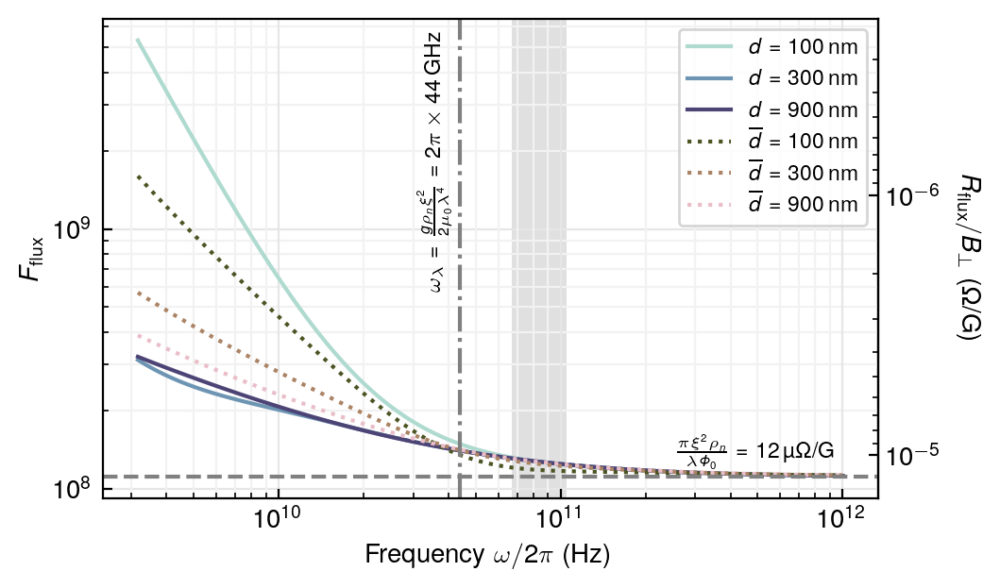

In [142]:
fig_vortex, axs = plt.subplots(
    figsize=(0.5*textwidth_mpl_in, 3),
    # nrows=2,
    sharex=True, sharey=True,
    layout='constrained',
)
axs = np.atleast_1d(axs)

exemplar_rrr = fit_nb.rrr
highlight_range = []

plot_freqs = np.geomspace(1e+9 * np.sqrt(10), 1e+12, num=101)
_, secax0 = segment_length_dep_plot(
    rrr=exemplar_rrr,
    freqs=plot_freqs,
    segment_lengths=[100e-9, 300e-9, 900e-9],
    magnetic_flux_density=measured_b_perp.n,
    temperature=min_temp.n,
    impure_lambda=impure_lambda,
    impure_xi=impure_xi,
    vspan=np.asarray(plot_range_ghz) * 1e+9,
    ax=axs[0],
)
# _, secax1 = vortex_loss_rrr_dep_plot(
#     exemplar_rrr,
#     freqs=plot_freqs,
#     mean_segment_length=exemplar_segment_length,
#     temperature=min_temp.n,
#     impure_lambda=impure_lambda,
#     impure_xi=impure_xi,
#     vspan=np.asarray(plot_range_ghz) * 1e+9,
#     ax=axs[1],
# )
axs[-1].set_xlabel(Rf'Frequency $\omega/2\pi$ ({Units.HZ.mplstr()})')
for ax in axs:
    ax.set_ylabel(R'$F_\text{flux}$')
    style.make_paper_grids(ax)
for secax in [secax0]:
    secax.set_ylabel(
        (
            R'$R_\text{flux}/B_\perp$ (\si{\ohm/\gauss})'
            if mpl_usetex() else
            R'$R_\text{flux}/B_\perp$ ($\Omega$/G)'
        ),
        **(descending_vlabel_kw | dict(labelpad=15)),
    )
fig_vortex.align_labels()
# axs[0].set_ylim(None, 3.2e+11)


# axs[0].set_title(f'Vortex loss at RRR = {exemplar_rrr:.3g}')
# axs[1].set_title(fR'Vortex loss for $\ell \sim \mathrm{{Exp}}({exemplar_segment_length * 1e+9:.3g})$ nm')
# label_subplots(fig_vortex, axs)


# workaround to ensure that ticks are plotted over gridlines
# current matplotlib draws each axis as a unit
axs[0].xaxis.set_zorder(axs[0].yaxis.get_zorder() + 0.01)

In [143]:
# fig_vortex.savefig('20250522-vortex-compare.pdf', dpi=600)

## Supplement: performance with atoms (incl. cooperativity)

In [144]:
import arc
from suprtools.rydberg import CircularTransitionSeries, LowLTransitionSeries

In [145]:
lithium = arc.Lithium6()
sodium = arc.Sodium()
potassium = arc.Potassium()
rb = arc.Rubidium()
cs = arc.Cesium()

### Cavity QED numbers

In [146]:
from typing import NamedTuple
from IPython.display import display, Math


e = scipy.constants.elementary_charge
h = scipy.constants.Planck
a0 = scipy.constants.value('Bohr radius')
eps0 = scipy.constants.epsilon_0


class CQEDNumbers(NamedTuple):
    # everything in CYCLIC units (Hz, not rad/s)
    g: float
    kappa: float
    gamma: float


def report_cqed_numbers_circular(
        atom: arc.AlkaliAtom,
        upper_n: int,
        cavity_geo: SymmetricCavityGeometry,
):
    lower_n = upper_n - 1
    tran_series = CircularTransitionSeries(atom, [upper_n], plot_kw=dict())
    tran_series_lower = CircularTransitionSeries(atom, [lower_n], plot_kw=dict())

    transition_freq = atom.scaledRydbergConstant * e / h * (
        lower_n**(-2) - upper_n**(-2)
    )
    transition_wavelen = c / transition_freq

    print(f'Transition freq (Rydberg formula): {transition_freq/1e+9:.3f} GHz')
    print(f'Transition freq (numeric): {-tran_series.transition_frequencies().item()/1e+9:.3f} GHz')
    print(f'Wavelength: {transition_wavelen * 1e+3:.3f} mm')

    dipole_matrix_element_dimless = upper_n**2 / np.sqrt(2)
    print(f'd_asymptotic = {dipole_matrix_element_dimless:.0f} e a_0')

    dipole_matrix_element_numerical = tran_series.dipole_matrix_elements().item()
    print(f'd_num = {dipole_matrix_element_numerical:.0f} ea_0')

    dipole_matrix_element = a0 * e * dipole_matrix_element_numerical

    cooperativity_estimate = 6 / (pi**2) * concordance_finesse * transition_wavelen / cavity_geo.z0_u * 1/2
    print(fR'\eta = {cooperativity_estimate:S}')

    display(Math('g'))

    print(f'z_R = {cavity_geo.z0_u * 1e+3:S} mm')
    waist = unp.sqrt(transition_wavelen * cavity_geo.z0_u / pi)
    print(f'w_0 = {waist * 1e+3:S} mm')

    mode_volume = cavity_geo._mode_volume_fromfreq(transition_freq)
    print(f'V_mode = {mode_volume * 1e+6:.3f} cm^3')

    vacuum_field = cavity_geo.waist_vacuum_field_fromfreq(transition_freq)
    print(f'vacuum field = {vacuum_field * 1e+3:.3f} mV/m')

    # accounts for mismatch between sigma+ transition and linear cavity polarization
    coupling_g = dipole_matrix_element * vacuum_field / h / np.sqrt(2)
    print(f'g = 2pi * {coupling_g/1e+3:.3f} kHz')

    display(Math(R'\kappa'))

    print(f'FSR = {cavity_geo.fsr_u / 1e+9:S} GHz')

    concordance_linewidth = cavity_geo.fsr_u / concordance_finesse
    print(fR'\kappa = 2\pi * {concordance_linewidth:S} Hz')

    display(Math(R'\Gamma'))

    gamma_cyc = dipole_matrix_element**2 * (2 * pi * transition_freq)**3 / (3 * pi * eps0 * h * c**3)  # cyclic units
    display(Math(fR'\Gamma_\text{{analytic}} = 2\pi \times {gamma_cyc:.3f}\,\mathrm{{Hz}}'))

    gamma_cyc_arc = 1 / tran_series.init_state_lifetimes().item() / 2 / pi
    display(Math(fR'\Gamma_\text{{ARC}} = 2\pi \times {gamma_cyc_arc:.3f}\,\mathrm{{Hz}}'))

    gamma_cyc_arc_lower = 1 / tran_series_lower.init_state_lifetimes().item() / 2 / pi
    display(Math(fR'\Gamma_\text{{ARC}}(n - 1) = 2\pi \times {gamma_cyc_arc_lower:.3f}\,\mathrm{{Hz}}'))

    cooperativity_est_alt = 4 * coupling_g**2 / (concordance_linewidth * gamma_cyc)
    display(Math(fR'\frac{{4g^2}}{{\kappa\Gamma}} = {cooperativity_est_alt:SL}'))

    return CQEDNumbers(g=coupling_g, kappa=concordance_linewidth.n, gamma=gamma_cyc)

In [147]:
cs_cqed_numbers = report_cqed_numbers_circular(cs, 42, hadriana_geo)

Transition freq (Rydberg formula): 92.084 GHz
Transition freq (numeric): 92.084 GHz
Wavelength: 3.256 mm
d_asymptotic = 1247 e a_0
d_num = 1195 ea_0
\eta = 2.72(4)e+06


<IPython.core.display.Math object>

z_R = 21.134(6) mm
w_0 = 4.6799(6) mm
V_mode = 0.811 cm^3
vacuum field = 2.061 mV/m
g = 2pi * 22.281 kHz


<IPython.core.display.Math object>

FSR = 3.178892(4) GHz
\kappa = 2\pi * 54.7(8) Hz


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [148]:
cs_cqed_numbers_lower = report_cqed_numbers_circular(cs, 41, hadriana_geo)

Transition freq (Rydberg formula): 99.076 GHz
Transition freq (numeric): 99.076 GHz
Wavelength: 3.026 mm
d_asymptotic = 1189 e a_0
d_num = 1137 ea_0
\eta = 2.53(4)e+06


<IPython.core.display.Math object>

z_R = 21.134(6) mm
w_0 = 4.5117(6) mm
V_mode = 0.754 cm^3
vacuum field = 2.218 mV/m
g = 2pi * 22.822 kHz


<IPython.core.display.Math object>

FSR = 3.178892(4) GHz
\kappa = 2\pi * 54.7(8) Hz


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [149]:
report_cqed_numbers_circular(potassium, 42, hadriana_geo)

Transition freq (Rydberg formula): 92.083 GHz
Transition freq (numeric): 92.083 GHz
Wavelength: 3.256 mm
d_asymptotic = 1247 e a_0
d_num = 1195 ea_0
\eta = 2.72(4)e+06


<IPython.core.display.Math object>

z_R = 21.134(6) mm
w_0 = 4.6799(6) mm
V_mode = 0.811 cm^3
vacuum field = 2.061 mV/m
g = 2pi * 22.281 kHz


<IPython.core.display.Math object>

FSR = 3.178892(4) GHz
\kappa = 2\pi * 54.7(8) Hz


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

CQEDNumbers(g=22281.48146285379, kappa=54.65772378551285, gamma=13.341082344893685)

### Branching

$42S_{1/2} \rightarrow 41P_{3/2}$

In [150]:
class AtomicStateFS(NamedTuple):
    n: int
    ell: int
    j: float
    mj: float

    @property
    def nlj(self):
        return self[:-1]


def report_cqed_numbers_lowl(
        atom: arc.AlkaliAtom,
        upper_state: AtomicStateFS,
        lower_state: AtomicStateFS,
        cavity_geo: SymmetricCavityGeometry,
):
    transition_freq = atom.getTransitionFrequency(*lower_state.nlj, *upper_state.nlj)
    transition_wavelen = c / transition_freq

    display(
        Math(Rf'\omega_\text{{numeric}} = 2\pi\times {transition_freq / 1e+9: .3f} GHz'),
        Math(Rf'\lambda = {transition_wavelen * 1e+3:.3f} mm'),
    )

    d_polarization = upper_state.mj - lower_state.mj
    dipole_matrix_element_numerical = atom.getDipoleMatrixElement(
        *lower_state,
        *upper_state,
        d_polarization,
    )
    print(f'd_num = {dipole_matrix_element_numerical:.0f} ea_0')

    dipole_matrix_element = a0 * e * dipole_matrix_element_numerical
    if d_polarization == 0:
        polarization_overlap_sqd = 1
    elif d_polarization in [+1, -1]:
        polarization_overlap_sqd = 1/2
    else:
        polarization_overlap_sqd = 0

    # cyclic units
    transition_gamma_cyc = (
        dipole_matrix_element**2 * (2 * pi * transition_freq)**3 / (3 * pi * eps0 * h * c**3)
    )
    transition_gamma_cyc_all_mj = atom.getTransitionRate(
        *upper_state.nlj,
        *lower_state.nlj,
        temperature=0,
    ) / (2 * pi)
    overall_gamma_cyc = 1 / atom.getStateLifetime(*upper_state.nlj) / (2 * pi)
    overall_gamma_cyc_lower = 1 / atom.getStateLifetime(*lower_state.nlj) / (2 * pi)
    branching_fraction = transition_gamma_cyc / overall_gamma_cyc
    branching_fraction_all_mj = transition_gamma_cyc_all_mj / overall_gamma_cyc
    display(
        Math(fR'\Gamma_{{eg}} = 2\pi\times {transition_gamma_cyc:.3f} Hz'),
        Math(fR'\Gamma_{{e \to g_1 g_2 \dots}} = 2\pi \times {transition_gamma_cyc_all_mj:.3f} Hz'),
        Math(fR'\Gamma_{{e}} = 2\pi \times {overall_gamma_cyc:.3f} Hz'),
    )
    print(f'Branching fraction (to |g> only) {branching_fraction:.3e}')
    print(f'Branching fraction (to all m_j) {branching_fraction_all_mj:.3e}')
    print(f'Ratio (rational, b/c clebsch gordan): {transition_gamma_cyc / transition_gamma_cyc_all_mj : .3f}')

    cooperativity_estimate = (
        6 / (pi**2) * concordance_finesse * transition_wavelen / cavity_geo.z0_u
        * polarization_overlap_sqd
        * branching_fraction
    )
    print(fR'\eta = {cooperativity_estimate:S}')

    display(Math('g'))

    print(f'z_R = {cavity_geo.z0_u * 1e+3:S} mm')
    waist = unp.sqrt(transition_wavelen * cavity_geo.z0_u / pi)
    print(f'w_0 = {waist * 1e+3:S} mm')

    mode_volume = cavity_geo._mode_volume_fromfreq(transition_freq)
    print(f'V_mode = {mode_volume * 1e+6:.3f} cm^3')

    vacuum_field = cavity_geo.waist_vacuum_field_fromfreq(transition_freq)
    print(f'vacuum field = {vacuum_field * 1e+3:.3f} mV/m')

    # accounts for potential polarization mismatch
    coupling_g = dipole_matrix_element * vacuum_field / h * np.sqrt(polarization_overlap_sqd)
    print(f'g = 2pi * {coupling_g/1e+3:.3f} kHz')

    display(Math(R'\kappa'))

    print(f'FSR = {cavity_geo.fsr_u / 1e+9:S} GHz')

    concordance_linewidth = cavity_geo.fsr_u / concordance_finesse
    print(fR'\kappa = 2\pi * {concordance_linewidth:S} Hz')

    display(Math(R'\Gamma'))

    display(Math(fR'\Gamma_{{eg,\text{{analytic}}}} = 2\pi \times {transition_gamma_cyc:.3f}\,\mathrm{{Hz}}'))
    display(Math(fR'\Gamma_{{e,\text{{ARC}}}} = 2\pi \times {overall_gamma_cyc:.3f}\,\mathrm{{Hz}}'))
    display(Math(fR'\Gamma_{{e,\text{{ARC}},n - 1}} = 2\pi \times {overall_gamma_cyc_lower:.3f}\,\mathrm{{Hz}}'))

    cooperativity_est_alt = 4 * coupling_g**2 / (concordance_linewidth * overall_gamma_cyc)
    display(Math(fR'\frac{{4g^2}}{{\kappa\Gamma}} = {cooperativity_est_alt:SL}'))

    return CQEDNumbers(g=coupling_g, kappa=concordance_linewidth.n, gamma=overall_gamma_cyc)


In [151]:
lowl_n_upper = 37
lowl_upper_state = AtomicStateFS(lowl_n_upper, 0, 1/2, 1/2)
lowl_lower_state = AtomicStateFS(lowl_n_upper - 1, 1, 3/2, +1/2)

In [152]:
cs_cqed_numbers_lowl = report_cqed_numbers_lowl(cs, lowl_upper_state, lowl_lower_state, hadriana_geo)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

d_num = 542 ea_0


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Branching fraction (to |g> only) 8.400e-04
Branching fraction (to all m_j) 2.520e-03
Ratio (rational, b/c clebsch gordan):  0.333
\eta = 4.39(7)e+03


<IPython.core.display.Math object>

z_R = 21.134(6) mm
w_0 = 4.5840(6) mm
V_mode = 0.778 cm^3
vacuum field = 2.148 mV/m
g = 2pi * 14.910 kHz


<IPython.core.display.Math object>

FSR = 3.178892(4) GHz
\kappa = 2\pi * 54.7(8) Hz


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

### Cooperativity plots

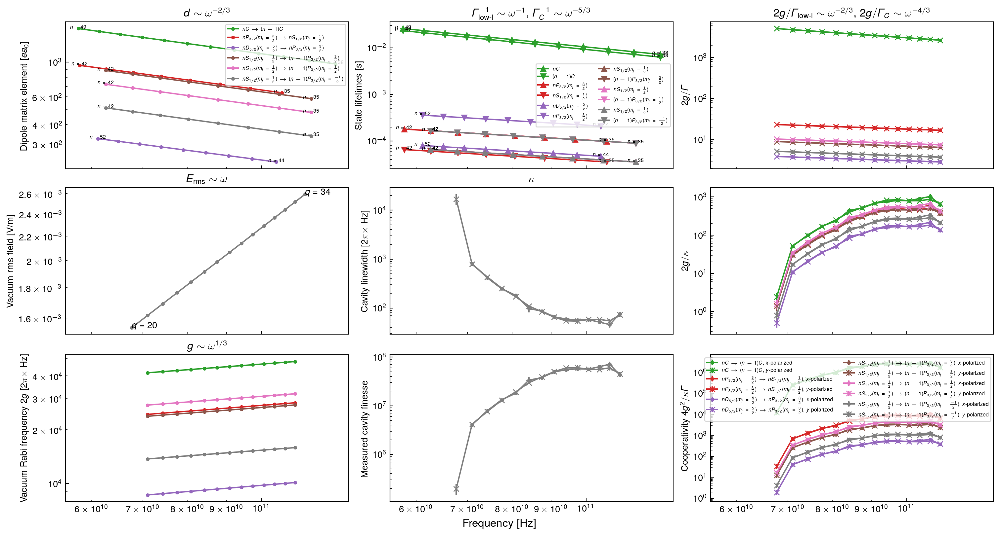

In [153]:
gemina_rds.cooperativity_summary_plot(cs)

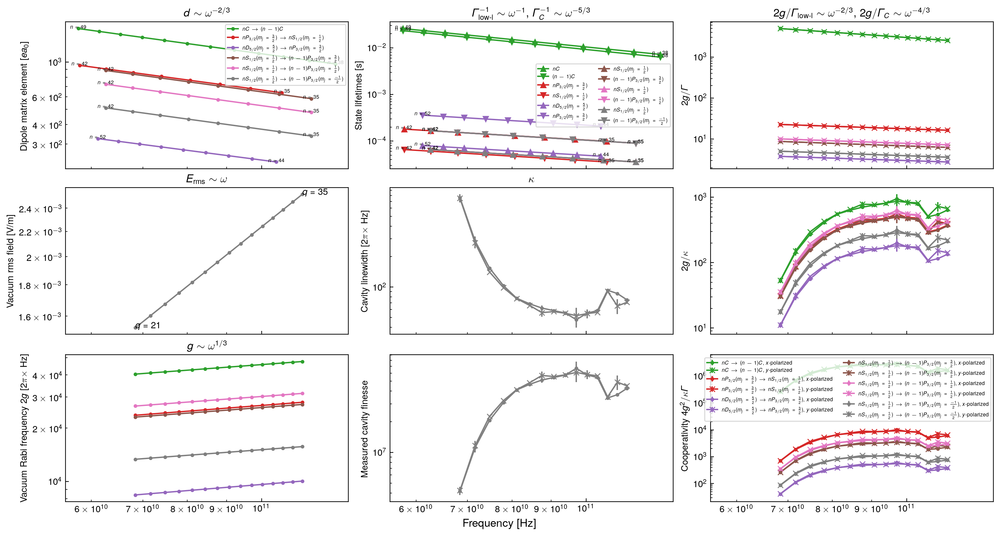

In [154]:
hadriana_rds.cooperativity_summary_plot(cs)

## Supplement: gate fidelities

In [155]:
def direct_sum(*args):
    for arg in args:
        if np.ndim(arg) != 2:
            raise ValueError
    
    n_blocks = len(args)
    shapes = tuple(np.shape(arg) for arg in args)
        # s0, s1 = np.shape(arg)
        # if s0 != s1:
        #     raise ValueError
    
    return np.block([
        [
            (
                args[row]
                if row == col else
                np.zeros((shapes[row][0], shapes[col][1]))
            )
            for col in range(n_blocks)
        ]
        for row in range(n_blocks)
    ])


In [156]:
# %matplotlib widget
from scipy import linalg

In [157]:
def tavis_cummings_hamiltonian_block(n, g, delta):
    if n >= 2:
        grtn = g * np.sqrt(n)
        grtnm = g * np.sqrt(n - 1)

        return np.array([
            [2 * delta, grtnm, grtnm, 0   ],
            [grtnm    , delta, 0    , grtn],
            [grtnm    , 0    , delta, grtn],
            [0        , grtn , grtn , 0   ],
        ])
    elif n == 1:
        return np.array([
            [delta, 0    , g],
            [0    , delta, g],
            [g    , g    , 0],
        ])
    elif n == 0:
        return np.array([
            [0],
        ])

    raise ValueError


def tavis_cummings_hamiltonian_012(g, delta):
    return direct_sum(*[
        tavis_cummings_hamiltonian_block(n, g, delta)
        for n in range(3)
    ])


def decay_uncorrelated_n(n, kappa, gammas):
    gamma_up, gamma_down = gammas
    gamma_bar = (gamma_up + gamma_down) / 2
    if n >= 2:
        hamiltonian = (
            2 * np.diag([gamma_up, gamma_bar, gamma_bar, gamma_down])
            + kappa * np.diag([n-2, n-1, n-1, n])
        )
        # hamiltonian = np.array([
        #     [2*Gamma_up + kappa*(n-2), 0, 0, 0],
        #     [0, 2*Gamma_bar + kappa*(n-1), 0, 0],
        #     [0, 0, 2*Gamma_bar + kappa*(n-1), 0],
        #     [0, 0, 0, 2*Gamma_down + kappa*n],
        # ])
    elif n == 1:
        hamiltonian = np.array([
            [2 * gamma_bar, 0            , 0                     ],
            [0            , 2 * gamma_bar, 0                     ],
            [0            , 0            , 2 * gamma_down + kappa],
        ])
    elif n == 0:
        hamiltonian = np.array([
            [2 * gamma_down],
        ])
    else:
        raise ValueError

    return -1j * hamiltonian / 2


In [158]:
def propagator(hamiltonian, time):
    return linalg.expm(-1j * time * hamiltonian)

In [159]:
iswap_operator = direct_sum(
    # 0-excitation block
    np.array([[1]]),
    # 1-excitation block
    np.array([
        [0 , 1j, 0],
        [1j, 0 , 0],
        [0 , 0 , 1],
    ]),
    # 2-excitation block
    np.identity(4),
)

zero_photon_projector = direct_sum(
    np.array([[1]]),
    np.array([
        [1, 0, 0],
        [0, 1, 0],
    ]),
    np.array([
        [1, 0, 0, 0],
    ]),
)
# def proj_zero_photon():
#     P_0 = np.array([[1]])
#     P_1 = np.array([[1,0,0],
#                     [0,1,0]])
#     P_2 = np.array([[1,0,0,0]])

#     P = direct_sum(P_0, P_1, P_2)

#     return P

def global_Z_rot(theta):
    exp_i_theta = np.exp(1j * theta)

    z_rot_0 = np.array([[1]])
    z_rot_1 = np.diag([exp_i_theta, exp_i_theta, 1])
    z_rot_2 = np.diag([exp_i_theta**2, exp_i_theta, exp_i_theta, 1])

    return direct_sum(z_rot_0, z_rot_1, z_rot_2)

def rotate_U_back(u, method='smart'):
    '''
    u: unitary
    '''
    if method == 'smart':
        proj = zero_photon_projector
        i_component = (proj @ u @ proj.conj().T)[2][1]
        if i_component != 0:
            theta = np.angle(i_component)
        else:
            theta = 0
        rot_angle = (np.pi/2 - theta)
    else:
        # Just keeping a pi/2 rotation angle for now
        rot_angle = -pi/2
    
    return u @ global_Z_rot(rot_angle)

def iswap_fidelity(u):
    '''
    u: unitary
    '''
    proj = zero_photon_projector
    
    M_rel = proj @ iswap_operator.conj().T @ u @ proj.conj().T
    
    trace_1 = np.trace(M_rel.conj().T @ M_rel)
    trace_2 = (np.abs(np.trace(M_rel)))**2
    
    n_rel = 4
    return (trace_1 + trace_2) / (n_rel * (n_rel + 1))

def iswap_fidelity_rot(U, rotation_method='dumb'):
    U_rotated = rotate_U_back(U, method=rotation_method)
    F = iswap_fidelity(U_rotated)
    return F

In [160]:
def ideal_ds_ts(g, m):
    delta_m = (m-1) * g * np.sqrt(8/(2*m-1))
    t_m = 2 * pi * (m-1) / delta_m

    return t_m, delta_m

In [161]:
def tavis_cummings_iswap_fidelity(g, delta, time, decay_hamiltonian=0, rotation_method='dumb'):
    hamiltonian_nodecay = tavis_cummings_hamiltonian_012(g, delta)
    propagator_nodecay = propagator(hamiltonian_nodecay + decay_hamiltonian, time)
    return np.real(iswap_fidelity_rot(propagator_nodecay, rotation_method))

def fids_delta_t(g, gammas, kappa, deltas, times, include_decay: bool, rotation_method='dumb'):
    decay_hamiltonian = (
        direct_sum(*[decay_uncorrelated_n(n, kappa, gammas) for n in range(3)])
        if include_decay else
        0
    )

    fidelities = []
    for delta, time in zip(deltas, times):
        fidelities.append(tavis_cummings_iswap_fidelity(g, delta, time, decay_hamiltonian=decay_hamiltonian, rotation_method=rotation_method))

    return np.asarray(fidelities)
    # Hs = [tavis_cummings_hamiltonian_012(g, delta) for delta in deltas]
    # H_effs = [H + decay_hamiltonian for H in Hs]
    
    # Us_decay_uncor = [
    #     propagator(H_eff, T)
    #     for T, H_eff in zip(times, H_effs)
    # ]
    # Us_no_decay = [
    #     propagator(H, T)
    #     for T, H in zip(times, Hs)
    # ]
    
    # fids_decay_uncor = np.real([iswap_fidelity_rot(U) for U in Us_decay_uncor])
    # fids_no_decay = np.real([iswap_fidelity_rot(U) for U in Us_no_decay])
    # return fids_decay_uncor, fids_no_decay

def pi_times(g, deltas):
    return pi * np.abs(deltas) / g**2 / 2

def fidelities_at_pi_time(g, gammas, kappa, deltas, include_decay: bool, rotation_method='dumb'):
    return fids_delta_t(g, gammas, kappa, deltas, pi_times(g, deltas), include_decay=include_decay, rotation_method=rotation_method)

In [162]:
g_normed = 1
gammas_normed = g_normed / cs_cqed_numbers.g * np.array([cs_cqed_numbers_lower.gamma, cs_cqed_numbers.gamma])
kappa_normed = g_normed * cs_cqed_numbers.kappa / cs_cqed_numbers.g
print(g_normed, gammas_normed, kappa_normed)

1 [0.00067587 0.00059876] 0.002453056057378989


In [163]:
# from https://stackoverflow.com/a/14084715
# License: Creative Commons Zero (almost public domain) http://scpyce.org/cc0
# updated for numpy 2 compatibility

def sample_function(func, points, tol=0.05, min_points=16, max_level=16,
                    sample_transform=None):
    """
    Sample a 1D function to given tolerance by adaptive subdivision.

    The result of sampling is a set of points that, if plotted,
    produces a smooth curve with also sharp features of the function
    resolved.

    Parameters
    ----------
    func : callable
        Function func(x) of a single argument. It is assumed to be vectorized.
    points : array-like, 1D
        Initial points to sample, sorted in ascending order.
        These will determine also the bounds of sampling.
    tol : float, optional
        Tolerance to sample to. The condition is roughly that the total
        length of the curve on the (x, y) plane is computed up to this
        tolerance.
    min_point : int, optional
        Minimum number of points to sample.
    max_level : int, optional
        Maximum subdivision depth.
    sample_transform : callable, optional
        Function w = g(x, y). The x-samples are generated so that w
        is sampled.

    Returns
    -------
    x : ndarray
        X-coordinates
    y : ndarray
        Corresponding values of func(x)

    Notes
    -----
    This routine is useful in computing functions that are expensive
    to compute, and have sharp features --- it makes more sense to
    adaptively dedicate more sampling points for the sharp features
    than the smooth parts.

    Examples
    --------
    >>> def func(x):
    ...     '''Function with a sharp peak on a smooth background'''
    ...     a = 0.001
    ...     return x + a**2/(a**2 + x**2)
    ...
    >>> x, y = sample_function(func, [-1, 1], tol=1e-3)

    >>> import matplotlib.pyplot as plt
    >>> xx = np.linspace(-1, 1, 12000)
    >>> plt.plot(xx, func(xx), '-', x, y[0], '.')
    >>> plt.show()

    """
    return _sample_function(func, points, values=None, mask=None, depth=0,
                            tol=tol, min_points=min_points, max_level=max_level,
                            sample_transform=sample_transform)

def _sample_function(func, points, values=None, mask=None, tol=0.05,
                     depth=0, min_points=16, max_level=16,
                     sample_transform=None):
    points = np.asarray(points)

    if values is None:
        values = np.atleast_2d(func(points))

    if mask is None:
        mask = Ellipsis

    if depth > max_level:
        # recursion limit
        return points, values

    x_a = points[...,:-1][mask]
    x_b = points[...,1:][mask]

    x_c = .5*(x_a + x_b)
    y_c = np.atleast_2d(func(x_c))

    x_2 = np.r_[points, x_c]
    y_2 = np.r_['-1', values, y_c]
    j = np.argsort(x_2)

    x_2 = x_2[...,j]
    y_2 = y_2[...,j]

    # -- Determine the intervals at which refinement is necessary

    if len(x_2) < min_points:
        mask = np.ones([len(x_2)-1], dtype=bool)
    else:
        # represent the data as a path in N dimensions (scaled to unit box)
        if sample_transform is not None:
            y_2_val = sample_transform(x_2, y_2)
        else:
            y_2_val = y_2

        p = np.r_['0',
                  x_2[None,:],
                  y_2_val.real.reshape(-1, y_2_val.shape[-1]),
                  y_2_val.imag.reshape(-1, y_2_val.shape[-1])
                  ]

        sz = (p.shape[0]-1)//2

        xscale = np.ptp(x_2, axis=-1)
        yscale = abs(np.ptp(y_2_val, axis=-1)).ravel()

        p[0] /= xscale
        p[1:sz+1] /= yscale[:,None]
        p[sz+1:]  /= yscale[:,None]

        # compute the length of each line segment in the path
        dp = np.diff(p, axis=-1)
        s = np.sqrt((dp**2).sum(axis=0))
        s_tot = s.sum()

        # compute the angle between consecutive line segments
        dp /= s
        dcos = np.arccos(np.clip((dp[:,1:] * dp[:,:-1]).sum(axis=0), -1, 1))

        # determine where to subdivide: the condition is roughly that
        # the total length of the path (in the scaled data) is computed
        # to accuracy `tol`
        dp_piece = dcos * .5*(s[1:] + s[:-1])
        mask = (dp_piece > tol * s_tot)

        mask = np.r_[mask, False]
        mask[1:] |= mask[:-1].copy()


    # -- Refine, if necessary

    if mask.any():
        return _sample_function(func, x_2, y_2, mask, tol=tol, depth=depth+1,
                                min_points=min_points, max_level=max_level,
                                sample_transform=sample_transform)
    else:
        return x_2, y_2


In [164]:
1 - fidelities_at_pi_time(g_normed, gammas_normed, kappa_normed, [20 * g_normed], include_decay=False)

array([5.10752702e-05])

In [165]:
def nonlinear_func(d):
    return d**2
def nonlinear_func_inv(d):
    return np.power(d, 1/2)

fidelity_plot_max_delta = 21

deltas_sample_init = nonlinear_func_inv(
    np.linspace(
        nonlinear_func(1),
        nonlinear_func(fidelity_plot_max_delta),
        3000,
    ),
)
deltas_normed_sampled, log_infidelities_nodecay = sample_function(
    lambda delta: np.log(1 - fidelities_at_pi_time(g_normed, gammas_normed, kappa_normed, delta, include_decay=False)),
    deltas_sample_init,
    tol=0.00001,
)

In [166]:
print(f'number of points sampled: {len(deltas_normed_sampled)}')

number of points sampled: 7396


In [167]:
infids_no_decay = np.exp(log_infidelities_nodecay).flatten()
fids_decay_uncor = fidelities_at_pi_time(g_normed, gammas_normed, kappa_normed, deltas_normed_sampled, include_decay=True)

fids_decay_uncor_smart = fidelities_at_pi_time(g_normed, gammas_normed, kappa_normed, deltas_normed_sampled, include_decay=True, rotation_method='smart')
fids_no_decay_smart = fidelities_at_pi_time(g_normed, gammas_normed, kappa_normed, deltas_normed_sampled, include_decay=False, rotation_method='smart')

In [168]:
t_ms, d_ms = ideal_ds_ts(g_normed, np.arange(2, 112))  # chosen to match plot range max of Delta/g = 21
fids_decay_ms, fids_no_decay_ms = (
    fids_delta_t(g_normed, gammas_normed, kappa_normed, d_ms, t_ms, include_decay)
    for include_decay in [True, False]
)

def atom_decay_func(time, gammas):
    return np.exp(-2 * np.mean(gammas) * np.asarray(time))

def atom_decay_limit(delta, g, gammas):
    return atom_decay_func(pi_times(g, delta), gammas)

def cavity_decay_func(time, g, kappa, delta):
    return np.exp(-kappa * np.asarray(time) * g**2 / delta**2)

def cavity_decay_limit(delta, g, kappa):
    return cavity_decay_func(pi_times(g, delta), g, kappa, delta)

# decays = np.exp(- 2 * np.average(gammas) * np.array(Ts))
# decays_photon = np.exp(-kappa * np.array(Ts) * g**2 / deltas**2)

Best fidelity is 0.9814 at detuning 7.2112g
Best fidelity in m-series is 0.9811 at detuning 7.0763g


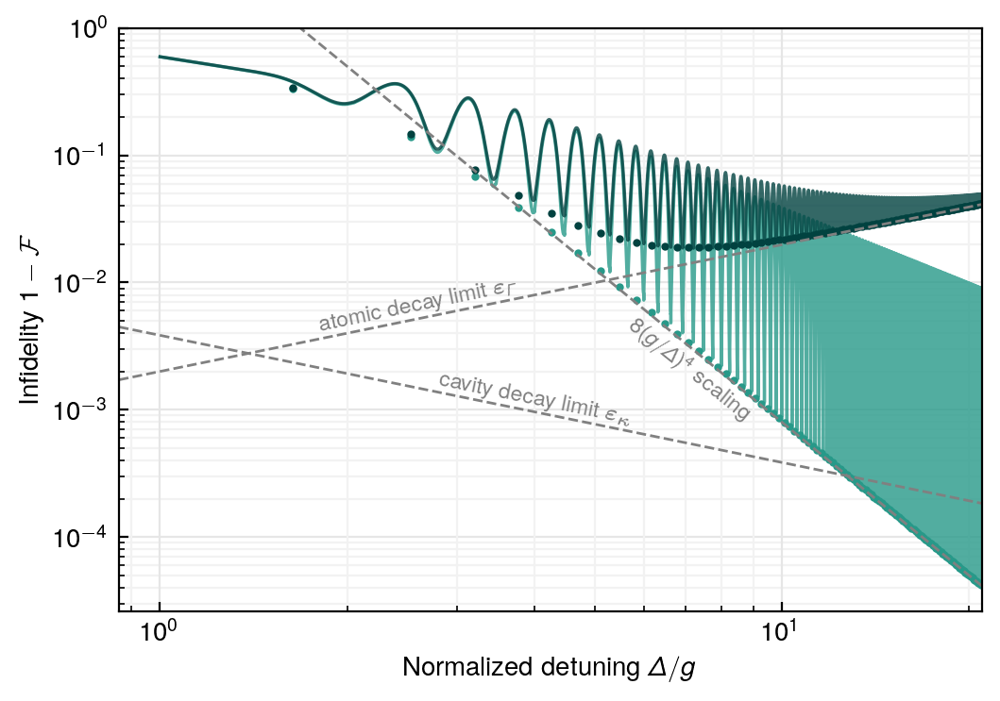

In [169]:
fig_fidelity, ax1 = plt.subplots(
    figsize=(0.5 * textwidth_mpl_in, 3.6),
    layout='constrained',
)

plot_deltas = np.abs(deltas_normed_sampled)

# no_decay_kw = dict(color=colors.stanford.bay_light)
# with_decay_kw = dict(color=colors.stanford.palo_alto_green)  # colors.stanford.palo_alto_green)

no_decay_kw = dict(color=colors.stanford.palo_verde)  # bay_light
with_decay_kw = dict(color=colors.stanford.palo_alto_green_dark)  # colors.stanford.palo_alto_green)
line_kw = dict(alpha=0.8, linewidth=1.2)

# for each Delta, we choose the local rotation phase that gives the best fidelity
ax1.plot(
    plot_deltas,
    np.minimum(infids_no_decay, 1 - fids_no_decay_smart),
    label="iSWAP error without decay",
    **line_kw,
    **no_decay_kw,
)
ax1.plot(
    plot_deltas,
    1 - np.maximum(fids_decay_uncor, fids_decay_uncor_smart),
    label="iSWAP error with decay",
    **line_kw,
    **with_decay_kw,
)

point_plot_kw = dict(marker='.', linestyle='None', markersize=4)
#, label = "error at ideal detunings without decay")
ax1.plot(
    d_ms,
    1-np.array(fids_no_decay_ms),
    **point_plot_kw,
    **no_decay_kw,
)

#, label = "error at ideal detunings with decay")
ax1.plot(
    d_ms,
    1-np.array(fids_decay_ms),
    **point_plot_kw,
    **with_decay_kw,
)

# ax1.legend()
ax1.set_xscale("log")
ax1.set_yscale("log")
ax1.set_ylim(None, 1)
ax1.set_ylabel(R"Infidelity $1-\mathcal{F}$")
ax1.set_xlabel(R"Normalized detuning $\Delta/g$")
style.make_paper_grids(ax1)

ax1.set_xlim(None, fidelity_plot_max_delta)
plot_lolim, _ = ax1.get_xlim()

# limit lines
limit_line_kw = dict(color=style.limit_line_color, linestyle='dashed', linewidth=1)
limit_plot_detunings = np.linspace(plot_lolim, fidelity_plot_max_delta, 1001)
ax1.plot(
    limit_plot_detunings,
    1 - atom_decay_limit(limit_plot_detunings, g_normed, gammas_normed),
    label = "Atomic decay limit",
    **limit_line_kw,
)
ax1.plot(
    limit_plot_detunings,
    1 - cavity_decay_limit(limit_plot_detunings, g_normed, kappa_normed),
    label = "Photon decay limit",
    **limit_line_kw,
)
ax1.plot(limit_plot_detunings, 8/limit_plot_detunings**4, label = R"$8/\Delta^4$ scaling", **limit_line_kw)
# ax1.plot(limit_plot_detunings, 4/limit_plot_detunings**2, label = R"$4/\Delta^2$ scaling", **limit_line_kw)

best_withdecay_ind = np.argmax(fids_decay_uncor)
print(
    f'Best fidelity is {fids_decay_uncor[best_withdecay_ind]:.4f} '
    f'at detuning {plot_deltas[best_withdecay_ind]:.4f}g'
)
best_mseries_ind = np.argmax(fids_decay_ms)
print(
    'Best fidelity in m-series is '
    f'{fids_decay_ms[best_mseries_ind]:.4f} '
    f'at detuning {d_ms[best_mseries_ind]:.4f}g'
)

# workaround to ensure that xticks are plotted over ygridlines
# current matplotlib draws each axis as a unit
ax1.xaxis.set_zorder(ax1.yaxis.get_zorder() + 0.01)

annotate_line(
    ax1,
    R'atomic decay limit $\boldsymbol{\varepsilon}_{\boldsymbol{\Gamma}}$',
    annotation_x=2.6,
    line_func=(lambda delta: 1 - atom_decay_limit(delta, g_normed, gammas_normed)),
    horizontalalignment='center',
    verticalalignment='baseline',
    offset_pts=(0, 3),
    fontsize='small',
    color=style.limit_line_color,
)
annotate_line(
    ax1,
    R'cavity decay limit $\boldsymbol{\varepsilon}_{\boldsymbol{\kappa}}$',
    annotation_x=4,
    line_func=(lambda delta: 1 - cavity_decay_limit(delta, g_normed, kappa_normed)),
    horizontalalignment='center',
    verticalalignment='baseline',
    offset_pts=(0, 3),
    fontsize='small',
    color=style.limit_line_color,
)
annotate_line(
    ax1,
    R'$8(g/\Delta)^4$ scaling',
    annotation_x=5.9,
    line_func=(lambda delta: 8/delta**4),
    horizontalalignment='left',
    verticalalignment='top',
    offset_pts=(0, -3),
    fontsize='small',
    color=style.limit_line_color,
)

In [170]:
# savefig_tightly(fig_fidelity, '20250603-gate-fidelity.pdf', dpi=600)

## Poster and talk graphics

In [171]:
textwidth_mpl_in_poster = textwidth_mpl_in * 0.8

### Cavity performance and projected cooperativities

/Users/txz/opt/miniconda3/envs/mmw-cavity-paper-analysis/lib/python3.12/site-packages/lmfit/model.py:1053: UserWarning: The keyword argument cav does not match any arguments of the model function. It will be ignored.
  warnings.warn(f"The keyword argument {name} does not " +


Parameters([('limit_finesse', <Parameter 'limit_finesse', value=61604123.91605482 +/- 2.09e+06, bounds=[10:1000000000.0]>), ('fudge_factor', <Parameter 'fudge_factor', value=1.3735767123277074 +/- 0.0014, bounds=[1:10]>)])
Parameters([('limit_finesse', <Parameter 'limit_finesse', value=57388749.658615276 +/- 9.89e+05, bounds=[10:1000000000.0]>), ('fudge_factor', <Parameter 'fudge_factor', value=1.289957488493807 +/- 0.00145, bounds=[1:10]>)])


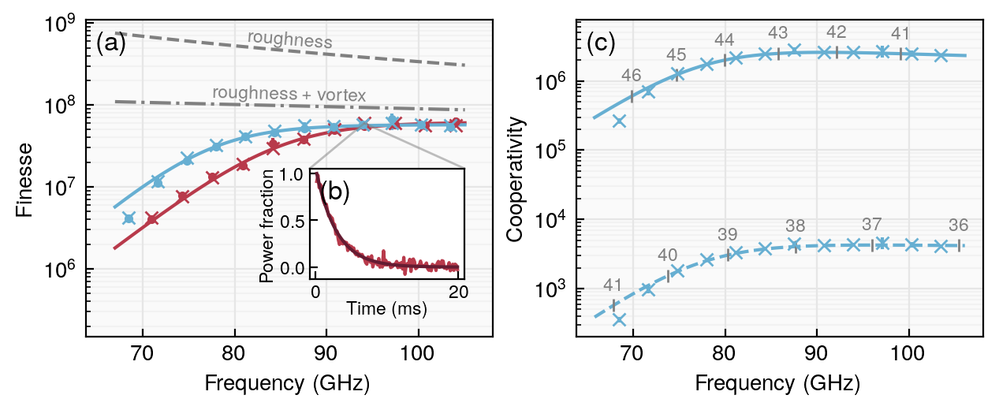

In [172]:
fig4_poster, axs = plt.subplots(
    figsize=(textwidth_mpl_in_poster * 0.75, textwidth_mpl_in_poster * 0.75 * 0.4),
    # figsize=(textwidth_mpl_in * 0.7, 3),
    ncols=2,
    gridspec_kw=dict(width_ratios=[5, 5]),
    sharex=True,
    squeeze=False,
    layout='constrained',
)
ax_best, ax_eta = axs.flatten()

ringdown_set_sweeps = [
    (gemina_rds, gemina_cav, (lambda q, _: 21 <= q <= 31), dict(color=gemina_color)),
    (hadriana_rds, hadriana_cav, (lambda q, _: 21 <= q <= 32), dict(color=hadriana_color)),
]

highest_finesse_subplot(
    ax_best,
    ringdown_set_sweeps,
    warm_lambda=warm_lambda,
    impure_lambda=impure_lambda,
    impure_xi=impure_xi,
    temperature=min_temp.n,
    roughness_rms=23e-9,
    uparams=cassia_mode_uparams_plot,
    avoided_crossing_fit=None,
    vortex_rrr=witness_sample_rrr,
    magnetic_flux_density=measured_b_perp,
    mean_defect_depth=exemplar_segment_length,
    plot_range_ghz=plot_range_ghz,
    minimal_limit_labels=True,
    ylim=(1.5e+5, 1.1e+9),
    vortex_offset_pts=(0, 3),
    roughness_offset_pts=(0, 3),
)
ax_best.set_xlabel('Frequency (GHz)')
ax_best.set_ylabel('Finesse')

rdset_sweep, position, modespec = (gemina_rds, -1.5, (28, -1))
collective_fit = rdset_sweep.collective_fits[position][modespec]
ax_ringdown = ax_best.inset_axes(
    (0.55, 0.18, 0.38, 0.35),
)

ringdown_plot(
    ax_ringdown,
    gemina_rds.collective_fits[-1.5][28, -1],
    data_kw=dict(color=gemina_color),
    model_kw=dict(color=colors.stanford.brick),
    max_t=20e-3,
)
ax_ringdown.set_xlabel(f'Time ({Units.MS.mplstr()})', labelpad=0, zorder=1)
ax_ringdown.set_ylabel('Power fraction', labelpad=1, zorder=1)
ax_ringdown.get_legend().set_visible(False)

ringdown_fontsize = 'small'
ax_ringdown.tick_params(labelsize=ringdown_fontsize, pad=2)
ax_ringdown.xaxis.label.set_size(ringdown_fontsize)
ax_ringdown.yaxis.label.set_size(ringdown_fontsize)
# ax_ringdown.legend(fontsize=ringdown_fontsize)
ax_ringdown.get_legend().set_visible(False)

# single_ringdown_inset(ax_ringdown, collective_fit, data_kw=dict(color=gemina_color))
freq = collective_fit.ringdown_set.frequency
finesse = rdset_sweep.geometry.fsr / collective_fit.fwhm()

inset_indicator = ax_best.indicate_inset(
    (freq / 1e+9, finesse, 0, 0),
    ax_ringdown,
)


serieses = [
    CircularTransitionSeries(
        cs, range(41, 47), plot_kw=dict(color=hadriana_color, linestyle='solid'),
    ),
    LowLTransitionSeries(
        cs, -1, (0, 0.5, 0.5), (1, 1.5, 0.5),
        n_range=range(36, 42),
        plot_kw=dict(color=hadriana_color, linestyle='dashed'),
    ),
]

def plot_mask(q, pol):
    return 21 <= q <= 32

hadriana_fit = fit_fig4_model(hadriana_cav, hadriana_rds.highest_finesse_values(plot_mask))
for series in serieses:
    hadriana_rds.cooperativity_plot(series, modes=range(21, 32+1), polarizations=[-1], finesse_func=lambda freq: hadriana_fit.eval(freq=freq), ax=ax_eta)


ax_eta.set_yscale('log')
ax_eta.set_ylim(None, ax_eta.get_ylim()[1] * 1.5)
ax_eta.set_xlabel('Frequency (GHz)')
ax_eta.set_ylabel('Cooperativity')
# ax_eta.legend()


fig4_poster.align_labels()
label_subplots(fig4_poster, [ax_best, ax_ringdown, ax_eta])

fig4_poster.patch.set_alpha(0)
# ax_best.patch.set_alpha(0)
# ax_eta.patch.set_alpha(0)

for ax in axs.flatten():
    style.make_paper_grids(ax)
    ax.patch.set_facecolor('0.98')
    # workaround to ensure that xticks are plotted over ygridlines
    # current matplotlib draws each axis as a unit
    ax.xaxis.set_zorder(ax.yaxis.get_zorder() + 0.01)

In [173]:
# fig4_poster.savefig('20250611-cavity-perf-poster.pdf', dpi=600)

### Just a smol ringdown for Emilio

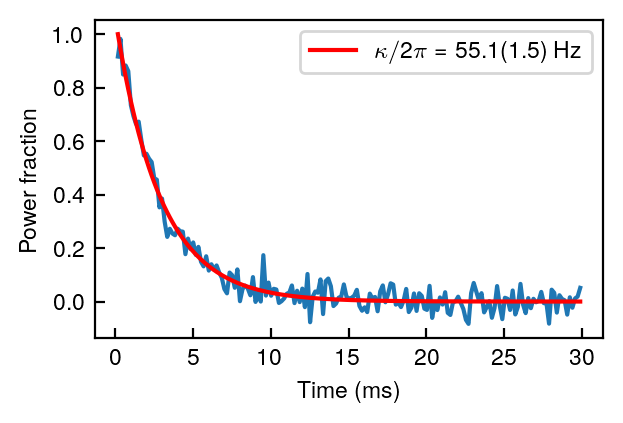

In [174]:
fig_emilio, ax = plt.subplots(figsize=(3, 2), layout='constrained')
single_ringdown_inset(ax, collective_fit)
ax.legend(fontsize='small')
# collective_fit.plot_fit(ax=ax, xscale=1e+3, )
# ax.set_yscale('linear')


In [175]:
# fig_emilio.savefig('20250403-tem-28-00y-ringdown.pdf')

### Figure 1, reconfigured for poster

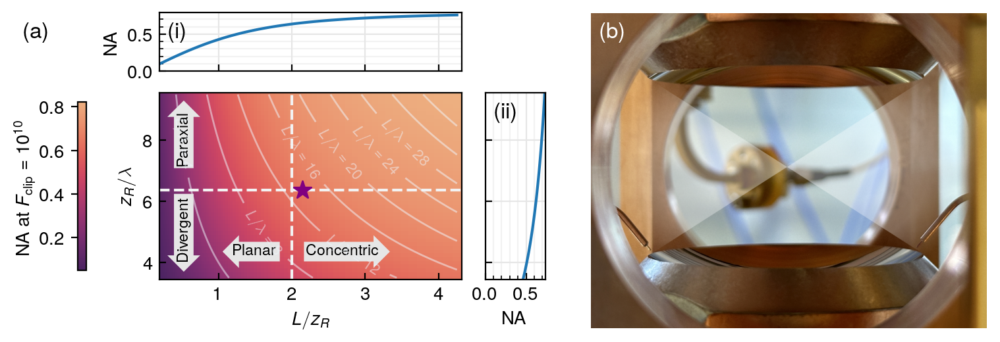

In [176]:
fig1_poster = plt.figure(
    layout='constrained',
    figsize=(textwidth_mpl_in_poster * 0.9, textwidth_mpl_in_poster * 0.9 / 3),
)
subfigs = fig1_poster.subfigures(
    1, 2,
    wspace=0.07,
    width_ratios=[2,1.5],
)


# target_freq = 90e+9
# target_wavelen = c / target_freq

# def x_to_g(x):
#     return (4 - x**2) / (4 + x**2)

# def g_to_x(g):
#     return 2 * np.sqrt((1-g)/(1+g))

# def lfunc(x, y):
#     return x * y * target_wavelen

# xvals = np.geomspace(0.2, 4, num=101)
# yvals = np.linspace(3.5, 10)

# pcolor_ax, ax_hcut, ax_vcut, _ = confocal_optimality_plot(
#     subfigs[0],
#     target_freq=target_freq,
#     target_geo=gemina_geo,
#     target_finesse=1e+10,
#     xfunc=(lambda g, length: g_to_x(g)),
#     yfunc=(lambda g, length: np.sqrt((1+g)/(1-g)) * length / (2 * target_wavelen)),
#     gfunc=(lambda x, y: x_to_g(x)),
#     lfunc=lfunc,
#     xvals=xvals,
#     yvals=yvals,
#     xlabel=r'$L/z_R$',
#     ylabel=R'$z_R/\lambda$',
#     # contours=(2**np.arange(10)),
#     cut_x=2,
# )


target_freq = 90e+9
target_wavelen = c / target_freq

def x_to_g(x):
    return (4 - x**2) / (4 + x**2)

def g_to_x(g):
    return 2 * np.sqrt((1-g)/(1+g))

def lfunc(x, y):
    return x * y * target_wavelen

xvals = np.geomspace(0.2, 4.25, num=101)
yvals = np.linspace(3.5, 9.5)

pcolor_ax, ax_hcut, ax_vcut, cbar = confocal_optimality_plot(
    subfigs[0],
    target_freq=target_freq,
    target_geo=gemina_geo,
    target_finesse=1e+10,
    xfunc=(lambda g, length: g_to_x(g)),
    yfunc=(lambda g, length: np.sqrt((1+g)/(1-g)) * length / (2 * target_wavelen)),
    gfunc=(lambda x, y: x_to_g(x)),
    lfunc=lfunc,
    xvals=xvals,
    yvals=yvals,
    xlabel=r'$L/z_R$',
    ylabel=R'$z_R/\lambda$',
    # contours=(2**np.arange(10)),
    cut_x=2,
    colorbar_kw=dict(location='left', shrink=0.9),
    gridspec_kw=dict(height_ratios=[1,3.2], width_ratios=[4,0.8]),
)
# pcolor_ax.tick_params(axis='y', which='both', color='0.5')
subfigs[0].align_xlabels()

# pcolor_ax.set_xlabel(R'$L/z_R$', labelpad=1)
# pcolor_ax.set_ylabel(R'$z_R/\lambda$', labelpad=1)
cbar.set_label(R'NA at $F_\text{clip} = 10^{10}$', labelpad=2.5)
cbar.ax.tick_params(which='both', direction='out')


# workaround to ensure that ticks are plotted over gridlines
# current matplotlib draws each axis as a unit
ax_hcut.xaxis.set_zorder(ax_hcut.yaxis.get_zorder() + 0.01)
ax_vcut.yaxis.set_zorder(ax_vcut.xaxis.get_zorder() + 0.01)

# pcolor_ax.set_xscale('log')


ax = subfigs[-1].subplots()
cavity_img = matplotlib.image.imread('img/cavity-photo-annotated.png')
ax.imshow(cavity_img)
ax.axis('off')

label_subplots(fig1_poster, subfigs, adjust=(8, -8), colors=['black', 'white'])

In [177]:
# fig1_poster.savefig('20250611-cavity-design-poster.pdf', dpi=600)

### Schematics of atoms in cavity

In [178]:
def curv_rad(z, w0, freq):
    k = 2 * pi * freq / c
    zr = 0.5 * k * w0**2
    return z + zr**2/z

def gaussian_beam(x, z, w0, freq):
    k = 2 * pi * freq / c
    zr = 0.5 * k * w0**2
    inv_curv_rad = z/(z**2 + zr**2)
    w = w0 * np.sqrt((z/zr)**2 + 1)
    
    gouy_phase = np.exp(1j * np.arctan(z/zr))
    phase_advance = np.exp(-1j * k * z)
    
    return (
        gouy_phase
        * phase_advance
        * (w0 / w)
        * np.exp(-x**2/w**2)
        * np.exp(-1j * k * x**2 * inv_curv_rad/ 2)
    )

def wavefront(q, w0, freq):
    k = 2 * pi * freq / c
    zr = 0.5 * k * w0**2
    def phase(z):
        k * z - np.arctan(z/zr) - q * pi/2
    
    return scipy.optimize.fsolve(phase, q * pi / 2 / k)[0]

In [179]:
# cmap = sns.light_palette(spirited_dark, as_cmap=True)
cmap = sns.color_palette('OrRd', as_cmap=True)

In [180]:
pcolormesh_kw = dict(cmap=sns.color_palette('OrRd', as_cmap=True), vmax=1.4)

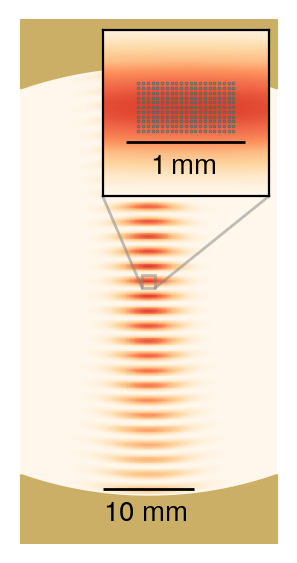

In [181]:
# fig, ax = plt.subplots(figsize=(textwidth_mpl_in * 0.2 * 0.72/0.75, 4.5))
fig, ax = plt.subplots(
    figsize=(
        textwidth_mpl_in_poster * 0.2,
        textwidth_mpl_in_poster * 0.2 * 2.7,
    ),
)

xmax = 14e-3

# TODO 5.08e-3 is hardcoded in cavity_diagram(); consider refactoring this
inset_width = 0.65
inset_height = inset_width * xmax/(5.08e-3 + hadriana_geo.length / 2) # * 15/50

inset_bottom = False
ax_inset = ax.inset_axes(
    [
    1 - inset_width - 0.03,
    0.02 if inset_bottom else 1 - inset_height - 0.02,
    inset_width,
    inset_height,
    ]
)
ax_inset.get_xaxis().set_visible(False)
ax_inset.get_yaxis().set_visible(False)

# ax_inset.set_aspect('equal')


cavity_diagram(
    ax,
    target_geo=hadriana_geo,
    target_mode=29,
    mirror_radius=xmax,  # hadriana_cav.mirror_radius,
    annotate=False,
    annotate_cavity=False,
    draw_cones=False,
    pcolormesh_kw=pcolormesh_kw,
)


inset_xlim = [-0.0007, 0.0007]
inset_ylim = [-0.00075, 0.00065]
cavity_diagram(
    ax_inset,
    target_geo=hadriana_geo,
    target_mode=29,  # 29, 0, 0
    mirror_radius=xmax,  # hadriana_cav.mirror_radius,
    annotate=False,
    annotate_cavity=False,
    draw_cones=False,
    x_range=np.linspace(*inset_xlim, 501),
    z_range=np.linspace(*inset_ylim, 501),
    pcolormesh_kw=pcolormesh_kw,
)
ax_inset.set_xlim(*inset_xlim)
ax_inset.set_ylim(*inset_ylim)
ax_inset.axis('on')

atoms_xy = np.meshgrid(
    np.linspace(-4e-4, +4e-4, num=21),
    np.linspace(-2e-4, +2e-4, num=11),
)

ax_inset.scatter(
    atoms_xy[0].flatten(),
    atoms_xy[1].flatten(),
    color=colors.stanford.palo_alto_green_light,
    s=0.25,
    marker='.',
)

asb_inset = AnchoredSizeBar(ax_inset.transData,
                      1e-3,
                      R"\SI{1}{\mm}",
                      loc='lower center',
                      pad=0.1, borderpad=0.5, sep=4,
                      frameon=False,
#                       bbox_to_anchor=Bbox.from_bounds(0, 0, 1, 1),
#                       bbox_transform=ax.figure.transFigure
                     )
ax_inset.add_artist(asb_inset)


# ax_inset.axis('off')

ax.indicate_inset_zoom(ax_inset)
# fig.colorbar(im)

# fig.tight_layout()

asb = AnchoredSizeBar(ax.transData,
                      0.01,
                      "10 mm",
                      loc=('upper center' if inset_bottom else 'lower center'),
                      pad=0.1, borderpad=0.5, sep=4,
                      label_top=inset_bottom,
                      frameon=False,
#                       bbox_to_anchor=Bbox.from_bounds(0, 0, 1, 1),
#                       bbox_transform=ax.figure.transFigure
                     )
ax.add_artist(asb)

# fig.savefig('cavity-field.pdf', pad_inches=0, bbox_inches='tight')
# 
# fig, ax = plt.subplots(figsize=(textwidth_mpl_in * 0.2 * 0.72/0.75, 4.5), layout='compressed')


In [182]:
# mode frequency for TEM(29, 0, 0) mode in Hadriana (g2) geometry
print(f'mode frequency: {hadriana_geo.paraxial_frequency(29, 0) / 1e+9:.3f} GHz')
print(f'waist w_0: {hadriana_geo.waist_radius_fromfreq(hadriana_geo.paraxial_frequency(29, 0)) * 1e+3:.3f} mm')

mode frequency: 93.888 GHz
waist w_0: 4.635 mm


In [183]:
# fig.savefig('20250611-cavity-diagram.pdf', bbox_inches='tight', pad_inches='layout', transparent=True, dpi=600)

In [184]:
lab_constants.stage_position_to_radius([-4.75, 4.75])

array([25.045, 15.545])

### Cavity schematic

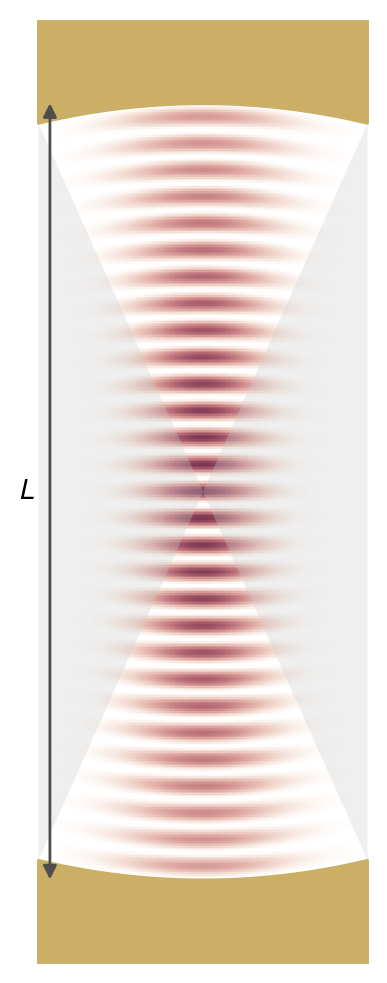

In [185]:
fig, ax = plt.subplots(layout='compressed')

cavity_diagram(
    ax,
    target_geo=hadriana_geo,
    target_mode=29,
    mirror_radius=10e-3,
    # mirror_radius=28e-3,
    annotate=False,
)

In [186]:
# fig.savefig('20250605-smol-mirrors.pdf', dpi=600, bbox_inches='tight')

In [187]:
# fig.savefig('20250605-big-mirrors.pdf', dpi=600, bbox_inches='tight')


In [188]:
far_field_z = hadriana_geo.z0 * 3
demo_freq = hadriana_geo.paraxial_frequency(29, 0)
demo_waist = np.sqrt(hadriana_geo.z0 * (c / demo_freq) / pi)
near_concentric_geo = SymmetricCavityGeometry(
    2 * far_field_z,
    curv_rad(far_field_z, demo_waist, demo_freq),
)

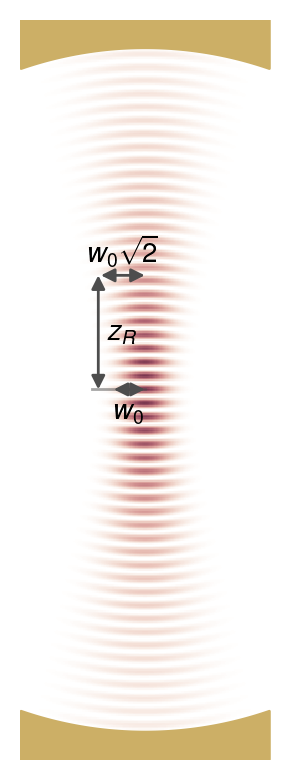

In [189]:
fig, ax = plt.subplots()
cavity_diagram(
    ax,
    near_concentric_geo,
    51,
    # mirror_radius=14e-3,
    draw_mirrors=True,
    annotate_cavity=False,
    draw_cones=False,
)

In [190]:
# savefig_tightly(fig, '20250609-gaussian-beam-diagram.pdf', dpi=600)